<font size = 15>Mineracao dos dados</font>

In [1]:
# biblotecas para manipulação de dados
import pandas as pd
import numpy as np

#Plottagem de mapas
import geopandas as gpd
import folium

#bibliotecas para os gráficos
import matplotlib.pyplot as plt
import plotnine as gg
import seaborn as sns


#bibliotecas auxiliares
import os
import re
import scipy
from unidecode import unidecode
from IPython.display import Image,display 
from scipy.stats import chi2_contingency
from itertools import product
from functools import reduce
from copy import deepcopy

#método para o modelo de regressao logistica
import statsmodels
from statsmodels.discrete.discrete_model import Logit as regressao_logistica


#pacote sklearn para tratamento dos dados
import sklearn
from sklearn.preprocessing import OneHotEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator,TransformerMixin

#metrica de independencia (Informação Mútua)
from sklearn.metrics import mutual_info_score

#Metricas de distancia entre distribuições de probabilidade
import gensim
from gensim.matutils import hellinger
from scipy.spatial.distance import jensenshannon

#Biblioteca propria
import sys
sys.path.append("../src/")
from eda.eda import describe,print_df
from io_pyarrow.io_pyarrow import read_table_to_pandas,write_table_from_pandas #leitura e escrita de arquivos csv grandes

%matplotlib inline
%reload_ext watermark
%watermark --iversions

gensim     : 4.1.2
re         : 2.2.1
pandas     : 1.3.2
geopandas  : 0.9.0
sys        : 3.7.4 (default, Aug  9 2019, 18:34:13) [MSC v.1915 64 bit (AMD64)]
folium     : 0.12.1
plotnine   : 0.7.1
statsmodels: 0.12.2
scipy      : 1.6.2
sklearn    : 0.24.1
matplotlib : 3.3.3
numpy      : 1.19.5
seaborn    : 0.11.1



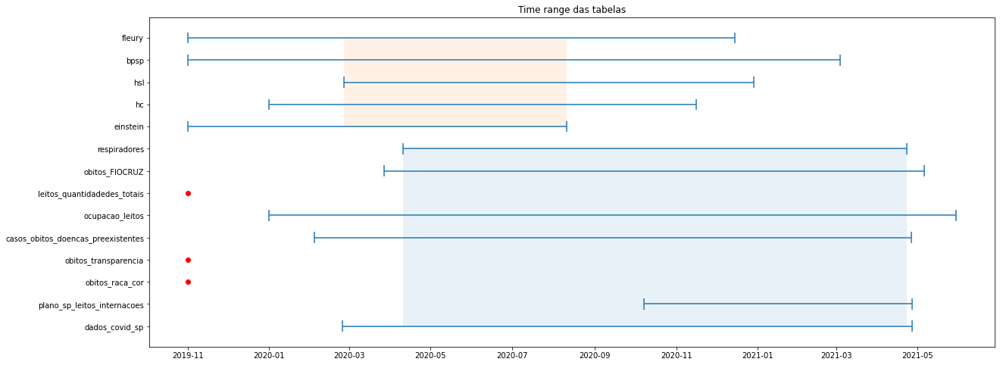

In [2]:
resumo=pd.DataFrame({"Tabela":   ["dados_covid_sp","plano_sp_leitos_internacoes","obitos_raca_cor","obitos_transparencia","casos_obitos_doencas_preexistentes","ocupacao_leitos",                                                      "leitos_quantidadedes_totais","obitos_FIOCRUZ","respiradores","einstein",   "hc",        "hsl",       "bpsp",      "fleury"],
                     "data":     ["S",             "S",                          "N",              "N",                   "S",                                  "S",                                                                   "N",                          "S",             "S",            "S",         "S",         "S",         "S",         "S"],
                     "data_min": ["2020-02-25",    "2020-10-08",                 "",               "",                    "2020-02-04",                         "2020-01-01",                                                          "",                           "2020-03-27",    "2020-04-10",   "2019-11-01","2020-01-01","2020-02-26","2019-11-01","2019-11-01"],
                     "data_max": ["2021-04-27",    "2021-04-27",                 "",               "",                    "2021-04-26",                         "2021-05-30",                                                          "",                           "2021-05-06",    "2021-04-23",   "2020-08-11","2020-11-16","2020-12-29","2021-03-04","2020-12-15"],
                     "Ano":      ["S",             "S",                          "N",              "S",                   "S",                                  "S",                                                                   "S",                          "S",             "S",            "S",         "S",         "S",         "S",         "S"],
                     "municipio":["S",             "N",                          "S",              "N",                   "S",                                  "S",                                                                   "S",                          "S",             "N",            "S",         "S",         "S",         "S",         "S"],
                     "drs":      ["S",             "S",                          "S",              "N",                   "S",                                  "S",                                                                   "S",                          "S",             "N",            "S",         "S",         "S",         "S",         "S"],
                     "uf":       ["S",             "S",                          "S",              "S",                   "S",                                  "S",                                                                   "S",                          "S",             "N",            "S",         "S",         "S",         "S",         "S"],
                     "Obs":      ["",              "",                           "",               "",                    "Data do início dos sintomas",        "Existe CNES e não munip. Realizar join com leitos_quantidades_totais","Há o mês também",            "",              "",             "",          "",          "",          "",          ""]})

resumo.data_min = pd.to_datetime(resumo.data_min)
resumo.data_max = pd.to_datetime(resumo.data_max)

def plot_linha_range_data(Ax,datamin,datamax,y,vline_size=0.25):
    Ax.vlines(ymin=y-vline_size,ymax=y+vline_size,x = datamin)
    Ax.vlines(ymin=y-vline_size,ymax=y+vline_size,x = datamax)
    Ax.hlines(xmin=datamin,xmax=datamax,y=y)

def plot_range_data(df,fill=[]):
    _,Ax = plt.subplots(figsize = (20,8))
    for i,linha in df.iterrows():
        if(linha.data_min != linha.data_min):
            Ax.scatter(df.data_min.min(),i,c="red")
        else:
            plot_linha_range_data(Ax,linha.data_min,linha.data_max,i)

    for area in fill:
        Ax.fill_between(x = [df.query("Tabela == '%s'" % area["tabela_data_min"]).data_min.iloc[0],df.query("Tabela == '%s'" % area["tabela_data_max"]).data_max.iloc[0]],
                        y1 = [df.query("Tabela == '%s'" % area["tabela_y1"]).index[0]]*2,
                        y2 = [df.query("Tabela == '%s'" % area["tabela_y2"]).index[0]]*2,
                        alpha=0.1)

    Ax.set_yticks(range(df.shape[0]))
    Ax.set_yticklabels(df.Tabela.tolist())
    Ax.set_title("Time range das tabelas")
    plt.show()
    
plot_range_data(resumo,[{"tabela_data_min":"respiradores",
                         "tabela_data_max": "respiradores",
                         "tabela_y1": "respiradores",
                         "tabela_y2": "dados_covid_sp"},
                        {"tabela_data_min":"hsl",
                         "tabela_data_max": "einstein",
                         "tabela_y1": "fleury",
                         "tabela_y2": "einstein"}])

__Neste jupyter notebook iremos analisar os dados pertencentes às tabelas e aos períodos da área em <font color = blue>azul</font>. Abaixo, encontra-se o dicionário de dados da tabela casos_agrupados.parquet__

            
<table>
    <thead>
        <tr> <th>Tabela de origem <th>Fonte <th>Coluna <th> Descrição
    </thead>
    <tbody>
        <tr> <td rowspan=15>Painel da COVID 
             <td rowspan=15>
                  <a href="https://bigdata.icict.fiocruz.br/covid-19">
                    <div style="height:100%;width:100%">
                      https://bigdata.icict.fiocruz.br/covid-19
                    </div>
                  </a> 
            <td>regiao_FIOCRUZ 
            <td>Região do Brasil
        <tr>
            <td>estado_FIOCRUZ
            <td>Estado do município
        <tr>
            <td>municipio_FIOCRUZ 
            <td>Nome do município
        <tr> 
            <td>coduf_FIOCRUZ 
            <td>Código da Unidade Federativa
        <tr> 
            <td>codmun_FIOCRUZ 
            <td>Código do município
        <tr> 
            <td>codRegiaoSaude_FIOCRUZ 
            <td>Código da Regional de Saúde a que o Município de residência do paciente pertence
        <tr> 
            <td>nomeRegiaoSaude_FIOCRUZ
            <td>Nome da Regional de Saúde a que o Município de residência do paciente pertence
        <tr> 
            <td>data_FIOCRUZ
            <td>Data referente aos casos diagnosticados
        <tr> 
            <td>semanaEpi_FIOCRUZ
            <td>Número da n-ésima semana da pandemia
        <tr> 
            <td>populacaoTCU2019_FIOCRUZ
            <td>População do município estimada para o ano de 2019
        <tr> 
            <td>casosAcumulado_FIOCRUZ
            <td>Quantidade de casos acumulado ao longo de toda a pandemia para aquele município
        <tr> 
            <td>casosNovos_FIOCRUZ
            <td>Os novos casos daquele dia para aquele município
        <tr> 
            <td>obitosAcumulado_FIOCRUZ
            <td>Quantidade de óbitos acumulados ao longo de toda a pandemia para aquele município
        <tr> 
            <td>obitosNovos_FIOCRUZ
            <td>Os novos óbitos daquele dia para aquele município
        <tr> 
            <td>interior_metropolitana_FIOCRUZ
            <td>Classificação se a cidade pertence ao interior ou a uma região metropolitana
        <tr> 
            <td rowspan=28>COVID-19 EM SP 
             <td rowspan=45>
                  <a href="https://www.seade.gov.br/coronavirus/">
                    <div style="height:100%;width:100%">
                      https://www.seade.gov.br/coronavirus/
                    </div>
                  </a> 
            <td>codigo_ibge_sp 
            <td>Código do IBGE para aquela cidade       
        <tr> 
            <td>dia_sp
            <td>Data de preenchimento da ficha de notificação
        <tr> 
            <td>mes_sp
            <td>Referido mês do preenchimento da ficha de notificação
        <tr> 
            <td>casos_sp
            <td>Casos totais registrados até a data
        <tr> 
            <td>casos_novos_sp
            <td>Novos casos do referido dia no município
        <tr> 
            <td>casos_pc_sp
            <td>Casos totais por 100 mil habitantes        
        <tr> 
            <td>casos_mm7d_sp
            <td>Média móvel dos últimos 7 dias dos novos casos
        <tr> 
            <td>obitos_sp
            <td>Óbitos totais registrados até a data
        <tr> 
            <td>obitos_novos_sp
            <td>Óbitos novos registrados na data
        <tr> 
            <td>obitos_pc_sp
            <td>Óbitos totais por 100 mil habitantes
        <tr> 
            <td>obitos_mm7d_sp
            <td>Média móvel dos últimos 7 dias dos novos óbitos        
        <tr> 
            <td>letalidade_sp
            <td>casos / obitos
        <tr> 
            <td>nome_ra_sp
            <td>Nome da Região Administrativa
        <tr> 
            <td>cod_ra_sp
            <td>Código da Região Administrativa
        <tr> 
            <td>nome_drs_sp
            <td>Nome do Dpto. Regional de Saúde
        <tr> 
            <td>cod_drs
            <td>Código do Dpto. Regional de Saúde      
        <tr> 
            <td>pop_sp
            <td>População Estimada (fonte: SEADE)         
        <tr> 
            <td>pop_60_sp
            <td>População acima de 60 anos (fonte: SEADE)          
        <tr> 
            <td>area_sp
            <td>Área do município em Km²
        <tr> 
            <td>map_leg_sp
            <td>Rótulo da legenda para mapa        
        <tr> 
            <td>map_leg_s_sp
            <td>Código da legenda para mapa        
        <tr> 
            <td>latitude
            <td>Latitude        
        <tr> 
            <td>longitude
            <td>Longitude        
        <tr> 
            <td>semana_epidem
            <td>Semana Epidemológica        
        <tr> 
            <td>Municípios_sp
            <td>Nome dos municípios de SP normalizados para realização do join       
        <tr> 
            <td>densi_pop_sp
            <td>População / Area
        <tr> 
            <td>densi_pop_60_sp
            <td>População acima de 60 anos / Area
        <tr> 
            <td>perc_60_sp
            <td>População acima de 60 anos / População
        <tr> 
            <td rowspan=17>COMORBIDADES 
            <td>codigo_ibge_pre 
            <td>Código do IBGE para aquela cidade
        <tr> 
            <td>idade_pre
            <td>Idade do paciente notificado com COVID-19
        <tr> 
            <td>cs_sexo_pre
            <td>Gênero do paciente
        <tr> 
            <td>obito_pre
            <td>Paciente veio a óbito? Sim(1)/Não(0)
        <tr> 
            <td>asma_pre
            <td>Constatação se o paciente possui asma        
        <tr> 
            <td>cardiopatia_pre
            <td>Constatação se o paciente possui alguma cardiopatia        
        <tr> 
            <td>diabetes_pre
            <td>Constatação se o paciente possui diabetes        
        <tr> 
            <td>doenca_hematologica_pre
            <td>Constatação se o paciente possui alguma doença hematológica        
        <tr> 
            <td>doenca_hepatica_pre
            <td>Constatação se o paciente possui alguma doença hepática        
        <tr> 
            <td>doenca_neurologica_pre
            <td>Constatação se o paciente possui alguma doença neurológica        
        <tr> 
            <td>doenca_renal_pre
            <td>Constatação se o paciente possui alguma doença renal        
        <tr> 
            <td>imunodepressao_pre
            <td>Constatação se o paciente possui imunodepressão        
        <tr> 
            <td>obesidade_pre
            <td>Constatação se o paciente é obeso       
        <tr> 
            <td>outros_fatores_de_risco_pre
            <td>Constatação se o paciente possui outros fatores de risco        
        <tr> 
            <td>pneumopatia_pre
            <td>Constatação se o paciente possui alguma pneumopatia       
        <tr> 
            <td>sindrome_de_down_pre
            <td>Constatação se o paciente possui síndrome de Down
        <tr> 
            <td>estado
            <td>UF do paciente
        <tr> 
            <td rowspan=6>RESPIRADORES 
            <td rowspan=6>
                  <a href="https://opendatasus.saude.gov.br/dataset">
                    <div style="height:100%;width:100%">
                      https://opendatasus.saude.gov.br/dataset
                    </div>
                  </a> 
            <td>QUANTIDADE_TIPO_TRANSPORTE_respiradores_pedido 
            <td>Quantidade de equipamentos, caso o tipo seja "TRANSPORTE", considerando a data do pedido
        <tr> 
            <td>QUANTIDADE_TIPO_UTI_respiradores_pedido
            <td>Quantidade de equipamentos, caso o tipo seja "UTI", considerando a data do pedido
        <tr> 
            <td>QUANTIDADE_TIPO_TRANSPORTE_USA_respiradores_pedido
            <td>Quantidade de equipamentos, caso o tipo seja "USA", considerando a data do pedido        
        <tr> 
            <td>QUANTIDADE_TIPO_TRANSPORTE_respiradores_entrega
            <td>Quantidade de equipamentos, caso o tipo seja "TRANSPORTE", considerando a data da entrega       
        <tr> 
            <td>QUANTIDADE_TIPO_UTI_respiradores_entrega
            <td>Quantidade de equipamentos, caso o tipo seja "UTI", considerando a data da entrega        
        <tr> 
            <td>QUANTIDADE_TIPO_TRANSPORTE_USA_respiradores_entrega
            <td>Quantidade de equipamentos, caso o tipo seja "USA", considerando a data da entrega 
    </tbody>
</table>

__Para unir as tabelas, foram utilizadas as informações de data e município. Para as bases da FIOCRUZ e os dados de São Paulo, a data se refere ao dia da notificação dos casos, enquanto que na base de COMORBIDADES, esta data está relacionada ao inicio dos sintomas anotado__

In [3]:
casos = read_table_to_pandas("../data/interim/casos_agrupados.parquet")

In [4]:
pd.set_option('display.max_rows', 100)
describe(casos)

Quantidade de linhas: 2111030


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,regiao_FIOCRUZ,object,0,0.0%,5,-,-,-,-,-,-,-,-,-,-
1,estado_FIOCRUZ,object,0,0.0%,27,-,-,-,-,-,-,-,-,-,-
2,municipio_FIOCRUZ,object,0,0.0%,5289,-,-,-,-,-,-,-,-,-,-
3,coduf_FIOCRUZ,int64,0,0.0%,27,11,25.0,31.0,32.377738,41.0,53,9.832981,0.15,-0.52,3.29
4,codmun_FIOCRUZ,float64,0,0.0%,5570,110001.0,251210.0,314627.5,325358.627828,411920.0,530010.0,98482.215601,0.12,-0.53,3.3
5,codRegiaoSaude_FIOCRUZ,float64,0,0.0%,450,11001.0,25010.0,31059.0,32403.123698,41015.0,53001.0,9836.343636,0.14,-0.52,3.29
6,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,440,-,-,-,-,-,-,-,-,-,-
7,data_FIOCRUZ,datetime64[ns],0,0.0%,379,2020-04-10 00:00:00,2020-07-13 00:00:00,2020-10-16 00:00:00,2020-10-16 00:00:00.000000256,2021-01-19 00:00:00,2021-04-23 00:00:00,109 days 09:46:49.821845014,-,-,-
8,semanaEpi_FIOCRUZ,int64,0,0.0%,53,1,14.0,26.0,26.762533,40.0,53,15.221034,0.04,-1.2,1.76
9,populacaoTCU2019_FIOCRUZ,float64,0,0.0%,5077,781.0,5446.0,11631.0,37728.388689,25492.0,12252023.0,221438.231806,37.23,1829.97,0.17


Para esses casos, vamos estudar apenas a cidade de São Paulo e seus arredores. Essa região foi selecionada pois:
* A base de dados do SEADE contemplar exatamente municípios do estado de São Paulo;
* A região ser a mais representativa do estado, populacionalmente;
* As bases de dados das instituições possuem pacientes de várias regiões do Brasil, mas a concentração de pacientes encontra-se em São Paulo, Rio de Janeiro e Recife, como pode ser observado nos mapas abaixo:



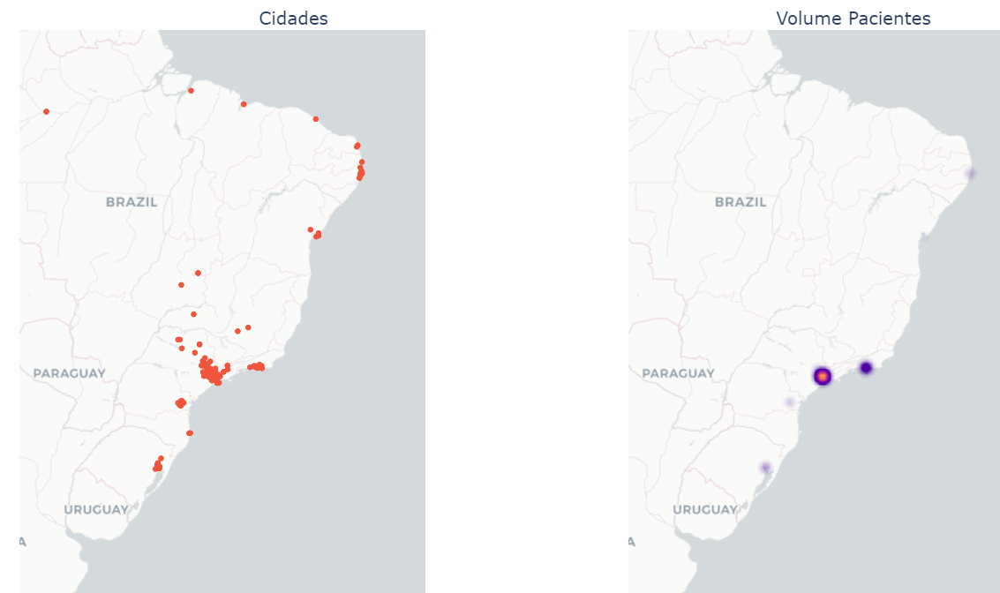

In [5]:
display(Image(filename="../data/image/localidades_pacientes_exames_todo.png"))

In [6]:
casos_sp = casos.query("estado_FIOCRUZ == 'SP'")
geo = gpd.read_file("../data/raw/Shapefile_Brasil/BR_Municipios_2020.shp")
geo_sp = geo.query("SIGLA_UF == 'SP'")
geo_sp = geo_sp.assign(municipio = lambda x: x.NM_MUN.apply(lambda y: unidecode(y.upper()))).merge(casos_sp[['municipio_FIOCRUZ','nomeRegiaoSaude_FIOCRUZ']].drop_duplicates(),
                                                                                          right_on = 'municipio_FIOCRUZ',
                                                                                          left_on = 'municipio').drop(columns = "municipio_FIOCRUZ")

In [7]:
colormap = pd.Series(['red','blue','green','yellow','black','brown','magenta','purple','pink',
           'orange','white',"gray",'steelblue','gold',"silver",'olive','springgreen',
           'darkgray','darkred','darkgreen','darkblue','darkyellow','goldenrod',
           'fuchsia','violet','indigo','peru','salmon','tomato','darkolivegreen',
           'wheat','tan','darkorange','bisque','forestgreen','lightsteelblue',
           'hotpink','crimson','aliceblue','honeydew','peachpuff','linen',
           'sandybrown','saddlebrown','chocolate','seashell','sienna','moccasin',
           'lime','azure','teal','aqua','cyan','lightblue','navy',
           'lavender','yellowgreen','dodgerblue','lavenderblush','blueviolet',
           'limegreen','rosybrown','lightcoral'],index=casos_sp.nomeRegiaoSaude_FIOCRUZ.unique()).to_dict()
query_arredores_sp = "nomeRegiaoSaude_FIOCRUZ == 'SAO PAULO' | nomeRegiaoSaude_FIOCRUZ == 'ALTO DO TIETE' | nomeRegiaoSaude_FIOCRUZ == 'FRANCO DA ROCHA' | 'GRANDE ABC' == nomeRegiaoSaude_FIOCRUZ | 'MANANCIAIS' == nomeRegiaoSaude_FIOCRUZ | 'ROTA DOS BANDEIRANTES' == nomeRegiaoSaude_FIOCRUZ"

In [8]:
def style_func(x):
    return {'fillColor': colormap[x["properties"]['nomeRegiaoSaude_FIOCRUZ']],'weight':0.1, "fillOpacity": 0.5}


m_sp = folium.Map(location=[-22, -48], zoom_start=7, tiles='CartoDB positron')
folium.GeoJson(geo_sp.dissolve(),
               style_function = lambda x: {'fillColor': "white"}
              ).add_to(m_sp)
folium.GeoJson(geo_sp.query(query_arredores_sp),
               style_function=style_func,
               tooltip=folium.GeoJsonTooltip(fields=['NM_MUN', 'nomeRegiaoSaude_FIOCRUZ'],
                                             aliases=['NM_MUN', 'nomeRegiaoSaude_FIOCRUZ'],
                                             localize=True)
              ).add_to(m_sp)
print("Está será a região selecionada, contendo São Paulo e cidades em torno")
m_sp

Está será a região selecionada, contendo São Paulo e cidades em torno


In [8]:
casos_sp_ = casos_sp.query(query_arredores_sp).reset_index(drop=True)

As cidades a serem analisadas neste estudo são as seguintes. Além disso, o período de análise compreende, conforme informação acima, entre os dias <font color = blue><b>10/04/2020</b></font> e <font color = blue><b>23/04/2021</b></font>

In [9]:
casos_sp_.municipio_FIOCRUZ.unique()

array(['ARUJA', 'BARUERI', 'BIRITIBA MIRIM', 'CAIEIRAS', 'CAJAMAR',
       'CARAPICUIBA', 'COTIA', 'DIADEMA', 'EMBU DAS ARTES', 'EMBU-GUACU',
       'FERRAZ DE VASCONCELOS', 'FRANCISCO MORATO', 'FRANCO DA ROCHA',
       'GUARAREMA', 'GUARULHOS', 'ITAPECERICA DA SERRA', 'ITAPEVI',
       'ITAQUAQUECETUBA', 'JANDIRA', 'JUQUITIBA', 'MAIRIPORA', 'MAUA',
       'MOGI DAS CRUZES', 'OSASCO', 'PIRAPORA DO BOM JESUS', 'POA',
       'RIBEIRAO PIRES', 'RIO GRANDE DA SERRA', 'SALESOPOLIS',
       'SANTA ISABEL', 'SANTANA DE PARNAIBA', 'SANTO ANDRE',
       'SAO BERNARDO DO CAMPO', 'SAO CAETANO DO SUL',
       'SAO LOURENCO DA SERRA', 'SAO PAULO', 'SUZANO', 'TABOAO DA SERRA',
       'VARGEM GRANDE PAULISTA'], dtype=object)

In [10]:
describe(casos_sp_)

Quantidade de linhas: 14781


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,regiao_FIOCRUZ,object,0,0.0%,1,-,-,-,-,-,-,-,-,-,-
1,estado_FIOCRUZ,object,0,0.0%,1,-,-,-,-,-,-,-,-,-,-
2,municipio_FIOCRUZ,object,0,0.0%,39,-,-,-,-,-,-,-,-,-,-
3,coduf_FIOCRUZ,int64,0,0.0%,1,35,35.0,35.0,35.0,35.0,35,0.0,0,0,0
4,codmun_FIOCRUZ,float64,0,0.0%,39,350390.0,351510.0,352620.0,352928.205128,354680.0,355645.0,1603.766487,0.12,-1.42,220.06
5,codRegiaoSaude_FIOCRUZ,float64,0,0.0%,6,35011.0,35011.0,35013.0,35012.923077,35014.0,35016.0,1.542355,0.13,-1.26,22700.95
6,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,6,-,-,-,-,-,-,-,-,-,-
7,data_FIOCRUZ,datetime64[ns],0,0.0%,379,2020-04-10 00:00:00,2020-07-13 00:00:00,2020-10-16 00:00:00,2020-10-16 00:00:00.000000256,2021-01-19 00:00:00,2021-04-23 00:00:00,109 days 09:52:07.361274200,-,-,-
8,semanaEpi_FIOCRUZ,int64,0,0.0%,53,1,14.0,26.0,26.762533,40.0,53,15.221545,0.04,-1.2,1.76
9,populacaoTCU2019_FIOCRUZ,float64,0,0.0%,39,15825.0,69385.0,161127.0,557299.538462,370821.0,12252023.0,1916366.714083,5.82,32.58,0.29


Quantidade de linhas: 14781

Nota-se um volume de quase 100% de dados faltantes para as bases de respiradores. Isso ocorre pois as informações 
presentes nas bases de dados não referenciam a todas as cidades que receberam respiradores: algumas localidades estão
marcadas como Secretaria Estadual de Saúde, não deixando claro a cidade em si


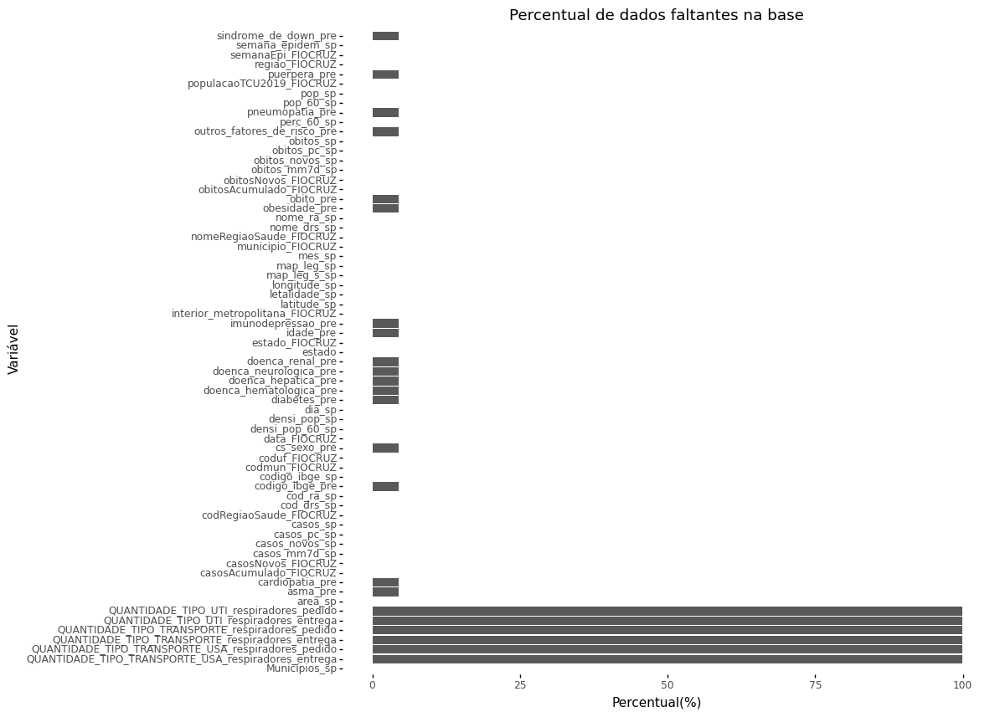

In [11]:
resumo_casos_sp_ = describe(casos_sp_).assign(na_pct = lambda x: pd.to_numeric(x["na_pct"].str.replace("%","")))
(
    gg.ggplot(resumo_casos_sp_)
    +gg.geom_col(mapping=gg.aes(x = "variable",y = "na_pct"))
    +gg.coord_flip()
    +gg.theme(figure_size=(10,10), panel_background=gg.element_blank())
    +gg.ggtitle("Percentual de dados faltantes na base")
    +gg.xlab("Variável") + gg.ylab("Percentual(%)")
).draw()
print("""\nNota-se um volume de quase 100% de dados faltantes para as bases de respiradores. Isso ocorre pois as informações 
presentes nas bases de dados não referenciam a todas as cidades que receberam respiradores: algumas localidades estão
marcadas como Secretaria Estadual de Saúde, não deixando claro a cidade em si""")

# Histograma das idades das pessoas que contrairam a doença

In [12]:
english = True

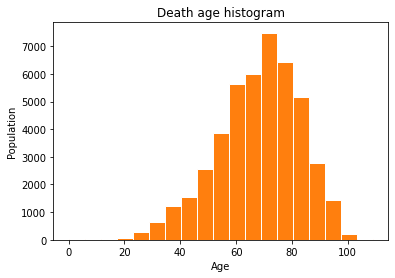

A distribuição de óbitos na região selecionada tem uma cauda a esquerda, evidenciando que a maior parte dos óbitos 
ocorre com pessoas mais velhas


In [13]:
def retorna_dados_lista(name,lista_idade,indice_lista):
    if(len(indice_lista[0]) == 0):
        return np.nan
    else:
        return lista_idade[indice_lista]

def df_explode_idade(df,obito=None):
    return df.query("obito_pre == obito_pre") \
                 .assign(index = lambda x: x["obito_pre"].apply(lambda y: np.where(y == obito) if obito is not None 
                                                                                           else np.where(y >= 0))) \
                 .assign(idade = lambda x: x.apply(lambda y: retorna_dados_lista(y.name,
                                                                                 y['idade_pre'],
                                                                                 y['index']),
                                                         axis=1),
                        sexo = lambda x: x.apply(lambda y: retorna_dados_lista(y.name,
                                                                                 y['cs_sexo_pre'],
                                                                                 y['index']),
                                                         axis=1)).explode(["idade","sexo"])

def hist_individuos_contaminados(df,title,obito=None):
    df_explode_idade(df,obito).idade.hist(bins=19,color = "C1",edgecolor = "white")
    plt.title(title)
    if english:
        xlabel = "Age"
        ylabel = "Population"
    else:
        xlabel = "Idade"
        ylabel = "População"
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(b=None)
    plt.show()
    

hist_individuos_contaminados(casos_sp_,"Death age histogram",1)
print("""A distribuição de óbitos na região selecionada tem uma cauda a esquerda, evidenciando que a maior parte dos óbitos 
ocorre com pessoas mais velhas""")

Os casos que vieram a óbito nas cidades arredores de São Paulo seguem uma distribuição de faixa etaria diferente da pirâmide etária do estado de São Paulo, acometendo principalmente os mais idosos

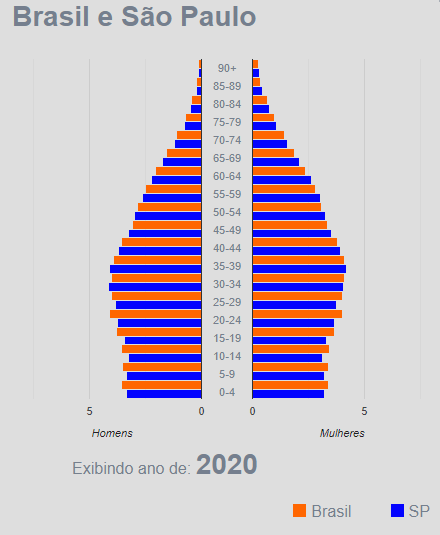

Fonte: https://www.ibge.gov.br/


In [14]:
display(Image(filename="../data/image/piramide_etaria.png"))
print ("Fonte: https://www.ibge.gov.br/")

Vejamos uma pirâmide, só que para as cidades mapeadas em torno da cidade de São Paulo, conforme apresentado no mapa acima

In [15]:
def constroi_faixa_etaria(b):
    fe = []
    for b0,b1 in zip(b,b[1:]):
        if b0 > 0:
            b_menor = b0 + 1
        else:
            b_menor = b0
        b_maior = b1
        
        if b_maior == np.inf:
            fe.append("%s anos ou mais" % (b_menor))
        else:
            fe.append("%s a %s anos"%(b_menor,b_maior))
    
    return fe

In [16]:
# piramide = pd.read_excel("../data/raw/Piramide_SP/populacao_censo2010_piramide.xlsx")


    
# bins = [0,4,9,14,19,24,29,34,39,44,49,54,59,64,69,74,79,89,99,np.inf]
# faixa_etaria = constroi_faixa_etaria(bins)

# piramide = piramide.assign(Estado = lambda x: x["Município"].apply(lambda y: re.search("(\()([A-Z]{2})(\))",y).group(2)),
#                            Municipio_ = lambda x: x["Município"].apply(lambda y: re.search("(.*)(\()",y).group(1))) \
#                    .assign(cidade = lambda x: x["Municipio_"].apply(lambda y: unidecode(y).upper().strip()),
#                            Populacao = lambda x: pd.to_numeric(x["Populacao"],errors='coerce').fillna(0))
# piramide_ = piramide[piramide.cidade.isin(casos_sp_.municipio_FIOCRUZ.unique())].query("Estado == 'SP'")
# piramide_ = piramide_.groupby(["Sexo","Idade"])["Populacao"].sum().reset_index() \
#                      .assign(Idade = lambda x: pd.Categorical(x["Idade"],categories=faixa_etaria,ordered=True))
# print('Fonte: https://sidra.ibge.gov.br/')
# piramide_.head()

In [17]:
piramide = pd.read_excel("../data/raw/Piramide_SP/populacao_seade_2021.xlsx")


    
bins = [0,4,9,14,19,24,29,34,39,44,49,54,59,64,69,74,79,84,89,np.inf]
faixa_etaria = constroi_faixa_etaria(bins)

piramide = piramide.assign(Estado = lambda x: x["Município"].apply(lambda y: re.search("(\()([A-Z]{2})(\))",y).group(2)),
                           Municipio_ = lambda x: x["Município"].apply(lambda y: re.search("(.*)(\()",y).group(1))) \
                   .assign(cidade = lambda x: x["Municipio_"].apply(lambda y: unidecode(y).upper().strip()),
                           Populacao = lambda x: pd.to_numeric(x["Populacao"],errors='coerce').fillna(0))
piramide_ = piramide[piramide.cidade.isin(casos_sp_.municipio_FIOCRUZ.unique())].query("Estado == 'SP'")
piramide_ = piramide_.groupby(["Sexo","Idade"])["Populacao"].sum().reset_index() \
                     .assign(Idade = lambda x: pd.Categorical(x["Idade"],categories=faixa_etaria,ordered=True))
print('Fonte: https://populacao.seade.gov.br/')
piramide_.head()

Fonte: https://populacao.seade.gov.br/


,Sexo,Idade,Populacao
0,Homens,0 a 4 anos,716536.0
1,Homens,10 a 14 anos,664881.0
2,Homens,15 a 19 anos,698521.0
3,Homens,20 a 24 anos,825534.0
4,Homens,25 a 29 anos,824602.0


In [18]:
# mortalidade = pd.read_excel("../data/raw/Piramide_SP/Mortes2019.xlsx")
# mortalidade = mortalidade.melt(id_vars = ["Municipio","Idade"],value_vars = ["Homens","Mulheres"],
#                                var_name="Sexo",value_name = "Populacao")

# mortalidade.Idade = mortalidade.Idade.replace({'Menos de 1 ano':'0 a 4 anos',
#                                                '1 a 4 anos':'0 a 4 anos',
#                                                '90 a 94 anos':'90 anos ou mais',
#                                                '95 a 99 anos':'90 anos ou mais',
#                                                '100 anos ou mais': '90 anos ou mais'})
    

# mortalidade = mortalidade.assign(Estado = lambda x: x["Municipio"].apply(lambda y: re.search("(\()([A-Z]{2})(\))",y).group(2)),
#                            Municipio_ = lambda x: x["Municipio"].apply(lambda y: re.search("(.*)(\()",y).group(1))) \
#                    .assign(cidade = lambda x: x["Municipio_"].apply(lambda y: unidecode(y).upper().strip()),
#                            Populacao = lambda x: pd.to_numeric(x["Populacao"],errors='coerce').fillna(0))
# mortalidade_ = mortalidade[mortalidade.cidade.isin(casos_sp_.municipio_FIOCRUZ.unique())].query("Estado == 'SP'")
# mortalidade_ = mortalidade_.groupby(["Sexo","Idade"])["Populacao"].sum().reset_index() \
#                      .assign(Idade = lambda x: pd.Categorical(x["Idade"],categories=faixa_etaria,ordered=True))

# mortalidade_.head()

In [19]:
#Vamos pegar a projeção esperada dentro do período de análise (10/04/2020 - 23/04/2021)
mortalidade_esperada = pd.read_csv("../data/interim/expectativa_mortes_HoltWinters.csv").drop(columns = "Unnamed: 0")
mortalidade_esperada = mortalidade_esperada.assign(AnoMes = lambda x: x["AnoMes"].astype("datetime64"))\
                                           .pipe(lambda x: x[(x["AnoMes"] >= "2020-04-01") & (x["AnoMes"] <= "2021-04-01")])

mortalidade_ = mortalidade_esperada.rename(columns = {"Genero":"Sexo","previsao":"Populacao"})\
                                .groupby(["Sexo","Idade"])["Populacao"].sum().reset_index() \
                                .assign(Idade = lambda x: pd.Categorical(x["Idade"],categories=faixa_etaria,ordered=True))

mortalidade_.head()

,Sexo,Idade,Populacao
0,Homens,0 a 4 anos,2093.771445
1,Homens,10 a 14 anos,134.178541
2,Homens,15 a 19 anos,391.749845
3,Homens,20 a 24 anos,801.112061
4,Homens,25 a 29 anos,718.016596


In [20]:
def plot_piramide_etaria(df,qtd,xlabel = "Population",global_title = "",save = None):
    fig,ax = plt.subplots(ncols=2,nrows=1,figsize=(10,5))
    
    df_ = df.sort_values("Idade")
    if(english == True):
        df_.Idade = df_.Idade.str.replace(" a ", " to ").str.replace("anos","years").str.replace("ou mais","or more")
    ax = ax.flatten()
    ax[1].barh(y = df_.query("Sexo == 'Homens'").Idade, 
               width = df_.query("Sexo == 'Homens'")[qtd])
    ax[1].set_xlim([0,df_[qtd].max()])
    ax[1].set(frame_on=False)
    if(english == True):
        ax[1].set_title("Male")
    else:
        ax[1].set_title("Homens")
    ax[1].get_yaxis().set_visible(False)
    

    ax[0].barh(y = df_.query("Sexo == 'Mulheres'").Idade, 
               width = df_.query("Sexo == 'Mulheres'")[qtd],color='pink')
    ax[0].set_xlim([0,df_[qtd].max()])
    ax[0].invert_xaxis()
    ax[0].set(frame_on=False)
    if(english == True):
        ax[0].set_title("Female")
    else:
        ax[0].set_title("Mulheres")
    fig.subplots_adjust(wspace  = 0.)
    meio_xlabel = int(len(xlabel)/2)
    ax[0].set_xlabel(xlabel[:meio_xlabel],loc = 'right')
    ax[1].set_xlabel(xlabel[meio_xlabel:],loc = 'left')
    
    if (save == None):
        fig.suptitle(global_title, fontsize="x-large")
    else:
        plt.savefig(save,bbox_inches = "tight")

# print("Nota-se que a pirâmide etária das cidades selecionadas possui alguma semelhança com a pirâmide etária do estado de SP")
# plot_piramide_etaria(piramide_,"Populacao",global_title = "Pirâmide etária - Cidades Analisadas - CENSO 2010")
# plt.show()
# print('Fonte: https://sidra.ibge.gov.br/')

A pirâmide etária de 2021 possui algumas diferenças com relação a de 2010
Esta apresenta uma base mais achatada e a moda deslocou-se para a faixa dos 35-39 anos, ou seja,
As mesmas pessoas que compunham a moda a 10 anos atrás são os que compõem agora com esse dado estimado


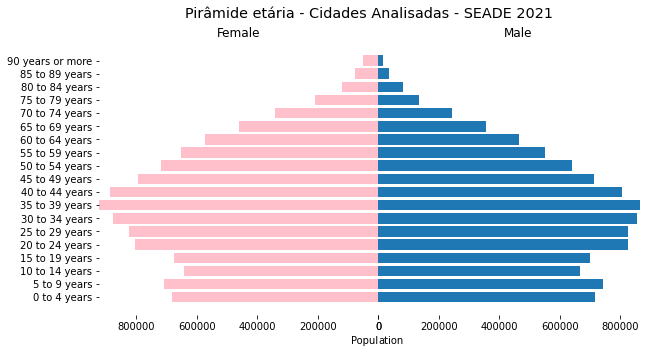

Fonte: https://populacao.seade.gov.br/


In [21]:
print("A pirâmide etária de 2021 possui algumas diferenças com relação a de 2010")
print("Esta apresenta uma base mais achatada e a moda deslocou-se para a faixa dos 35-39 anos, ou seja,")
print("As mesmas pessoas que compunham a moda a 10 anos atrás são os que compõem agora com esse dado estimado")
if english:
    pop = "Population"
else:
    pop = "População"
plot_piramide_etaria(piramide_,"Populacao",xlabel = pop,global_title = "Pirâmide etária - Cidades Analisadas - SEADE 2021")
plt.show()
print('Fonte: https://populacao.seade.gov.br/')

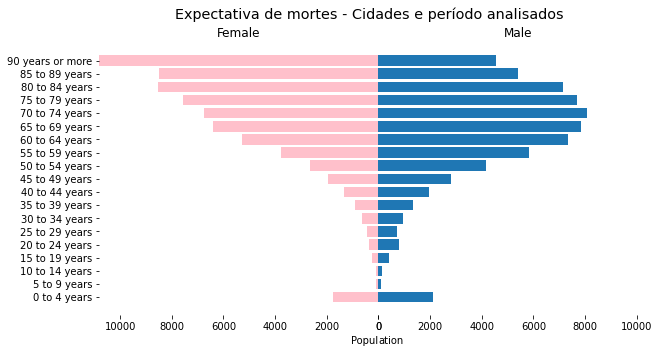

Fonte: https://sidra.ibge.gov.br/


In [22]:
# global_title = "Quantidade de Mortes - Cidades Analisadas - 2019"
global_title = "Expectativa de mortes - Cidades e período analisados"
plot_piramide_etaria(mortalidade_,"Populacao",xlabel = pop,
                     global_title = global_title)
plt.show()
print('Fonte: https://sidra.ibge.gov.br/')

Verificando a taxa de mortalidade com base nos dados da quantidade de óbitos pela população do SEADE de 2021

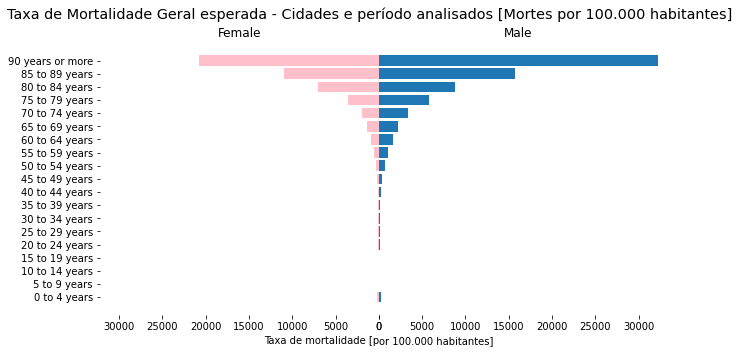

In [23]:
# global_title = "Taxa de Mortalidade Geral - Cidades Analisadas - 2019 [Mortes por 100.000 habitantes]"
global_title = "Taxa de Mortalidade Geral esperada - Cidades e período analisados [Mortes por 100.000 habitantes]"
plot_piramide_etaria(mortalidade_.merge(piramide_,
                                       on = ["Sexo","Idade"],
                                       how = 'left').assign(Taxa = lambda x: x["Populacao_x"]/x["Populacao_y"]*100000),
                     "Taxa",xlabel = "Taxa de mortalidade [por 100.000 habitantes]",
                     global_title = global_title)

Agora, um histograma, não havendo distinção entre gêneros

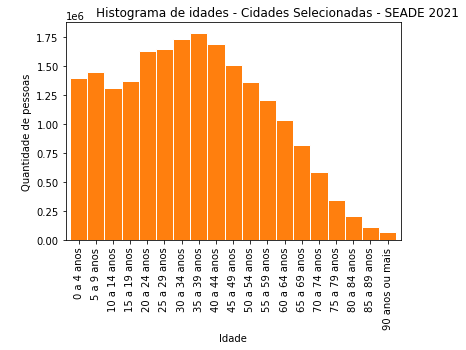

In [24]:
piramide_agrupada = piramide_.groupby("Idade").Populacao.sum().sort_index()
piramide_agrupada.plot(kind='bar',width = 1,color = "C1",edgecolor = "white")
plt.title("                       Histograma de idades - Cidades Selecionadas - SEADE 2021")
plt.ylabel("Quantidade de pessoas")
plt.show()

Vejamos os casos das pessoas que adoeceram, mas não vieram a falecer

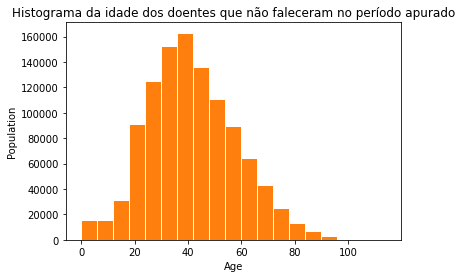

In [25]:
hist_individuos_contaminados(casos_sp_,"Histograma da idade dos doentes que não faleceram no período apurado",0)

Neste cenário, a curva tem uma cauda mais a direita, bem diferente das pessoas que vieram falecer. Ela tende a se assemelhar mais com a pirâmide etária do estado, mas ainda assim o pico ocorre com 40 anos, __talvez pela maior exposição ao risco__

E o caso de pessoas que ficaram doentes, independente do desfecho

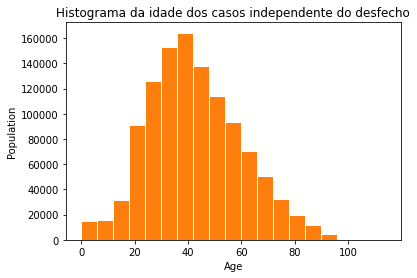

In [26]:
hist_individuos_contaminados(casos_sp_,"Histograma da idade dos casos independente do desfecho")

Como a taxa de óbito da COVID é relativamente pequena, praticamente os dados dos casos está relacionado aos doentes que não vieram a falecer

Vamos fazer a normalização dos dados de doentes e óbitos, com base na pirâmide etária das cidades selecionadas, ou seja, vamos calcular a __taxa de incidência da doença__ e a __taxa de mortalidade da doença__

In [27]:
def constroi_faixa_etaria_cut(x):
    if x.right == np.inf:
        return "%d anos ou mais"%(x.left+1)
    else:
        if x.left > 0:
            left = x.left + 1
        else:
            left = x.left
        right = x.right
        return "%d a %d anos"%(left,right)
        
    
def casos_piramide(df,b,fe,obito = None):
    return  df_explode_idade(df,obito).query("idade == idade") \
                             .assign(Faixa_etaria = lambda x: pd.cut(x["idade"],bins=b,include_lowest=True)) \
                             .assign(Faixa_etaria = lambda x: x["Faixa_etaria"] \
                                                                 .apply(lambda y: constroi_faixa_etaria_cut(y)) \
                                                                 .astype("str")) \
                            .assign(Idade = lambda x: pd.Categorical(x['Faixa_etaria'],
                                                                            ordered=True,
                                                                            categories = fe),
                                    Sexo = lambda x: x.sexo.str.replace("masculino","Homens") \
                                                           .str.replace("feminino","Mulheres")) \
                            .groupby(["Idade","Sexo"]).casos_sp.count().reset_index()


casos_sp_piramide_obito = casos_piramide(casos_sp_,bins,faixa_etaria,obito=1)

O gráfico abaixo evidencia que a taxa de mortalidade por COVID-19 entre as pessoas mais velhas é maior que 
para as pessoas mais jovens e seu crescimento se assemelha a uma curva exponencial. 
Contudo, uma distribuição similar é vista na taxa de mortalidade geral acima


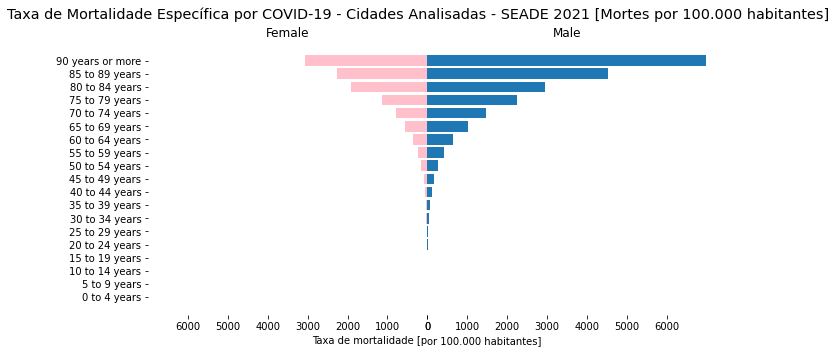

In [28]:
print("""O gráfico abaixo evidencia que a taxa de mortalidade por COVID-19 entre as pessoas mais velhas é maior que 
para as pessoas mais jovens e seu crescimento se assemelha a uma curva exponencial. 
Contudo, uma distribuição similar é vista na taxa de mortalidade geral acima""")
plot_piramide_etaria(casos_sp_piramide_obito.merge(piramide_,
                       how = 'left',
                       on=('Idade','Sexo')).assign(Percentual_casos = lambda x: 100000*x["casos_sp"]/x["Populacao"]),
                     "Percentual_casos",
                     xlabel="Taxa de mortalidade [por 100.000 habitantes]",
                     global_title = 'Taxa de Mortalidade Específica por COVID-19 - Cidades Analisadas - SEADE 2021 [Mortes por 100.000 habitantes]');

Vejamos a relação entre as taxas de mortalidade por COVID-19 e demais doenças, conforme apresentado acima

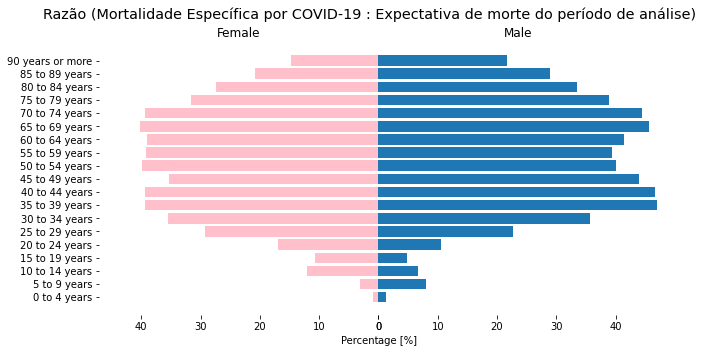

In [29]:
# global_title = "Razão (Mortalidade Específica por COVID-19 : Mortalidade Geral em 2019)"
if english:
    perc_label = "Percentage [%]"
else:
    perc_label = "Percentual [%]"
global_title = "Razão (Mortalidade Específica por COVID-19 : Expectativa de morte do período de análise)"
plot_piramide_etaria(mortalidade_.merge(piramide_,
                   on = ["Sexo","Idade"],
                   how = 'left').assign(Taxa = lambda x: x["Populacao_x"]/x["Populacao_y"]*100) \
            .merge(casos_sp_piramide_obito.merge(piramide_,
                       how = 'left',
                       on=('Idade','Sexo')).assign(Percentual_casos = lambda x: 100*x["casos_sp"]/x["Populacao"]),
                   on = ["Sexo","Idade"],
                   how = 'left').assign(razao = lambda x: 100*x["Percentual_casos"]/x["Taxa"]),
                    "razao",
                    xlabel = perc_label,
                    global_title=global_title)

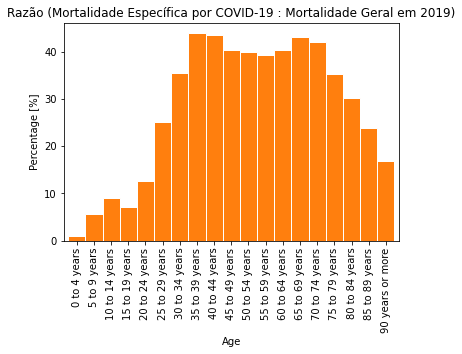

In [30]:
mortalidade_.merge(piramide_,
                   on = ["Sexo","Idade"],
                   how = 'left') \
            .merge(casos_sp_piramide_obito.merge(piramide_,
                       how = 'left',
                       on=('Idade','Sexo')),
                   on = ["Sexo","Idade"],
                   how = 'left').groupby("Idade").agg({"Populacao_x":sum,"casos_sp":sum})\
            .assign(razao = lambda x: 100*x["casos_sp"]/x["Populacao_x"])\
            .reset_index()\
            .assign(Age = lambda x: x["Idade"].str.replace(" a ", " to ")\
                                              .str.replace("anos","years")\
                                              .str.replace("ou mais","or more"))\
            .plot(kind="bar",x = "Age",y = "razao", width = 1,color = "C1",edgecolor = "white")

plt.gca().get_legend().remove()
plt.ylabel("Percentage [%]")
plt.title("Razão (Mortalidade Específica por COVID-19 : Mortalidade Geral em 2019)")
plt.show()

In [31]:
casos_sp_piramide_casos = casos_piramide(casos_sp_,bins,faixa_etaria)

O gráfico abaixo mostra que a incidência de casos é mais acentuada nos idosos com mais de 90 anos. Além disso,
as crianças são as que menos adoecem, relativamente.


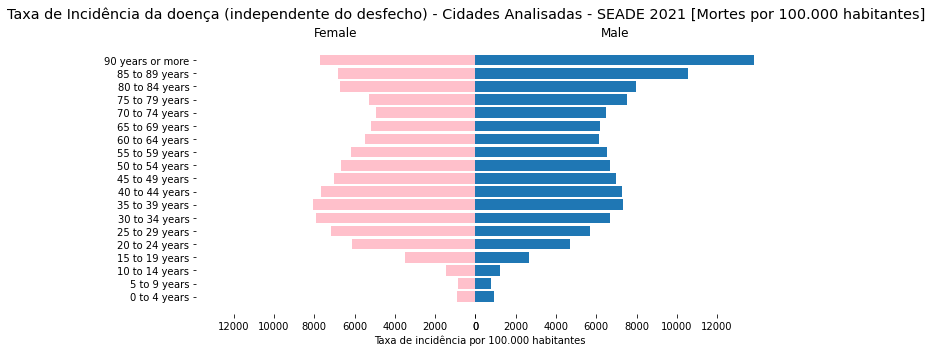

In [32]:
print("""O gráfico abaixo mostra que a incidência de casos é mais acentuada nos idosos com mais de 90 anos. Além disso,
as crianças são as que menos adoecem, relativamente.""")
plot_piramide_etaria(casos_sp_piramide_casos.merge(piramide_,
                       how = 'left',
                       on=('Idade','Sexo')).assign(Percentual_casos = lambda x: 100000*x["casos_sp"]/x["Populacao"]),
                     "Percentual_casos",
                    xlabel="Taxa de incidência por 100.000 habitantes",
                    global_title = "Taxa de Incidência da doença (independente do desfecho) - Cidades Analisadas - SEADE 2021 [Mortes por 100.000 habitantes]");

In [33]:
casos_sp_piramide_casos_sem_obito = casos_piramide(casos_sp_,bins,faixa_etaria,obito=0)

In [34]:
# print("""O gráfico abaixo mostra a incidência de casos é mais acentuada nos idosos com mais de 90 anos e 
# adultos entre 35 e 44 anos.""")
# plot_piramide_etaria(casos_sp_piramide_casos_sem_obito.merge(piramide_,
#                        how = 'left',
#                        on=('Idade','Sexo')).assign(Percentual_casos = lambda x: 100*x["casos_sp"]/x["Populacao"]),
#                      "Percentual_casos",
#                      xlabel="Percentual Normalizado",
#                      global_title = "Taxa de incidência da doença (sem óbito no desfecho) - Cidades Analisadas - seade 2021");

# Letalidade da doença

Vamos verificar a quantidade de pessoas que vieram a falecer no período, frente a quantidade de pessoas que vieram a morrer

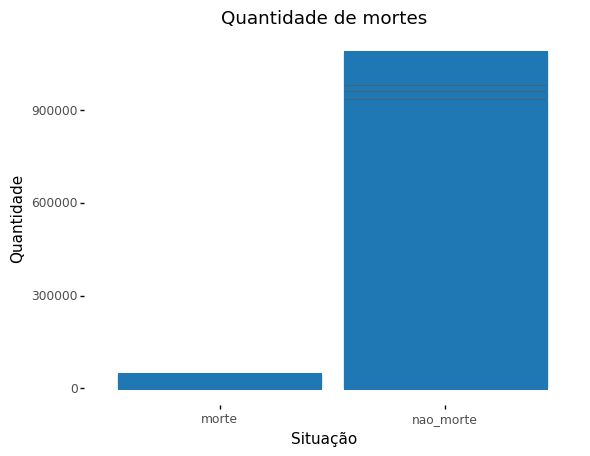

<ggplot: (-9223371859766828356)>

In [35]:
casos_sp_ = casos_sp_.assign(nao_morte = lambda x: x["obito_pre"].apply(lambda y: len(np.where(y == 0)[0])),
                             morte = lambda x: x["obito_pre"].apply(lambda y: len(np.where(y == 1)[0])))



def plot_volume_mortes_nao_mortes(df):
    return (
                gg.ggplot(
                            df.melt(id_vars = ["municipio_FIOCRUZ","data_FIOCRUZ"],value_vars = ['nao_morte','morte'],
                                                    var_name = 'situacao',value_name='quantidade')
                )
                +gg.geom_col(gg.aes(x="situacao",y = 'quantidade'),color="C0")
                +gg.theme(panel_background=gg.element_blank())
                +gg.ggtitle("Quantidade de mortes")
                +gg.xlab("Situação")
                +gg.ylab("Quantidade")
           )
    
plot_volume_mortes_nao_mortes(casos_sp_)

In [36]:
print("Vemos que a letalidade da COVID-19 para este período e cidades estudadas é de 4%")
def obitos_nao_obitos_contaminados(df):
    return df.melt(id_vars = ["municipio_FIOCRUZ","data_FIOCRUZ"],value_vars = ['nao_morte','morte'],
                                            var_name = 'situacao',value_name='quantidade') \
             .groupby("situacao").quantidade.sum().reset_index() \
             .assign(perc_quantidade = lambda x: 100*x["quantidade"]/x["quantidade"].sum())

obitos_nao_obitos_contaminados(casos_sp_)

Vemos que a letalidade da COVID-19 para este período e cidades estudadas é de 4%


,situacao,quantidade,perc_quantidade
0,morte,45467,4.010896
1,nao_morte,1088120,95.989104


# Casos por municipio

In [37]:
def volume_casos(df):
    return df.groupby("municipio_FIOCRUZ").casos_novos_sp.sum().sort_values(ascending=False)
    
volume_casos(casos_sp_)

municipio_FIOCRUZ
SAO PAULO                 693984.0
SAO BERNARDO DO CAMPO      56348.0
SANTO ANDRE                47852.0
GUARULHOS                  47819.0
OSASCO                     31149.0
CARAPICUIBA                23220.0
BARUERI                    21939.0
MOGI DAS CRUZES            21533.0
DIADEMA                    19377.0
MAUA                       19370.0
SUZANO                     15587.0
TABOAO DA SERRA            14399.0
SAO CAETANO DO SUL         14061.0
ITAQUAQUECETUBA            12006.0
SANTANA DE PARNAIBA        10102.0
COTIA                       9548.0
FRANCO DA ROCHA             8608.0
FRANCISCO MORATO            8211.0
ITAPEVI                     8123.0
EMBU DAS ARTES              7613.0
FERRAZ DE VASCONCELOS       7375.0
RIBEIRAO PIRES              6458.0
CAIEIRAS                    6125.0
ARUJA                       5720.0
ITAPECERICA DA SERRA        5672.0
POA                         5630.0
JANDIRA                     5060.0
MAIRIPORA                   5044.0
SA

Vamos verificar os casos percentuais, ou seja, a quantidade de casos pela população do municipio

Por conta da cidade de São Paulo ser um outlier no número de habitantes, precisamos fazer uma transformação para
que este problema não seja percebido


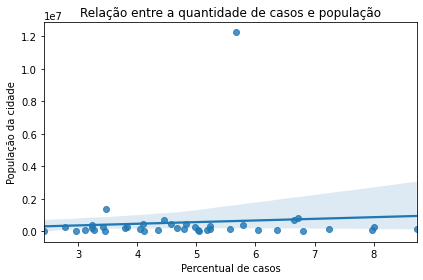

In [38]:
def regplot_perc_log(df,x,y):
    sns.regplot(
        data = df.groupby("municipio_FIOCRUZ").agg({'casos_novos_sp':sum,
                                                    'obitos_novos_sp':sum,
                                                    'populacaoTCU2019_FIOCRUZ':'mean'}) \
                 .assign(perc_casos = lambda x: 100*x["casos_novos_sp"]/x["populacaoTCU2019_FIOCRUZ"],
                         perc_obitos = lambda x: 100*x["obitos_novos_sp"]/x["populacaoTCU2019_FIOCRUZ"]).sort_values('perc_casos') \
                [[x,'populacaoTCU2019_FIOCRUZ']].assign(poplog = lambda x: np.log(x["populacaoTCU2019_FIOCRUZ"])),
        x = x,
        y = y
    )
    plt.title('Relação entre a quantidade de casos e população')
    plt.tight_layout()
    

print("""Por conta da cidade de São Paulo ser um outlier no número de habitantes, precisamos fazer uma transformação para
que este problema não seja percebido""")
regplot_perc_log(casos_sp_,'perc_casos','populacaoTCU2019_FIOCRUZ')
plt.xlabel("Percentual de casos")
plt.ylabel("População da cidade")
plt.show()


Uma hipótese inicial seria que, dado que as cidades são relativamente 'iguais', proporcionalmente, a quantidade de 
casos não teria uma tendência de crescimento (correlação = 0)


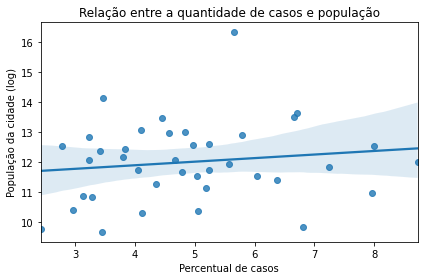

In [39]:
print("""Uma hipótese inicial seria que, dado que as cidades são relativamente 'iguais', proporcionalmente, a quantidade de 
casos não teria uma tendência de crescimento (correlação = 0)""")
regplot_perc_log(casos_sp_,'perc_casos','poplog')
plt.xlabel("Percentual de casos")
plt.ylabel("População da cidade (log)")
plt.show()    

Contudo, para a quantidade de mortes, temos uma leve correlação positiva relacionando a quantidade de pessoas na cidade
e a quantidade de pessoas que vem a falecer


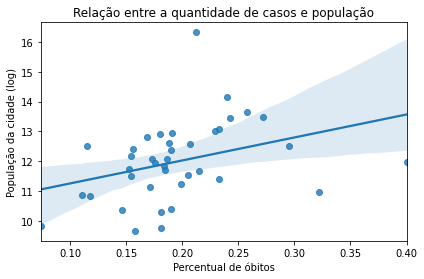

In [40]:
print("""Contudo, para a quantidade de mortes, temos uma leve correlação positiva relacionando a quantidade de pessoas na cidade
e a quantidade de pessoas que vem a falecer""")
regplot_perc_log(casos_sp_,'perc_obitos','poplog')

plt.xlabel("Percentual de óbitos")
plt.ylabel("População da cidade (log)")
plt.show()

# Avaliação das comorbidades

Fazendo uma comparação com https://www.ppggc.ufscar.br/pt-br/media/arquivo/produtos-tecnicos/guia-vigilancia-epidemiologica-ufscar.pdf, os seguintes fatores de risco apontados na base de dados não constam no arquivo:

* __Doença Hematológica__
* __Doença Neorológica__

In [41]:
comorbidades = ['asma_pre',
                 'cardiopatia_pre',
                 'diabetes_pre',
                 'doenca_hematologica_pre',
                 'doenca_hepatica_pre',
                 'doenca_neurologica_pre',
                 'doenca_renal_pre',
                 'imunodepressao_pre',
                 'obesidade_pre',
                 'outros_fatores_de_risco_pre',
                 'pneumopatia_pre',
                 'puerpera_pre',
                 'sindrome_de_down_pre']

In [42]:
 def explode_comorbidade_df(df):
    explode = df[["municipio_FIOCRUZ","nomeRegiaoSaude_FIOCRUZ","data_FIOCRUZ","obito_pre","cs_sexo_pre","idade_pre"] \
                +comorbidades] \
                             .explode(["idade_pre",'obito_pre','cs_sexo_pre']+comorbidades).reset_index(drop=True) \
                             .assign(alguma_comorbidade = lambda x: (x[comorbidades]=="sim") \
                                                                           .apply(lambda y: any(y),axis=1),
                                     totalmente_ignorado = lambda x: (x[comorbidades]=="ignorado") \
                                                                       .apply(lambda y: all(y),axis=1)) \
                             .assign(alguma_comorbidade = lambda x: np.where(x["alguma_comorbidade"] == True,"sim",
                                                                          np.where(x["totalmente_ignorado"] == True,
                                                                                    "ignorado",
                                                                                    "não")))
    return explode

casos_sp_explode = explode_comorbidade_df(casos_sp_)

In [43]:
casos_sp_explode

,municipio_FIOCRUZ,nomeRegiaoSaude_FIOCRUZ,data_FIOCRUZ,obito_pre,cs_sexo_pre,idade_pre,asma_pre,cardiopatia_pre,diabetes_pre,doenca_hematologica_pre,...,doenca_neurologica_pre,doenca_renal_pre,imunodepressao_pre,obesidade_pre,outros_fatores_de_risco_pre,pneumopatia_pre,puerpera_pre,sindrome_de_down_pre,alguma_comorbidade,totalmente_ignorado
0,ARUJA,ALTO DO TIETE,2020-04-10,0,masculino,35.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
1,ARUJA,ALTO DO TIETE,2020-04-10,0,feminino,26.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
2,ARUJA,ALTO DO TIETE,2020-04-10,0,masculino,46.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
3,ARUJA,ALTO DO TIETE,2020-04-10,0,masculino,74.0,ignorado,sim,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,sim,ignorado,ignorado,ignorado,sim,False
4,ARUJA,ALTO DO TIETE,2020-04-10,0,feminino,34.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1134249,VARGEM GRANDE PAULISTA,MANANCIAIS,2021-04-21,0,masculino,47.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
1134250,VARGEM GRANDE PAULISTA,MANANCIAIS,2021-04-22,0,feminino,49.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
1134251,VARGEM GRANDE PAULISTA,MANANCIAIS,2021-04-22,0,masculino,45.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True
1134252,VARGEM GRANDE PAULISTA,MANANCIAIS,2021-04-23,0,masculino,37.0,ignorado,ignorado,ignorado,ignorado,...,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,ignorado,True


In [45]:
describe(casos_sp_explode.query("idade_pre == idade_pre & cs_sexo_pre == cs_sexo_pre").assign(idade_pre = lambda x: x["idade_pre"].astype(float)))

Quantidade de linhas: 1130834


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,municipio_FIOCRUZ,object,0,0.0%,39,-,-,-,-,-,-,-,-,-,-
1,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,6,-,-,-,-,-,-,-,-,-,-
2,data_FIOCRUZ,datetime64[ns],0,0.0%,379,2020-04-10 00:00:00,2020-07-13 00:00:00,2020-11-19 00:00:00,2020-10-29 17:32:05.496403712,2021-02-15 00:00:00,2021-04-23 00:00:00,111 days 20:24:47.950872692,-,-,-
3,obito_pre,object,0,0.0%,2,-,-,-,-,-,-,-,-,-,-
4,cs_sexo_pre,object,0,0.0%,2,-,-,-,-,-,-,-,-,-,-
5,idade_pre,float64,0,0.0%,113,0.0,30.0,40.0,42.106616,54.0,114.0,17.48195,0.35,-0.08,2.41
6,asma_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
7,cardiopatia_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
8,diabetes_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
9,doenca_hematologica_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-


In [46]:
#Percentual de comorbidade na base de dados
casos_sp_explode.query("idade_pre == idade_pre & cs_sexo_pre == cs_sexo_pre").melt(id_vars = ["obito_pre",
                                                                                              "cs_sexo_pre","idade_pre"],
                      value_vars = ['asma_pre', 'cardiopatia_pre',
                                   'diabetes_pre', 'doenca_hematologica_pre', 'doenca_hepatica_pre',
                                   'doenca_neurologica_pre', 'doenca_renal_pre', 'imunodepressao_pre',
                                   'obesidade_pre', 'outros_fatores_de_risco_pre', 'pneumopatia_pre',
                                   'puerpera_pre', 'sindrome_de_down_pre'],
                      var_name = "comorbidade",
                      value_name = "existencia_comorbidade").groupby(["comorbidade","existencia_comorbidade"]).obito_pre\
                    .count().reset_index()\
    .assign(obito_pre = lambda x: x.groupby(["comorbidade"]).obito_pre.\
                                                transform(lambda y: 100*y/y.sum()))

,comorbidade,existencia_comorbidade,obito_pre
0,asma_pre,ignorado,95.375095
1,asma_pre,não,4.219717
2,asma_pre,sim,0.405188
3,cardiopatia_pre,ignorado,88.597000
4,cardiopatia_pre,não,1.902578
5,cardiopatia_pre,sim,9.500422
6,diabetes_pre,ignorado,90.915024
7,diabetes_pre,não,2.709593
8,diabetes_pre,sim,6.375383
9,doenca_hematologica_pre,ignorado,95.503053


In [47]:
casos_sp_explode.query("idade_pre == idade_pre & cs_sexo_pre == cs_sexo_pre").cs_sexo_pre.value_counts()*100/casos_sp_explode.query("idade_pre == idade_pre & cs_sexo_pre == cs_sexo_pre").cs_sexo_pre.value_counts().sum()

feminino     53.938509
masculino    46.061491
Name: cs_sexo_pre, dtype: float64

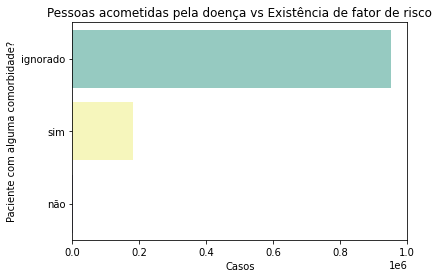

In [44]:
def plot_volume_comorbidades(df):
    sns.countplot(data = df.assign(alguma_comorbidade = lambda x: pd.Categorical(x["alguma_comorbidade"],
                                                                                 categories=["ignorado",
                                                                                             "sim","não"])),
                  y = "alguma_comorbidade",orient="h",palette="Set3")
    plt.title("Pessoas acometidas pela doença vs Existência de fator de risco")
    plt.ylabel("Paciente com alguma comorbidade?")
    plt.xlabel("Casos")
    plt.show()

plot_volume_comorbidades(casos_sp_explode)

Vamos verificar o mesmo gráfico, mas agora apenas para os óbitos, pois a quantidade de não óbitos é bem superior

Nota-se que há uma diferença entre ter alguma comorbidade e os casos com óbito: existe uma relação entre eles


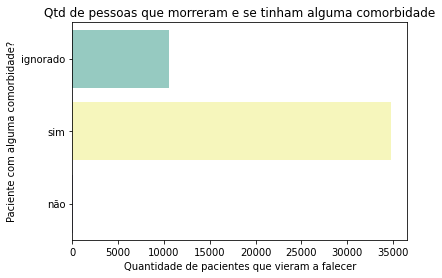

In [45]:
def plot_volume_comorbidades_obito(df):
    sns.countplot(data = df.assign(alguma_comorbidade = lambda x: pd.Categorical(x["alguma_comorbidade"],
                                                                                 categories=["ignorado",
                                                                                             "sim","não"]))\
                                   .query("obito_pre == 1"),
                                   y = "alguma_comorbidade",
                                   palette="Set3")
    plt.title("Qtd de pessoas que morreram e se tinham alguma comorbidade")
    plt.ylabel("Paciente com alguma comorbidade?")
    plt.xlabel("Quantidade de pacientes que vieram a falecer")
    plt.show()

print("Nota-se que há uma diferença entre ter alguma comorbidade e os casos com óbito: existe uma relação entre eles")
plot_volume_comorbidades_obito(casos_sp_explode)

Vamos ver se uma comorbidade sobresai

In [46]:
if (english == False):
    risk_factor_translation = {"asma":"asma",
                               "cardiopatia": "cardiopatia",
                               "doenca_hematologica": "doença hematológica",
                               "doenca_hepatica": "doença hepática",
                               "doenca_neurologica": "doença neurológica",
                               "doenca_renal": "doença renal",
                               "imunodepressao": "imunodepressão",
                               "obesidade": "obseidade",
                               "pneumopatia": "penumopatia",
                               "puerpera": " puérpera",
                               "outros_fatores_de_risco": "outros fatores de risco",
                               "sindrome_de_down": "sindrome de Down",
                               "diabetes": "diabetes"}
else:
    risk_factor_translation = {"asma":"asthma",
                               "cardiopatia": "heart  disease",
                               "doenca_hematologica": "blood disease",
                               "doenca_hepatica": "liver disease",
                               "doenca_neurologica": "neurological disease",
                               "doenca_renal": "kidney disease",
                               "imunodepressao": "immunosuppression",
                               "obesidade": "obesity",
                               "pneumopatia": "lung disease",
                               "puerpera": " postpartum women",
                               "outros_fatores_de_risco": "other risk factors",
                               "sindrome_de_down": "Dow's syndrome",
                               "diabetes": "diabetes"}

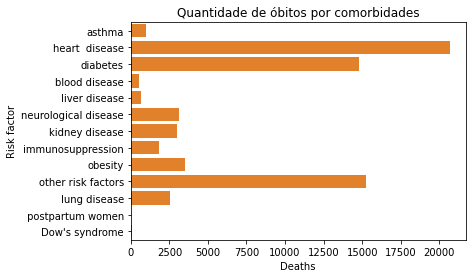

In [47]:
def comorbidades_obitos(df):
    sns.countplot(data = 
                        df.query("obito_pre == 1 & alguma_comorbidade == 'sim'") \
                                        .melt(id_vars=['municipio_FIOCRUZ','data_FIOCRUZ','obito_pre','idade_pre'],
                                               value_vars=comorbidades,
                                               value_name="existencia_comorbidade",
                                               var_name= "comorbidade") \
                                        .assign(comorbidade = lambda x: x["comorbidade"].str.replace("_pre",""))\
                                        .assign(comorbidade = lambda x: x["comorbidade"].replace(risk_factor_translation))\
                                        .query("existencia_comorbidade == 'sim'"),
                 y='comorbidade',
                 color = 'C1')
    if english:
        xlabel = "Deaths"
        ylabel = "Risk factor"
    else:
        xlabel = "Mortes"
        ylabel = "Fator de risco"
        
    plt.title("Quantidade de óbitos por comorbidades")
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()


comorbidades_obitos(casos_sp_explode)

Vamos apenas verificar, nos casos totais, a quantidade de pessoas com essas comorbidades

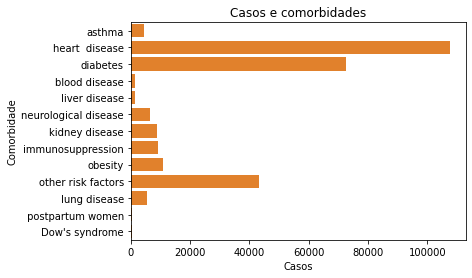

In [48]:
def comorbidades_totais(df):
    sns.countplot(data = 
                        df.query("alguma_comorbidade == 'sim'") \
                                        .melt(id_vars=['municipio_FIOCRUZ','data_FIOCRUZ','obito_pre','idade_pre'],
                                               value_vars=comorbidades,
                                               value_name="existencia_comorbidade",
                                               var_name= "comorbidade") \
                                        .assign(comorbidade = lambda x: x["comorbidade"].str.replace("_pre",""))\
                                        .assign(comorbidade = lambda x: x["comorbidade"].replace(risk_factor_translation))\
                                        .query("existencia_comorbidade == 'sim'"),
                 y='comorbidade',
                 color = 'C1')
    plt.title("Casos e comorbidades")
    plt.xlabel("Casos")
    plt.ylabel("Comorbidade")
    plt.show()

comorbidades_totais(casos_sp_explode)

Nota-se, a principio, que não necessariamente as cardiopatias estão mais associadas aos óbitos, mas sim que existem mais pessoas cardiopatas. Vamos verificar a relação percentual de cada caso para termos uma noção melhor

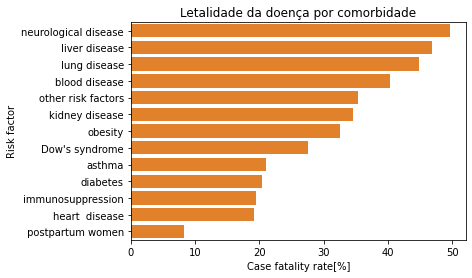

Nota-se, portanto, que doenças neurológicas, hepáticas e pneumáticas ter um percentual maior de óbito como desfecho do 
paciente. 
Por exemplo, percebe-se que, das pessoas diagnosticadas com alguma doença neurológica, 50% vem a óbito.
Contudo, é necessária uma análise multivariada para podermos ter alguma evidência que as comorbidades possuem 
alguma relação com o agravamento da doença.


In [49]:
def perc_mortes_comorbidades(df):
    sns.barplot(data = 
    df.query("alguma_comorbidade == 'sim'") \
                                        .melt(id_vars=['municipio_FIOCRUZ','data_FIOCRUZ','obito_pre','idade_pre'],
                                               value_vars=comorbidades,
                                               value_name="existencia_comorbidade",
                                               var_name= "comorbidade") \
                                        .assign(comorbidade = lambda x: x["comorbidade"].str.replace("_pre",""))\
                                        .assign(comorbidade = lambda x: x["comorbidade"].replace(risk_factor_translation))\
                                        .query("existencia_comorbidade == 'sim'") \
                    .pivot_table(index='comorbidade',columns="obito_pre",values="existencia_comorbidade",aggfunc="count") \
                    .rename(columns = {0:"nao_obito",1:"obito"}).assign(perc = lambda x: 100*x["obito"]/(x["obito"]+x["nao_obito"])) \
                    .reset_index().sort_values("perc",ascending=False),
               x = "perc",y = 'comorbidade',color = 'C1')
    plt.title("Letalidade da doença por comorbidade")
    if english:
        xlabel = "Case fatality rate[%]"
        ylabel = "Risk factor"
    else:
        xlabel = "Letalidade [%]"
        ylabel = "Comorbidade"
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()
perc_mortes_comorbidades(casos_sp_explode)
print("""Nota-se, portanto, que doenças neurológicas, hepáticas e pneumáticas ter um percentual maior de óbito como desfecho do 
paciente. \nPor exemplo, percebe-se que, das pessoas diagnosticadas com alguma doença neurológica, 50% vem a óbito.
Contudo, é necessária uma análise multivariada para podermos ter alguma evidência que as comorbidades possuem 
alguma relação com o agravamento da doença.""")

__No caso acima, se uma pessoa possui doença neurológica e outra comorbidade, este indivíduo contabiliza no gráfico 2 vezes (tanto para a doença neurológica, quanto para a outra comorbidade)__<br>
Vamos, dessa forma, fazer as análises separadas para cada comorbidade e depois algumas combinações

In [50]:
def perc_mortes_comorbidades_avancada(df,colunas,comorbidade_extra = None,return_df = False,retornar_por_idade = False):
    df_qtd = df.assign(qtd_comorbidade = lambda x: (x[[c for c in x.columns if ("_pre" in c) & 
                                                                                 (c != "idade_pre") & 
                                                                                 (c != "cs_sexo_pre") & 
                                                                                 (c!="obito_pre")]] == "sim").sum(axis=1))
    flag = False
    if(type(colunas[0]) is str):
        if(all(["_pre" in c for c in colunas])):
            #Filtrando somente os casos com "colunas" quantidade de comorbidades e que se sejam essas "comorbidades"
            df_filtro = df_qtd.query("qtd_comorbidade == %d" % len(colunas))\
                              .query(reduce(lambda x,y: x + " & " + y,[c + "== 'sim'" for c in colunas]))
    
    elif(int is type(colunas[0])):
        df_filtro = df_qtd.query("qtd_comorbidade == %d" % colunas[0])
        if(comorbidade_extra!=None):
            flag = True
            if(df_filtro.shape[0] == 0):
                resultado_percentual_comorbidade_extra = 0
            else:
                string_filtro = reduce(lambda x,y: "".join((x,y)), [" & %s == 'sim'" % c for c in comorbidade_extra])
                string_filtro = "obito_pre == 1" + string_filtro
                resultado_percentual_comorbidade_extra = df_filtro.query(string_filtro)\
                                                                  .shape[0]/df_filtro.shape[0]
        
    if(df_filtro.shape[0] == 0):
        resultado_percentual = 0
    else:
        resultado_percentual = df_filtro.query("obito_pre == 1").shape[0]/df_filtro.shape[0]


    if(flag == False):
        if(retornar_por_idade == False):
            if(return_df == False):
                return(resultado_percentual,df_filtro.shape[0])
            else:
                return[(resultado_percentual,df_filtro.shape[0]),df_filtro]
        else:
            df_filtro.Idade = pd.Categorical(df_filtro.Idade,categories=faixa_etaria)
            resultado_percentual = df_filtro.query("obito_pre == 1").groupby("Idade")[colunas[0]].count()/df_filtro.shape[0]
            if(return_df == False):
                return(resultado_percentual,df_filtro.shape[0])
            else:
                return[(resultado_percentual,df_filtro.shape[0]),df_filtro]
    else:
        if(return_df == False):
            return(resultado_percentual,df_filtro.shape[0],resultado_percentual_comorbidade_extra)
        else:
            return[(resultado_percentual,df_filtro.shape[0],resultado_percentual_comorbidade_extra),df_filtro]


Primeiramente, analisando as comorbidades isoladamente, ou seja, aquelas que somente possuem uma única comorbidade<br>

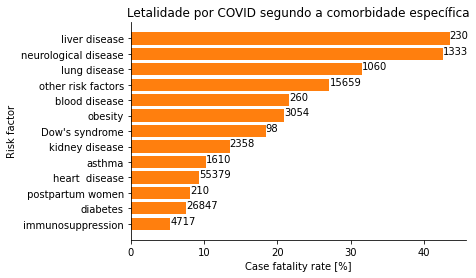

Ou seja, uma pessoa que manifestou a doença hepática tem, aproximadamente, 40% de probabilidade de morrer 
depois que adoeceu de COVID, enquanto que, uma pessoa com alguma cardiopatia, tem 10% de probabilidade. É o risco
de morte dado que o doente possua aquela única comorbidade.


In [51]:
loop_for = comorbidades
perc_qtd = np.array([perc_mortes_comorbidades_avancada(casos_sp_explode,[c]) for c in loop_for])
perc_df = pd.DataFrame({"perc":100*perc_qtd[:,0],"qtd":perc_qtd[:,1]},index = loop_for).sort_values("perc") \
            .rename({chave + "_pre":valor for chave,valor in risk_factor_translation.items()})
_,ax = plt.subplots()
ax.barh(width=perc_df.perc,y = perc_df.index,color="C1")
for i,r in perc_df.iterrows():
    ax.text(s = str(int(r.qtd)),x=r.perc,y = str(i),ha = "left")
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.set_title("Letalidade por COVID segundo a comorbidade específica")
if english:
    xlabel = "Case fatality rate [%]"
    ylabel = "Risk factor"
else:
    xlabel = "Letalidade [%]"
    ylabel = "Fator de risco"
ax.set_xlabel(xlabel)
ax.set_ylabel(ylabel)
plt.show()
print("""Ou seja, uma pessoa que manifestou a doença hepática tem, aproximadamente, 40% de probabilidade de morrer 
depois que adoeceu de COVID, enquanto que, uma pessoa com alguma cardiopatia, tem 10% de probabilidade. É o risco
de morte dado que o doente possua aquela única comorbidade.""")

In [52]:
def plot_case_fatality_specific(df):
            
           
    loop_for = comorbidades
    perc_qtd = [perc_mortes_comorbidades_avancada(df,[c],retornar_por_idade=True) for c in loop_for]
    
    _,ax = plt.subplots(figsize = (15,25),ncols = 3, nrows = int(np.ceil(len(loop_for)/3)))
    ax = ax.flatten()
    
    for i,c in enumerate(loop_for):
        s = 100*perc_qtd[i][0]
        if english:
            s.index = s.index.str.replace(" a ", " to ").str.replace("anos","years").str.replace("ou mais","or more")
        ax[i].barh(width=s,
                   y = s.index,
                   color="C1")
        
        y0 = s.index[0]
        #ax[i].text(s = str(int(perc_qtd[i][1])),x=s.max(),y = y0,ha = "left")
        ax[i].spines["right"].set_visible(False)
        ax[i].spines["top"].set_visible(False)

        ax[i].set_title("Letalidade por COVID segundo a comorbidade específica")
        if english:
            xlabel = "Case fatality rate [%]"
            ylabel = "Age"
        else:
            xlabel = "Letalidade [%]"
            ylabel = "Idade"
        ax[i].set_xlabel(xlabel)
        ax[i].set_ylabel(ylabel)

        ax[i].set_title(risk_factor_translation[c.replace("_pre","")].upper())

In [53]:
casos_explode_faixa_etaria = casos_sp_explode.query("idade_pre == idade_pre") \
     .assign(Faixa_etaria = lambda x: pd.cut(x["idade_pre"],bins=bins,include_lowest=True)) \
                                 .assign(Faixa_etaria = lambda x: x["Faixa_etaria"] \
                                                                     .apply(lambda y: constroi_faixa_etaria_cut(y)) \
                                                                     .astype("str").str \
                                                                                 .replace("nan","%s anos ou mais"%bins[-1])) \
                                .assign(Idade = lambda x: pd.Categorical(x['Faixa_etaria'],
                                                                                ordered=True,
                                                                                categories = faixa_etaria),
                                        Sexo = lambda x: x.cs_sexo_pre.str.replace("masculino","Homens") \
                                                               .str.replace("feminino","Mulheres"))

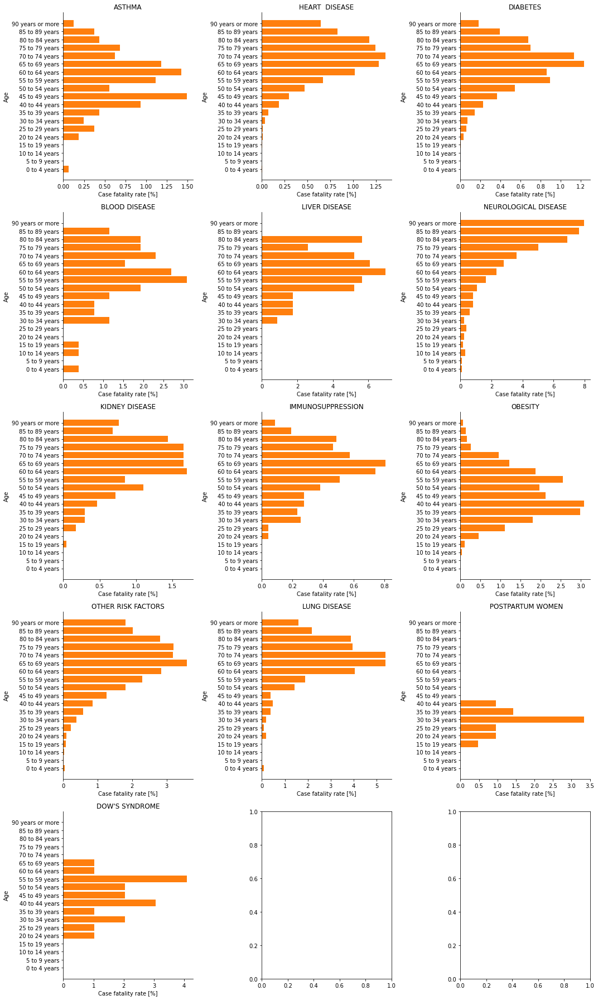

In [54]:
plot_case_fatality_specific(casos_explode_faixa_etaria)
plt.tight_layout()

Agora, vamos ver o resultado para uma quantidade $n$ de combinações de comorbidades juntas 

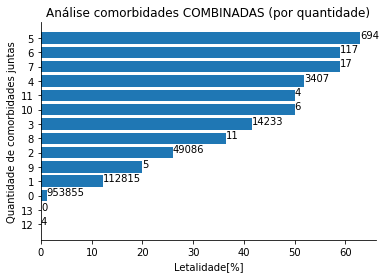

In [56]:
loop_for = range(len(comorbidades)+1)

perc_qtd = np.array([perc_mortes_comorbidades_avancada(casos_sp_explode,[c]) for c in loop_for])
perc_df = pd.DataFrame({"perc":100*perc_qtd[:,0],"qtd":perc_qtd[:,1]},index = [str(i) for i in loop_for]).sort_values("perc")
_,ax = plt.subplots()
ax.barh(width=perc_df.perc,y = perc_df.index)
for i,r in perc_df.iterrows():
    ax.text(s = str(int(r.qtd)),x=r.perc,y = i,ha = "left")
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

ax.set_title("Análise comorbidades COMBINADAS (por quantidade)")
ax.set_xlabel("Letalidade[%]")
ax.set_ylabel("Quantidade de comorbidades juntas")
plt.show()

Interessante notar que 5 comorbidades ainda pode ser considerado algo como "mais possível" do que mais que isso, dada a quantidade de registros com mais de 6 comorbidades. Vamos verificar

Agora, para os casos combinados, vamos ver a constribuição de cada uma das comorbidades dentro de cada grupo

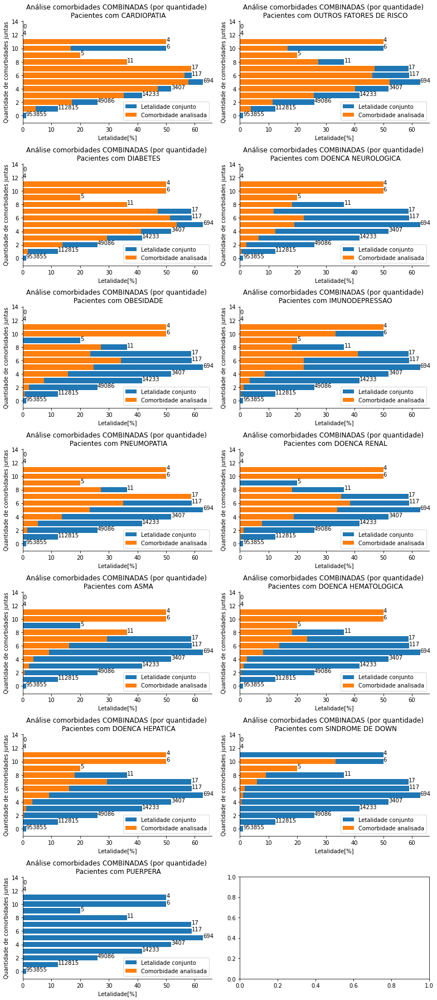

In [64]:
loop_for = range(len(comorbidades)+1)

_,ax = plt.subplots(ncols = 2,nrows = int(np.ceil(len(comorbidades)/2)),figsize = (11,25))
ax = ax.flatten()
for j,comor in enumerate(["cardiopatia_pre","outros_fatores_de_risco_pre","diabetes_pre","doenca_neurologica_pre",
                          "obesidade_pre","imunodepressao_pre","pneumopatia_pre","doenca_renal_pre","asma_pre",
                          "doenca_hematologica_pre","doenca_hepatica_pre","sindrome_de_down_pre","puerpera_pre"]):
    perc_qtd = np.array([perc_mortes_comorbidades_avancada(casos_sp_explode,[c],[comor]) for c in loop_for])
    perc_df = pd.DataFrame({"perc":100*perc_qtd[:,0],"qtd":perc_qtd[:,1],
                            "perc_comorbidade_analisada": 100*perc_qtd[:,2]},
                           index = loop_for)
    ax[j].barh(width=perc_df.perc,y = perc_df.index)
    ax[j].barh(width=perc_df.perc_comorbidade_analisada,y = perc_df.index,color="C1")
    for i,r in perc_df.iterrows():
        ax[j].text(s = str(int(r.qtd)),x=r.perc,y = i,ha = "left")
    ax[j].spines["right"].set_visible(False)
    ax[j].spines["top"].set_visible(False)

    ax[j].set_title("Análise comorbidades COMBINADAS (por quantidade) \n Pacientes com %s"%comor\
                                                                                            .replace("_pre","")\
                                                                                            .replace("_"," ").upper())
    ax[j].set_xlabel("Letalidade[%]")
    ax[j].set_ylabel("Quantidade de comorbidades juntas")
    ax[j].legend(["Letalidade conjunto","Comorbidade analisada"])
plt.tight_layout()
plt.show()

Para as "top 3" comorbidades mais específicas (cardiopatia, diabetes e doença neurológica), vamos ver a contribuição de cada uma delas para os casos conjuntos

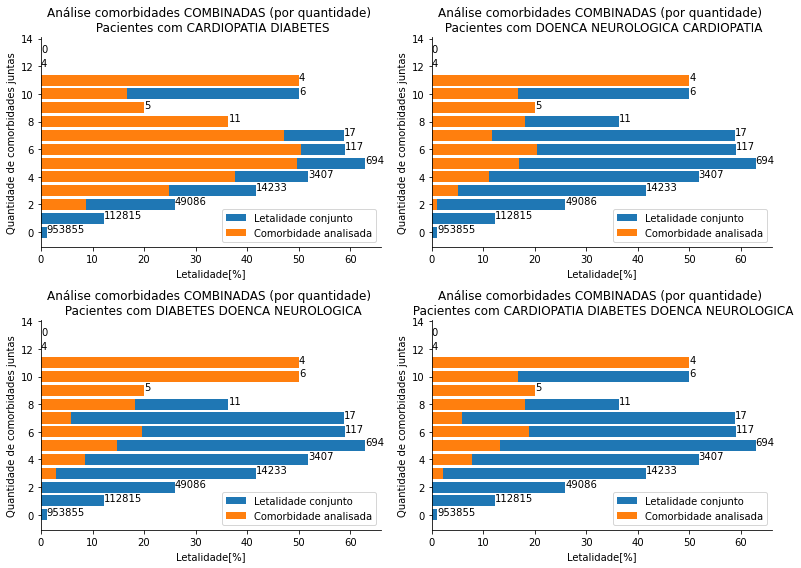

In [57]:
loop_for = range(len(comorbidades)+1)
top_comorbidades_conjutas = [["cardiopatia_pre","diabetes_pre"],["doenca_neurologica_pre","cardiopatia_pre"],
                             ["diabetes_pre","doenca_neurologica_pre"],["cardiopatia_pre","diabetes_pre",
                                                                        "doenca_neurologica_pre"]]
_,ax = plt.subplots(ncols = 2,nrows = int(np.ceil(len(top_comorbidades_conjutas)/2)),figsize = (11,8))
ax = ax.flatten()
for j,comor in enumerate(top_comorbidades_conjutas):
    perc_qtd = np.array([perc_mortes_comorbidades_avancada(casos_sp_explode,[c],comor) for c in loop_for])
    perc_df = pd.DataFrame({"perc":100*perc_qtd[:,0],"qtd":perc_qtd[:,1],
                            "perc_comorbidade_analisada": 100*perc_qtd[:,2]},
                           index = loop_for)
    ax[j].barh(width=perc_df.perc,y = perc_df.index)
    ax[j].barh(width=perc_df.perc_comorbidade_analisada,y = perc_df.index,color="C1")
    for i,r in perc_df.iterrows():
        ax[j].text(s = str(int(r.qtd)),x=r.perc,y = i,ha = "left")
    ax[j].spines["right"].set_visible(False)
    ax[j].spines["top"].set_visible(False)
    
    titulo_comorbidades = reduce(lambda x,y: " ".join((x,y)),comor).replace("_pre","").replace("_"," ").upper()
    ax[j].set_title("Análise comorbidades COMBINADAS (por quantidade) \n Pacientes com %s"%titulo_comorbidades)
    ax[j].set_xlabel("Letalidade[%]")
    ax[j].set_ylabel("Quantidade de comorbidades juntas")
    ax[j].legend(["Letalidade conjunto","Comorbidade analisada"])
plt.tight_layout()
plt.show()

As faixas em azul dos gráficos acima não estão totalmente explicadas. Vamos verificar quais são as comorbidades e quantas vezes elas se repetem

In [58]:
comor_lista_filtro = ["cardiopatia_pre","diabetes_pre"]
resul_list = [perc_mortes_comorbidades_avancada(casos_sp_explode,
                                                              [c],
                                                              comor_lista_filtro,
                                                              return_df=True) for c in loop_for]



list_df = [[df_filtro_comor.melt(value_vars = comorbidades,value_name=  "possui",var_name = str(i))\
                       .pipe(lambda x: x[~x[str(i)].isin(comor_lista_filtro)].query("possui == 'sim'")\
                                        [str(i)].value_counts()).to_frame().T,
           df_filtro_comor.shape[0]] for (res_comor,df_filtro_comor),i in zip(resul_list,loop_for)
          if res_comor[0] != res_comor[2]]

df_valores_absolutos = reduce(lambda x,y: pd.concat((x,y)), [l[0] for l in list_df if l[0].shape[1] > 0])

#valores dos indices em formato numerico
df_valores_absolutos.index = pd.Index([int(i) for i in df_valores_absolutos.index])


#     _,ax = plt.subplots(figsize = (10,10))
#     (df_representatividade/df_filtro_comor.shape[0]).to_frame().T.plot(kind = 'barh',stacked = True,ax=ax)
#     ax.legend(ncol=2)
#     p_acc=[0]
#     for v,p in zip(df_representatividade,df_representatividade/df_filtro_comor.shape[0]):
#         ax.text(x = v/2+np.sum(p_acc),s = v)

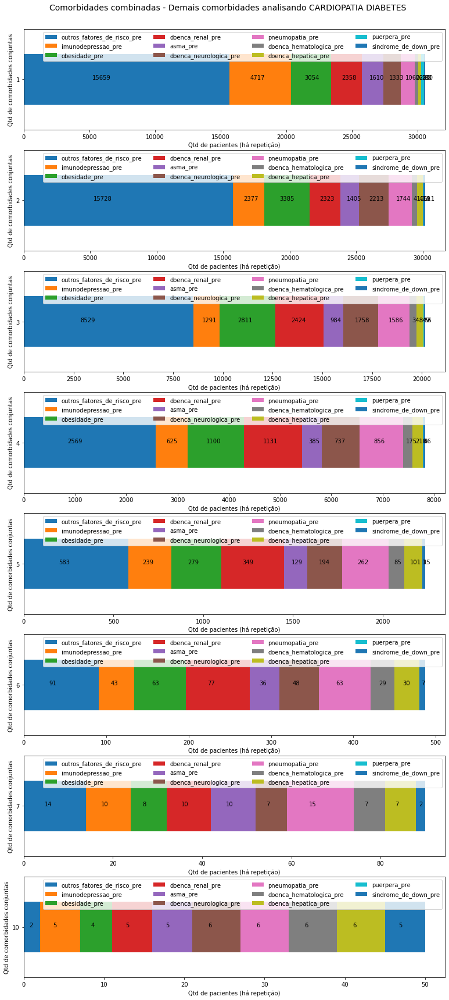

In [59]:
fig,ax = plt.subplots(figsize = (13,30),nrows = df_valores_absolutos.shape[0])
ax = ax.flatten()
for i,(_,df_i) in enumerate(df_valores_absolutos.iterrows()):
    df_i.to_frame().T.plot(kind = 'barh',stacked = True,ax=ax[i])
    ax[i].legend(ncol=4)
    v_acc = [0]
    for v in df_i:
        if v == v:
            ax[i].text(x = v/3 + np.sum(v_acc),y = 0,s = int(v))
            v_acc.append(v)
    ax[i].set_xlabel("Qtd de pacientes (há repetição)")
    ax[i].set_ylabel("Qtd de comorbidades conjuntas")
            
fig.suptitle("Comorbidades combinadas - Demais comorbidades analisando %s" % reduce(lambda x,y: " ".join((x,y)),
                                                                                    comor_lista_filtro).replace("_pre","")\
                                                                                         .replace("_"," ").upper(),
            fontsize = 14,y=0.9)


plt.show()

In [60]:
casos_sp_explode.reset_index()\
                .assign(qtd_comorbidade = lambda x: (x[[c for c in x.columns if ("_pre" in c) & 
                                                                                 (c != "idade_pre") & 
                                                                                 (c != "cs_sexo_pre") & 
                                                                                 (c!="obito_pre")]] == "sim").sum(axis=1))\
                .query("qtd_comorbidade == 5").melt(id_vars=["index","obito_pre"],value_name="status",
                                                    value_vars=comorbidades,var_name="comorbidade")\
                .query("status == 'sim'").groupby(["index","obito_pre"]).comorbidade.apply(lambda x: x.tolist()).reset_index()\
                .assign(comorbidade = lambda x: x["comorbidade"]\
                                                        .apply(lambda y: reduce(lambda x,y: x+ " " +y,np.sort(y))\
                                                                                   .replace("_pre","")))\
                .groupby(["comorbidade","obito_pre"])["index"].count().reset_index().rename(columns = {"index":"casos"})\
                .assign(Total = lambda x: x.groupby("comorbidade").casos.transform(lambda y: sum(y)),
                        perc = lambda x: 100*x["casos"]/x["Total"]).sort_values(["Total","perc"],ascending = [False,False])\
                .set_index("comorbidade")#.style.set_properties(subset=['comorbidade'], **{'width': '300px'})

,obito_pre,casos,Total,perc
comorbidade,,,,
cardiopatia diabetes doenca_renal imunodepressao outros_fatores_de_risco,1,42,68,61.764706
cardiopatia diabetes doenca_renal imunodepressao outros_fatores_de_risco,0,26,68,38.235294
cardiopatia diabetes doenca_renal obesidade outros_fatores_de_risco,1,40,54,74.074074
cardiopatia diabetes doenca_renal obesidade outros_fatores_de_risco,0,14,54,25.925926
cardiopatia diabetes obesidade outros_fatores_de_risco pneumopatia,1,26,46,56.521739
...,...,...,...,...
doenca_hepatica doenca_renal imunodepressao obesidade outros_fatores_de_risco,1,1,1,100.000000
doenca_neurologica doenca_renal imunodepressao obesidade pneumopatia,0,1,1,100.000000
doenca_neurologica doenca_renal outros_fatores_de_risco pneumopatia sindrome_de_down,0,1,1,100.000000


## Taxa por cormobidade

Relação de comorbidades associadas aos óbitos pela Relação de comorbidades associadas à população doente

In [55]:
casos_sp_explode.groupby(["asma_pre","obito_pre"]).cs_sexo_pre.count().reset_index()

,asma_pre,obito_pre,cs_sexo_pre
0,ignorado,0,1051904
1,ignorado,1,27774
2,não,0,30992
3,não,1,16726
4,sim,0,3616
5,sim,1,966


In [55]:
def relacao_comorbidade(df,coluna,aggfunc,coluna_comorbidade,especifica=False):
    relacao_total = df.groupby(["obito_pre",coluna_comorbidade]).agg({coluna:aggfunc}).reset_index()
    
    if especifica:
        q = reduce(lambda x,y: " & ".join((x,y)),["%s == 'sim'"%c 
                                                  if c == coluna_comorbidade 
                                                  else "%s != 'sim'"%c 
                                                  for c in comorbidades])
        
        relacao_com_comorbidade = df.query(q).groupby(["obito_pre",coluna_comorbidade]).agg({coluna:aggfunc}).reset_index()
    else:
        relacao_com_comorbidade = relacao_total.copy()
        
    #RCO = Relação de comorbidades associadas aos óbitos (qtd pessoas com comorbidade que morreram/ qtd de mortes)
    relacao_comorbidade_obito = relacao_com_comorbidade.query("%s == 'sim' & obito_pre == 1"%coluna_comorbidade) \
                                       [coluna].sum() / relacao_total.query("obito_pre == 1")[coluna].sum()
    
    #RC = Relação de comorbidades associadas aos casos (qtd comorbidade/qtd casos)
    relacao_comorbidade_ = relacao_com_comorbidade.query("%s == 'sim'"%coluna_comorbidade)[coluna]\
                                                  .sum()/relacao_total[coluna].sum()
    
    #Probabilidade Condicional de Morte, dado que a pessoa tinha Comorbidade
    prob_cond_Morreu_Comor = relacao_com_comorbidade.query("%s == 'sim' & obito_pre == 1"%coluna_comorbidade)[coluna] \
                                    .sum()/ relacao_com_comorbidade.query("%s == 'sim'"%coluna_comorbidade)[coluna].sum()
    
    return (relacao_total,
            relacao_comorbidade_obito,
            relacao_comorbidade_,
            prob_cond_Morreu_Comor)



In [56]:
_,rco,rc,pM_C = relacao_comorbidade(casos_sp_explode,"idade_pre","count","alguma_comorbidade")

In [57]:
print("RCO = Relação de comorbidades associadas aos óbitos (qtd pessoas com comorbidade que morreram/ qtd de mortes)",
      round(rco*100,1))
print("RC = Relação de comorbidades associadas aos casos (qtd comorbidade/qtd casos)",round(rc*100,1))
print("Relação RCO/RC",round(rco/rc*100,1))
print("Probabilidade Condicional de Morte, dado que a pessoa tinha Comorbidade",round(pM_C*100,2))

RCO = Relação de comorbidades associadas aos óbitos (qtd pessoas com comorbidade que morreram/ qtd de mortes) 76.6
RC = Relação de comorbidades associadas aos casos (qtd comorbidade/qtd casos) 15.9
Relação RCO/RC 481.0
Probabilidade Condicional de Morte, dado que a pessoa tinha Comorbidade 19.31


In [58]:
def criar_base_rc_faixa_etaria(df,bins_,coluna_comorbidade):
    b_rc_fe = df.query("idade_pre == idade_pre") \
     .assign(Faixa_etaria = lambda x: pd.cut(x["idade_pre"],bins=bins_,include_lowest=True)) \
                                 .assign(Faixa_etaria = lambda x: x["Faixa_etaria"] \
                                                                     .apply(lambda y: constroi_faixa_etaria_cut(y)) \
                                                                     .astype("str").str \
                                                                                 .replace("nan","%s anos ou mais"%bins_[-1])) \
                                .assign(Idade = lambda x: pd.Categorical(x['Faixa_etaria'],
                                                                                ordered=True,
                                                                                categories = faixa_etaria),
                                        Sexo = lambda x: x.cs_sexo_pre.str.replace("masculino","Homens") \
                                                               .str.replace("feminino","Mulheres")) \
                                .groupby(["Idade","Sexo","obito_pre",coluna_comorbidade]) \
                                .municipio_FIOCRUZ.count().reset_index() \
                                .rename(columns = {"municipio_FIOCRUZ":"casos_sp"})
    return b_rc_fe


def criar_piramide_rc(df,bins_,coluna_comorbidade,especifica=False):
    
    df_ = df.query("idade_pre == idade_pre") \
     .assign(Faixa_etaria = lambda x: pd.cut(x["idade_pre"],bins=bins_,include_lowest=True)) \
                                 .assign(Faixa_etaria = lambda x: x["Faixa_etaria"] \
                                                                     .apply(lambda y: constroi_faixa_etaria_cut(y)) \
                                                                     .astype("str").str \
                                                                                 .replace("nan","%s anos ou mais"%bins_[-1])) \
                                .assign(Idade = lambda x: pd.Categorical(x['Faixa_etaria'],
                                                                                ordered=True,
                                                                                categories = faixa_etaria),
                                        Sexo = lambda x: x.cs_sexo_pre.str.replace("masculino","Homens") \
                                                               .str.replace("feminino","Mulheres")) \

    
    estrutura_rc_faixa_etaria = df_.drop_duplicates(["Idade","Sexo"])[["Idade","Sexo"]]
    
    p_rc = {"Idade":[],"Sexo":[],"RCO":[],"RC":[],"RCORC":[], "pM_C":[], "razao_prob":[]}
    for _,row in estrutura_rc_faixa_etaria.iterrows():
        #df_filtrado = b_rc_fe.query("Idade == '%s' & Sexo == '%s'" % (row.Idade,row.Sexo))
        #df_filtrado_alguma_comor = b_rc_fe_alguma_comor.query("Idade == '%s' & Sexo == '%s'" % (row.Idade,row.Sexo))
        df_filtrado = df_.query("Idade == '%s' & Sexo == '%s'" % (row.Idade,row.Sexo))
        df_filtrado_alguma_comor = df_filtrado.copy()
        
        _,rco_i,rc_i,pM_C_i= relacao_comorbidade(df_filtrado,"data_FIOCRUZ","count",coluna_comorbidade,especifica)
        _,_,_,pM_C_alguma_i= relacao_comorbidade(df_filtrado_alguma_comor,"data_FIOCRUZ","count",
                                                 "alguma_comorbidade",especifica)
        
        p_rc["Idade"].append(row.Idade)
        p_rc["Sexo"].append(row.Sexo)
        p_rc["RCO"].append(rco_i)
        p_rc["RC"].append(rc_i)
        p_rc["RCORC"].append(rco_i/rc_i)
        p_rc["pM_C"].append(pM_C_i)
        p_rc["razao_prob"].append(pM_C_i/pM_C_alguma_i)
        
    return pd.DataFrame(p_rc).assign(Idade = lambda x: pd.Categorical(x['Idade'],
                                                                      ordered=True,
                                                                      categories = faixa_etaria))

In [59]:
_,rco,rc,pM_C = relacao_comorbidade(casos_sp_explode,"idade_pre","count","alguma_comorbidade")

In [60]:
piramide_rc = criar_piramide_rc(casos_sp_explode,bins,'alguma_comorbidade')

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars


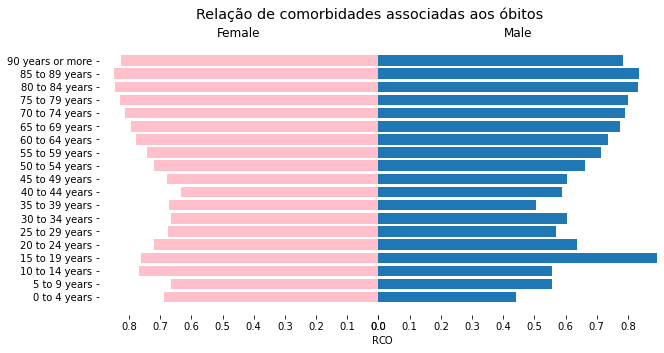

In [61]:
plot_piramide_etaria(piramide_rc,"RCO","RCO",
                     global_title="Relação de comorbidades associadas aos óbitos")

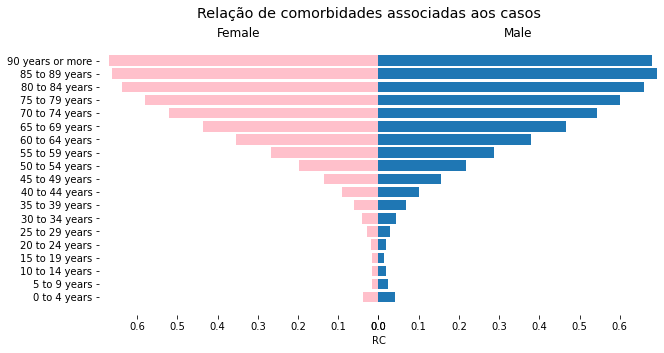

In [62]:
plot_piramide_etaria(piramide_rc,"RC","RC",
                    global_title = 'Relação de comorbidades associadas aos casos')

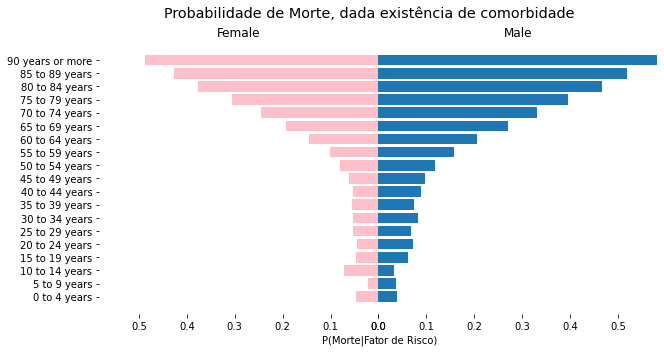

In [63]:
plot_piramide_etaria(piramide_rc,"pM_C","P(Morte|Fator de Risco)",
                     global_title="Probabilidade de Morte, dada existência de comorbidade")

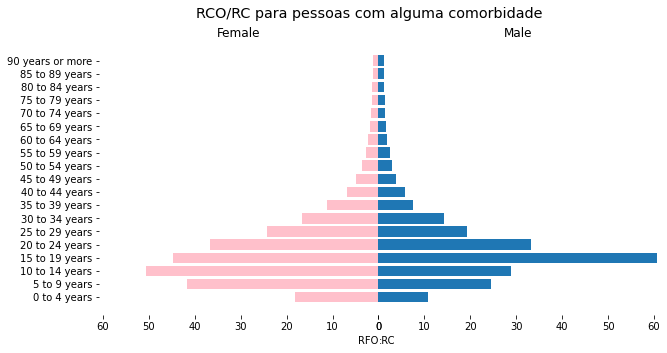

In [64]:
plot_piramide_etaria(piramide_rc,"RCORC","RFO:RC",global_title="RCO/RC para pessoas com alguma comorbidade")

## Taxa por cada uma das comorbidades

In [65]:
criar_base_rc_faixa_etaria(df=casos_sp_explode,
                                      bins_=bins,
                                      coluna_comorbidade = 'asma_pre')


,Idade,Sexo,obito_pre,asma_pre,casos_sp
0,0 a 4 anos,Homens,0,ignorado,6655
1,0 a 4 anos,Homens,0,não,73
2,0 a 4 anos,Homens,0,sim,37
3,0 a 4 anos,Homens,1,ignorado,22
4,0 a 4 anos,Homens,1,não,2
...,...,...,...,...,...
223,90 anos ou mais,Mulheres,0,não,430
224,90 anos ou mais,Mulheres,0,sim,29
225,90 anos ou mais,Mulheres,1,ignorado,981
226,90 anos ou mais,Mulheres,1,não,590


In [66]:
def plot_piramides_rc_faixa_etaria_comorbidade(df,bins_,coluna_comorbidade,nome_comorbidade="",path_save = None,
                                               especifica = False):
    if nome_comorbidade == "":
        nome_comorbidade = coluna_comorbidade
    
    if english:
        RCO = "RFD"
        RC = "RFC"
        pM_C = "P(Death|Risk factor)"
        RCORC = "RFD:RFC"
        razao_prob = "P(Death|Risk factor):P(Death|Any risk factor)"
    else:
        RCO = "RCO"
        RC = "RC"
        pM_C = "P(Morte|Fator de Risco)"
        RCORC = "RCO:RC"
        razao_prob = "P(Morte|Fator de Risco)/P(Morte|Qualquer fator de risco)"
    
    if path_save == None:
        saveRCO = None
        saveRC = None
        saveRCORC = None
        savepM_C = None
    else:
        saveRCO = path_save + "rco_" + nome_comorbidade + ".png"
        saveRC = path_save + "rc_" + nome_comorbidade + ".png"
        saveRCORC = path_save + "rco_rc_" + nome_comorbidade + ".png"
        savepM_C = path_save + "p_cond_" + nome_comorbidade + ".png"
    
    prc = criar_piramide_rc(df,bins_,coluna_comorbidade,especifica=especifica)
    
    plot_piramide_etaria(prc,
                         "RCO",
                         RCO,
                         global_title = nome_comorbidade.upper() + " - Relação de comorbidades associadas aos óbitos",
                         save=saveRCO)

    plot_piramide_etaria(prc,
                         "RC",
                         RC,
                         global_title = nome_comorbidade.upper() 
                                        + " - Relação de comorbidades associadas aos casos",
                         save= saveRC)

    plot_piramide_etaria(prc,
                         "RCORC",
                         RCORC,
                         global_title = nome_comorbidade.upper() + " - RCO/RC",
                         save = saveRCORC)
    
    plot_piramide_etaria(prc,
                         "pM_C",
                         pM_C,
                         global_title = nome_comorbidade.upper() + " - P(Morte|Fator de Risco)",
                         save = savepM_C)
    
    if not especifica:
        plot_piramide_etaria(prc,
                             "razao_prob",
                             razao_prob,
                             global_title = nome_comorbidade.upper() + " - P(Morte|Fator de Risco)/P(Morte|Qualquer fator de risco)",
                             save = None)

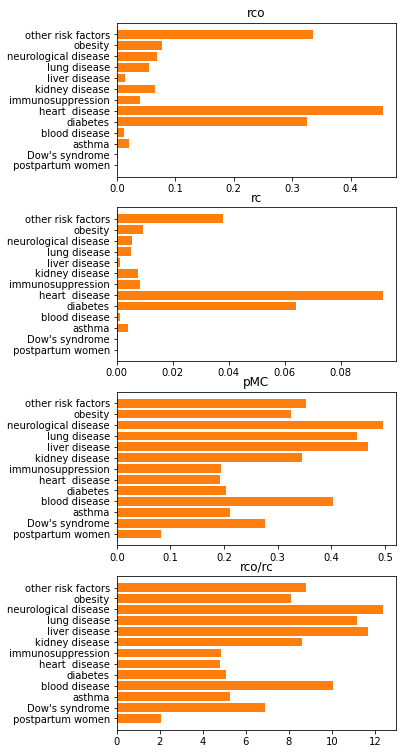

<Figure size 432x288 with 0 Axes>

In [67]:
def relacao_comorbidade_to_dict(df,coluna,aggfunc,coluna_comorbidade,especifica=False):
    output = relacao_comorbidade(df,coluna,aggfunc,coluna_comorbidade,especifica)
    return {"rco":[output[1]], 
            "rc": [output[2]], 
            "pMC" :[output[3]], 
            "rco/rc":[output[1]/output[2]]}
    
drc = reduce(lambda x,y: pd.concat((x,y)),
            [pd.DataFrame(relacao_comorbidade_to_dict(casos_sp_explode,"data_FIOCRUZ","count",c), 
                          index = [risk_factor_translation[c.replace("_pre","")]]) 
                          for c in comorbidades]).sort_index()
_,ax = plt.subplots(nrows = 4,figsize = (5,13))
ax = ax.flatten()
for i in range(4):
    ax[i].barh(width=drc.iloc[:,i], y = drc.index,color = "C1")
    ax[i].set_title(drc.iloc[:,i].name)
plt.show()
plt.tight_layout()

### ASMA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars


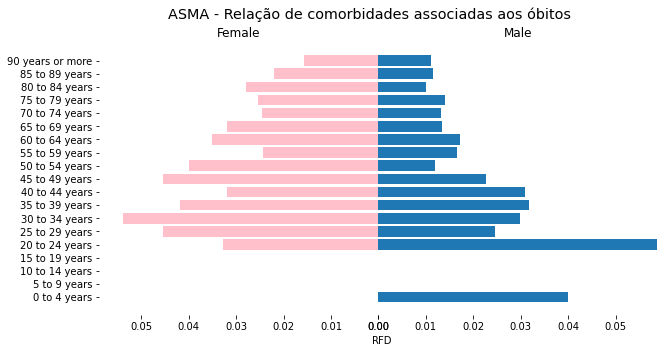

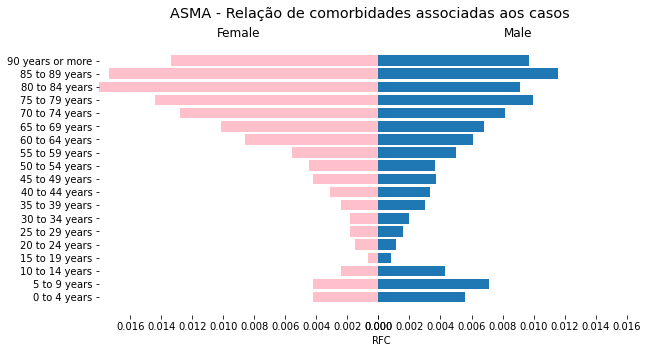

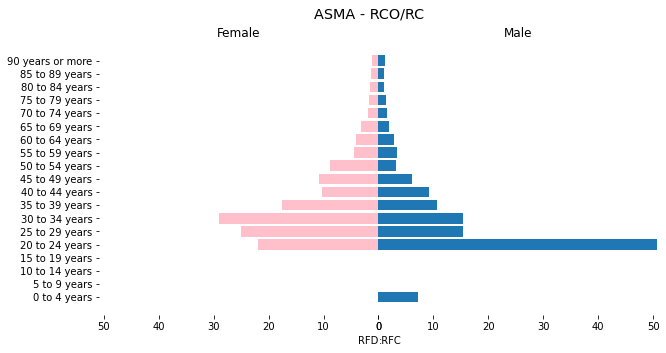

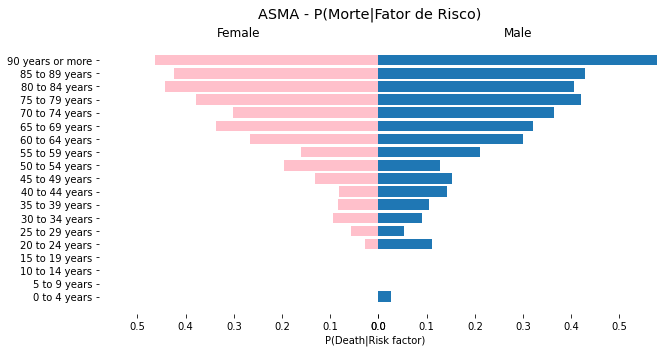

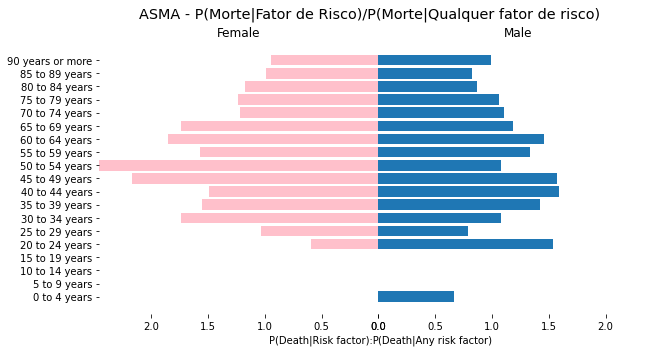

In [232]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'asma_pre','asma',
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

###  DIABETES

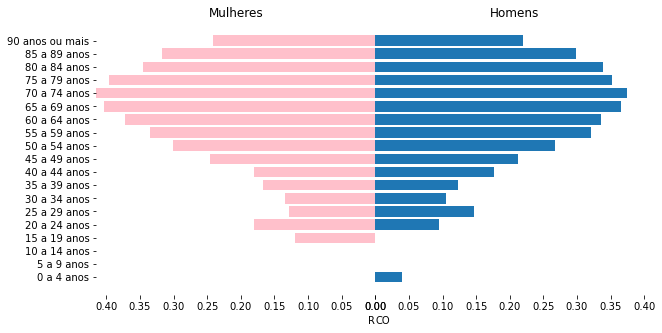

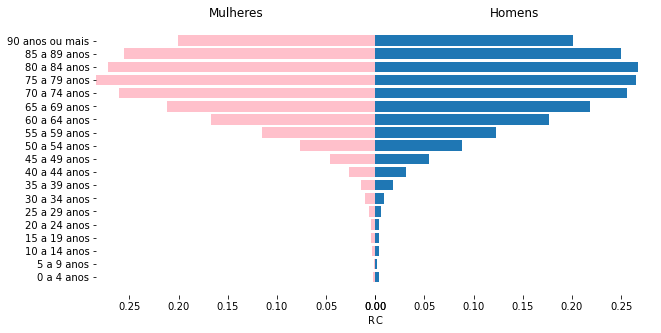

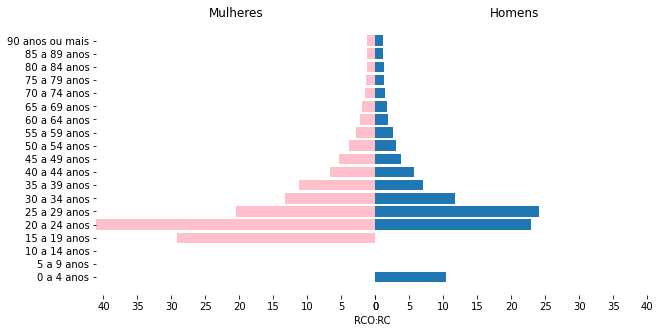

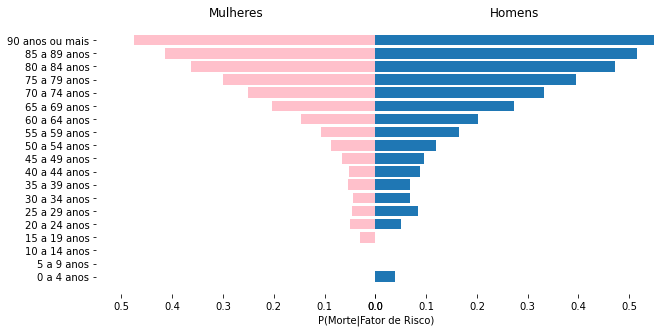

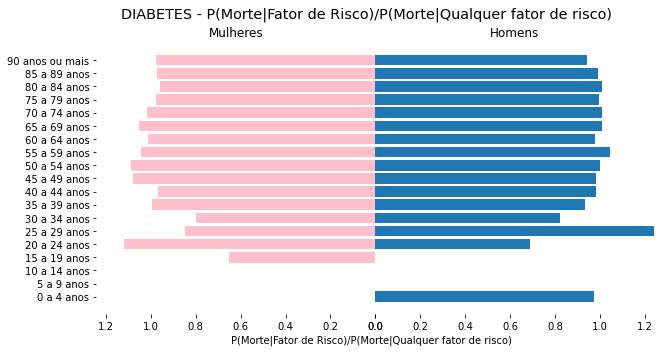

In [92]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'diabetes_pre',"diabetes",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

###  DOENÇA HEMATOLOGICA

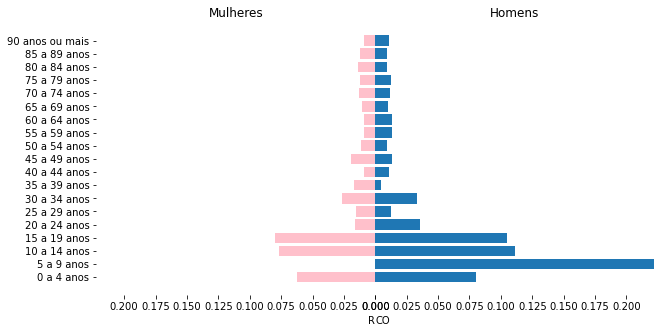

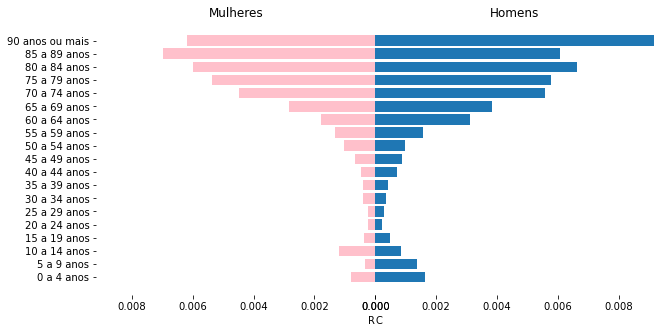

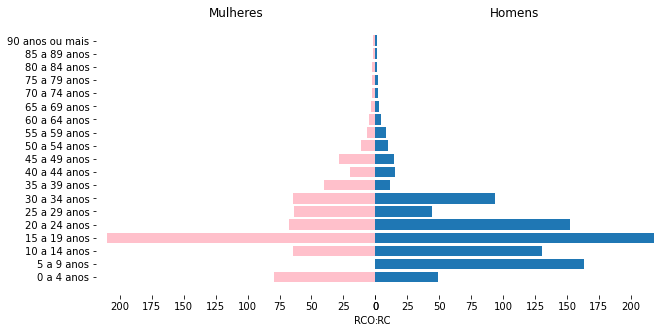

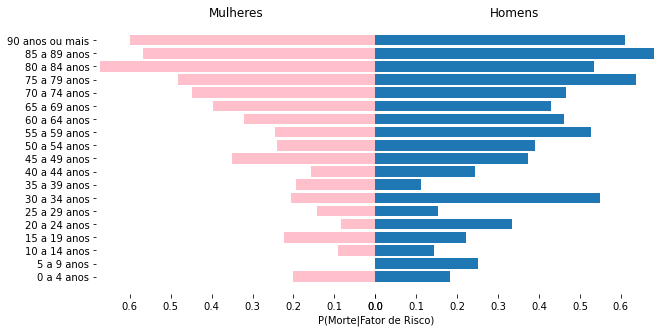

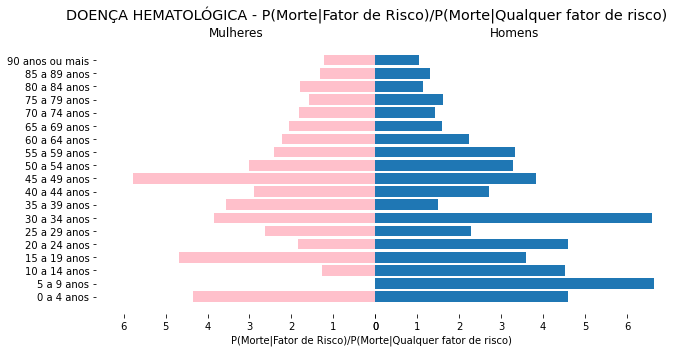

In [93]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_hematologica_pre',"doença hematológica",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

###  DOENCA HEPATICA

<ipython-input-61-9ab844de9795>:10: RuntimeWarning: invalid value encountered in longlong_scalars
<ipython-input-64-7271a71d6057>:44: RuntimeWarning: invalid value encountered in double_scalars


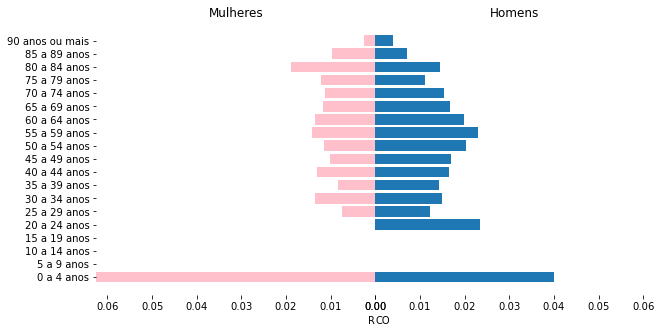

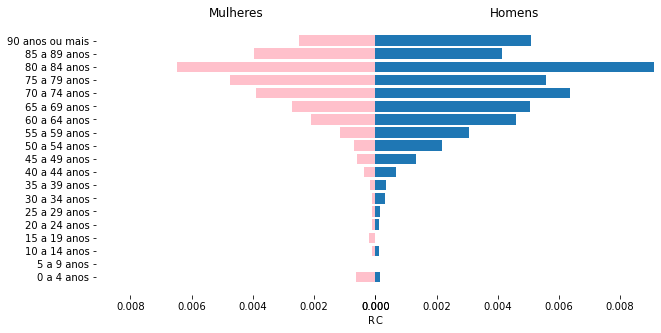

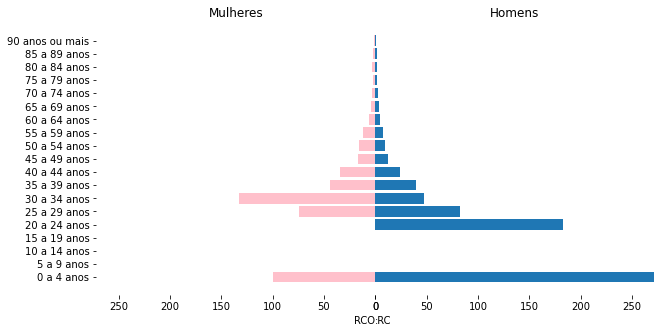

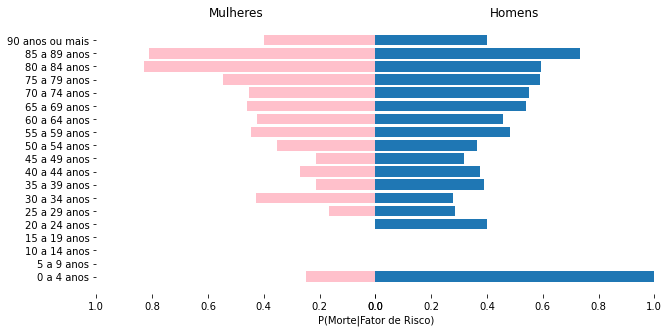

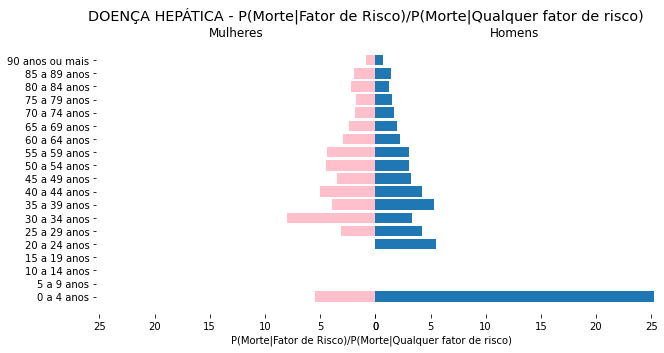

In [94]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_hepatica_pre',"doença hepática",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

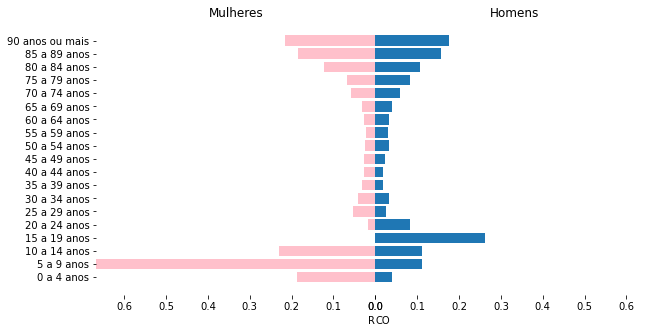

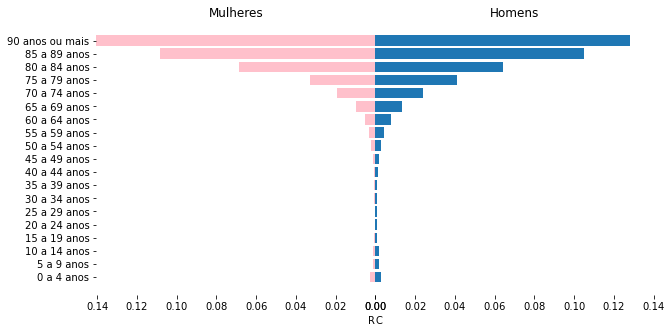

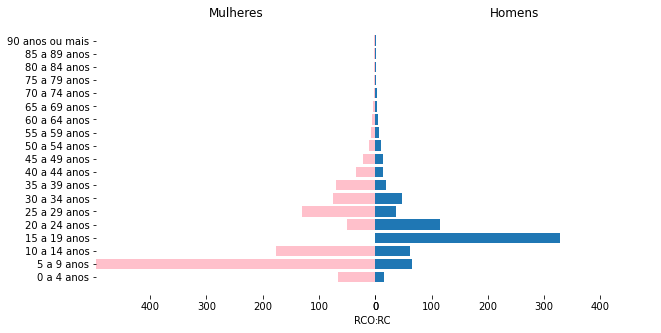

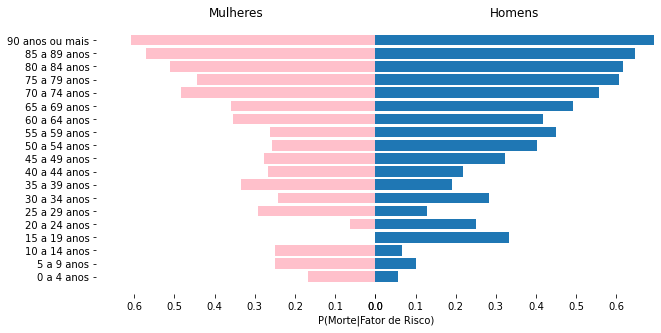

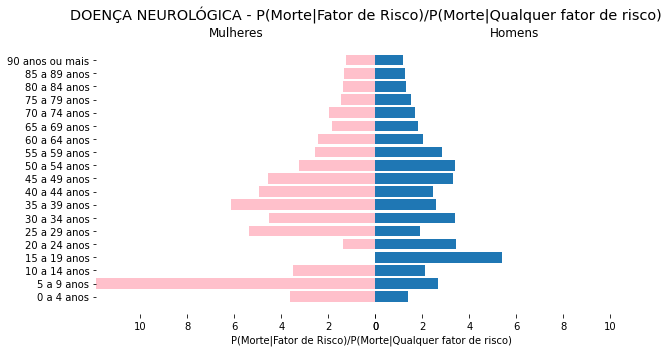

In [95]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_neurologica_pre',"doença neurológica",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

### DOENCA RENAL

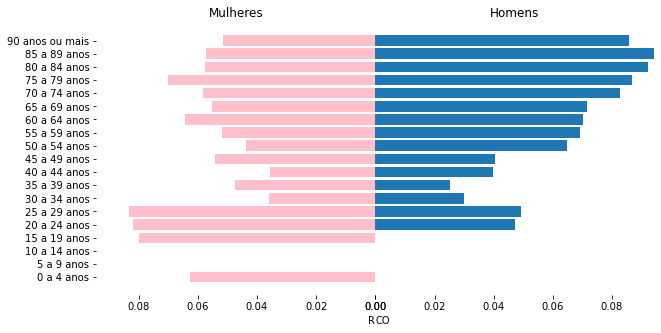

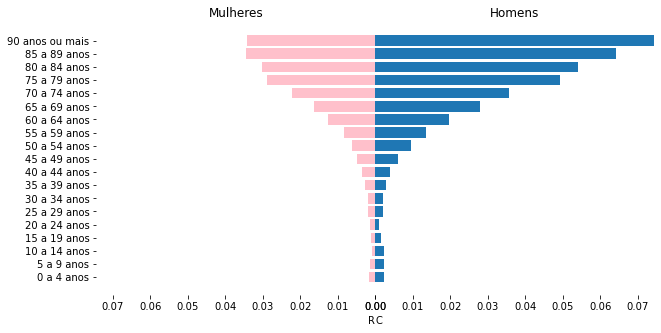

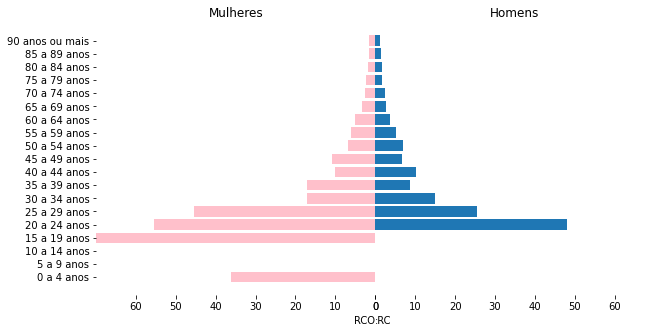

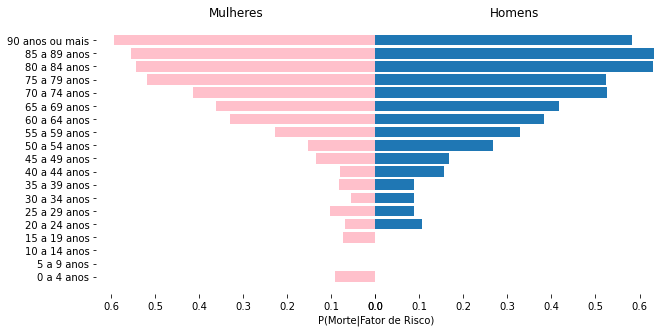

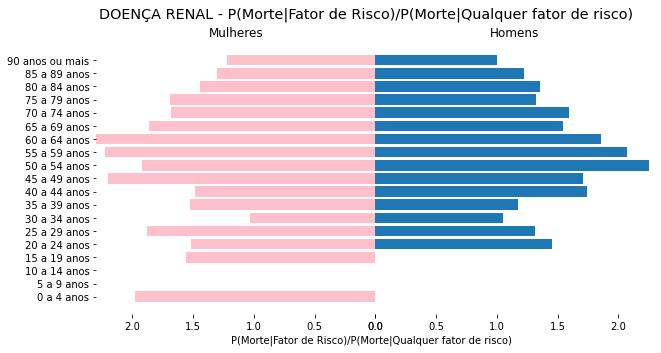

In [96]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_renal_pre',"doença renal",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

### IMUNODEPRESSÃO

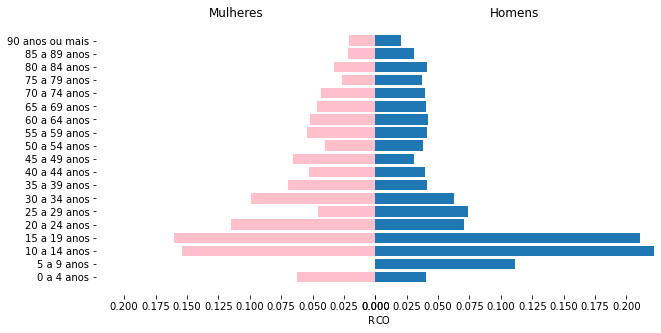

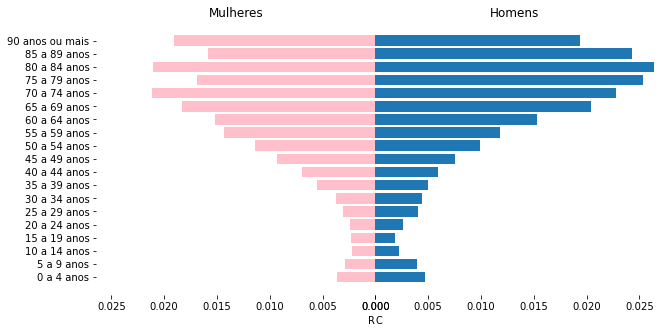

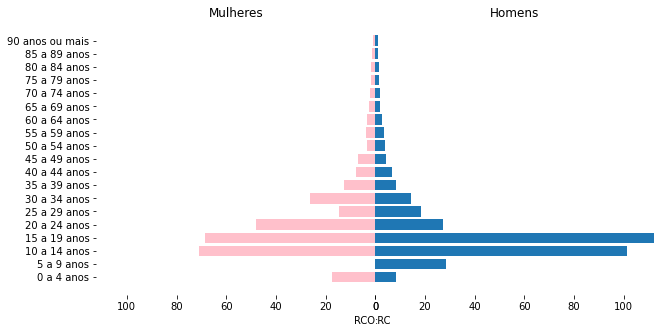

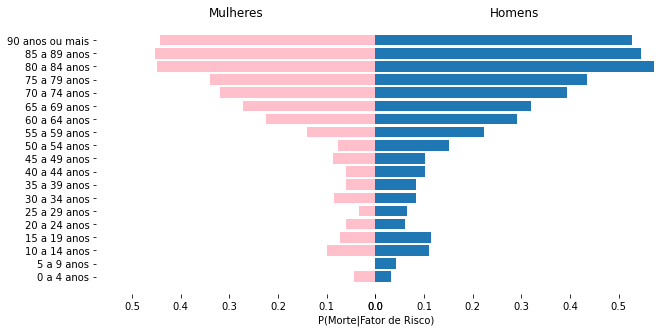

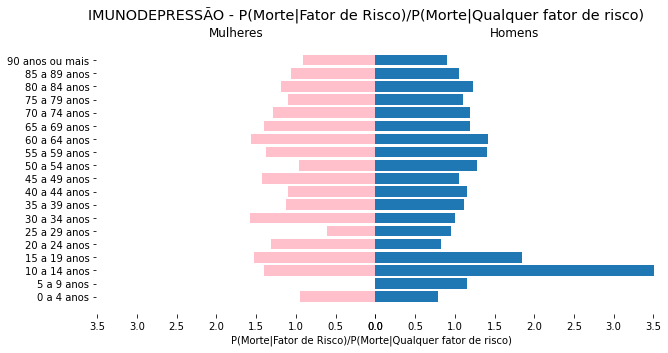

In [97]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'imunodepressao_pre',"imunodepressão",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

### OBESIDADE

<ipython-input-61-9ab844de9795>:10: RuntimeWarning: invalid value encountered in longlong_scalars
<ipython-input-64-7271a71d6057>:44: RuntimeWarning: invalid value encountered in double_scalars


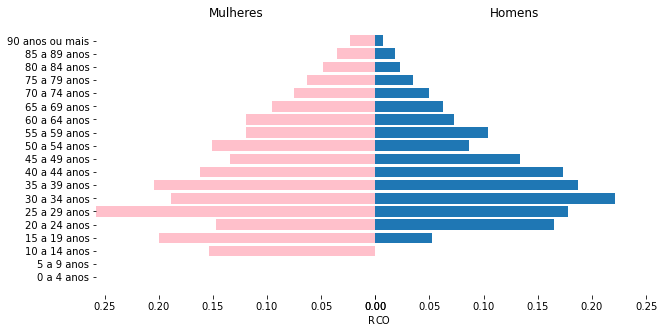

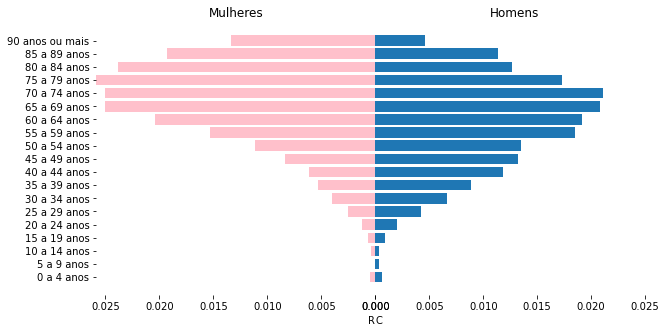

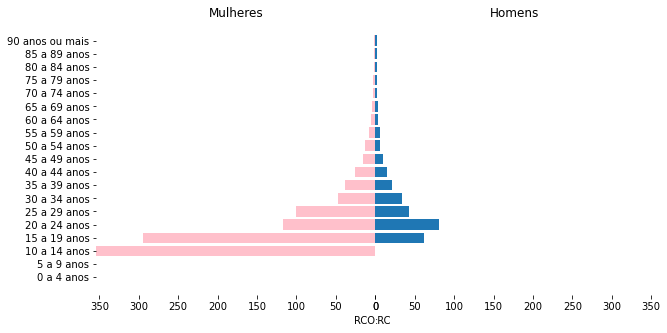

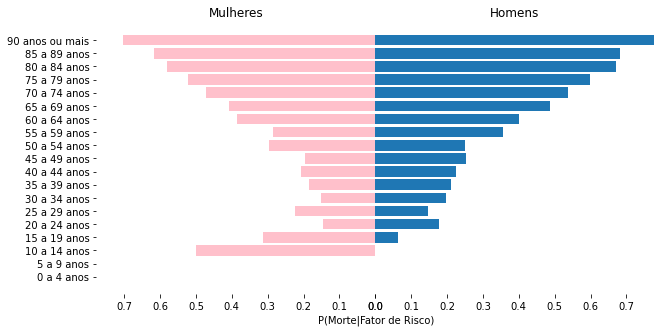

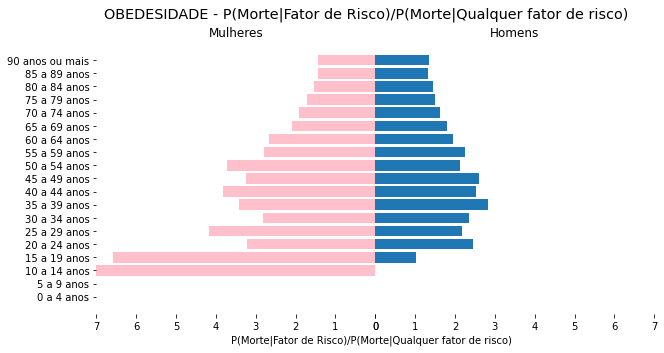

In [98]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'obesidade_pre',"obedesidade",
                                           path_save="C:\\Users\\otavio.t\\Desktop\\")

### OUTROS FATORES DE RISCO

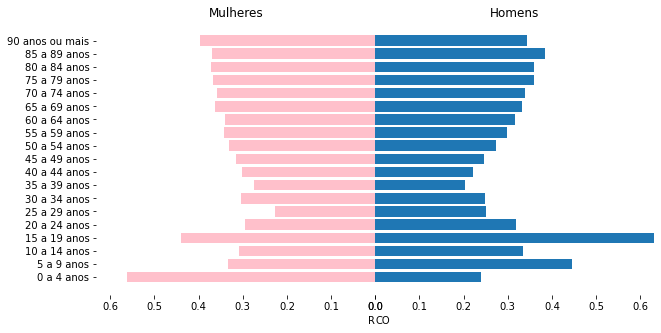

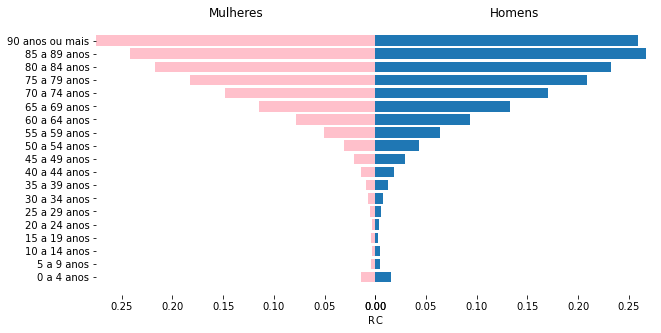

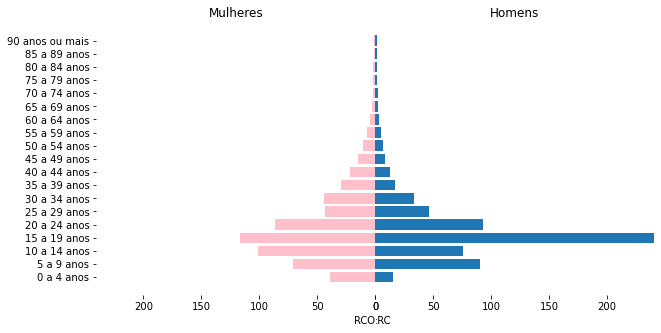

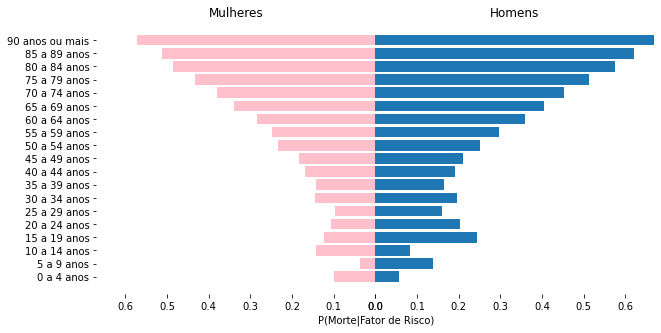

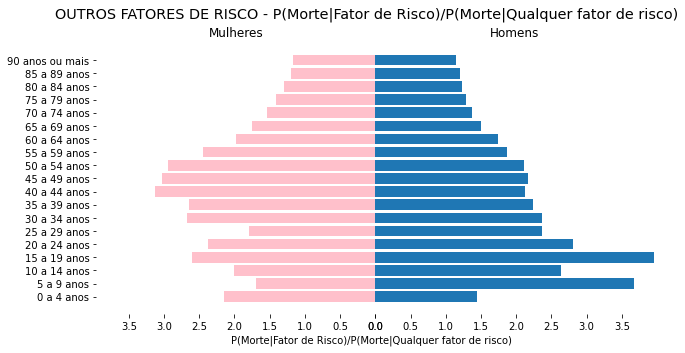

In [81]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'outros_fatores_de_risco_pre',"outros fatores de risco",
                                          path_save="C:\\Users\\otavio.t\\Desktop\\")

### CARDIOPATIA

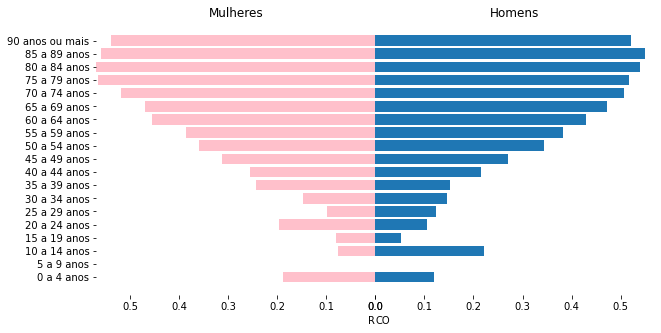

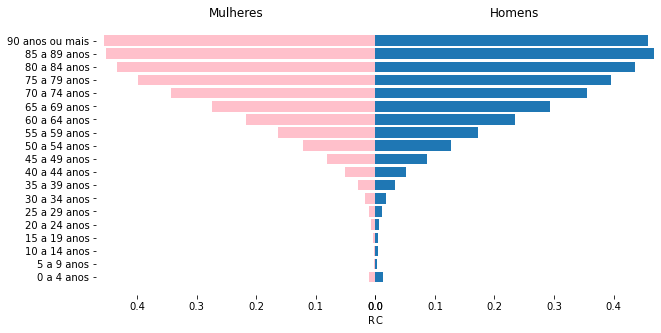

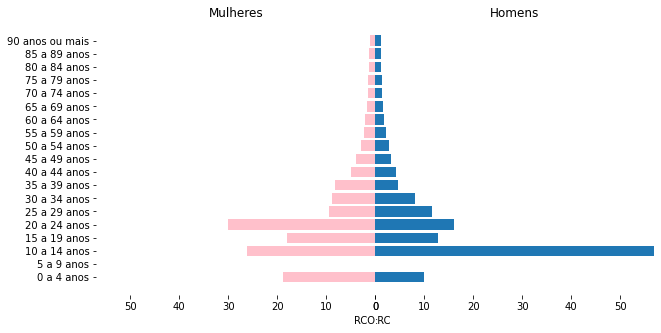

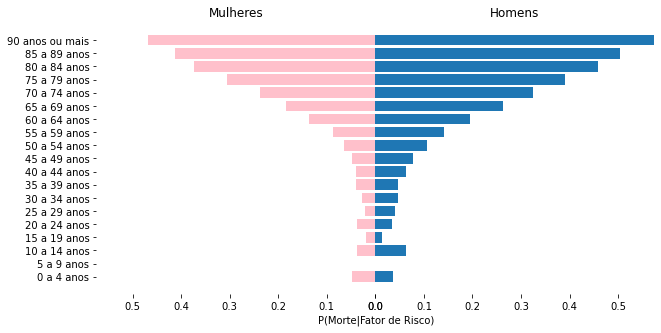

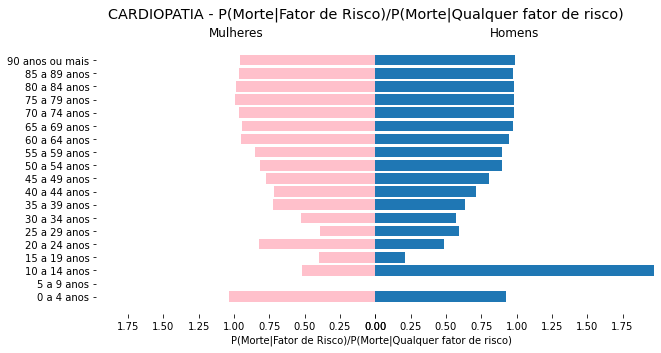

In [82]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'cardiopatia_pre',"cardiopatia",
                                          path_save="C:\\Users\\otavio.t\\Desktop\\")

### PNEUMOPATIA

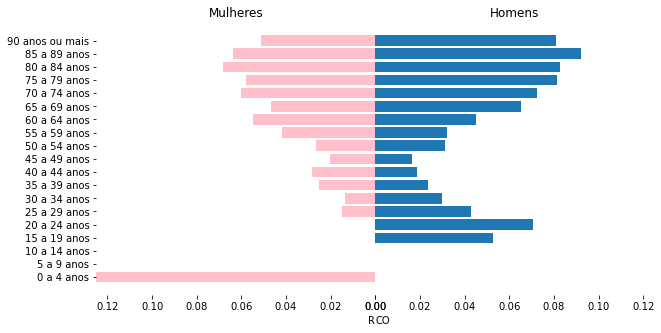

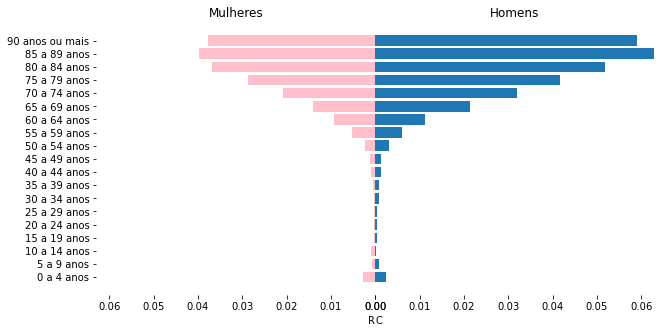

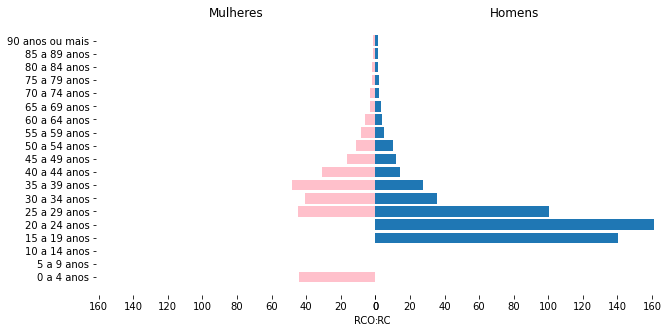

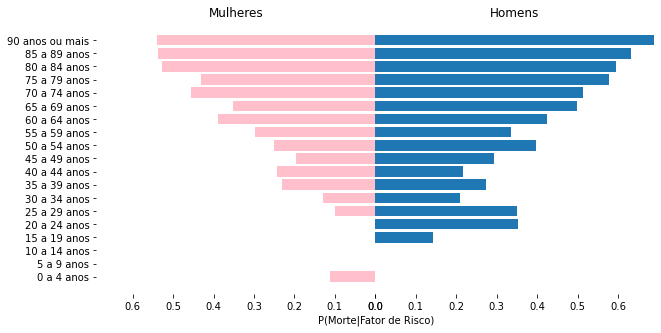

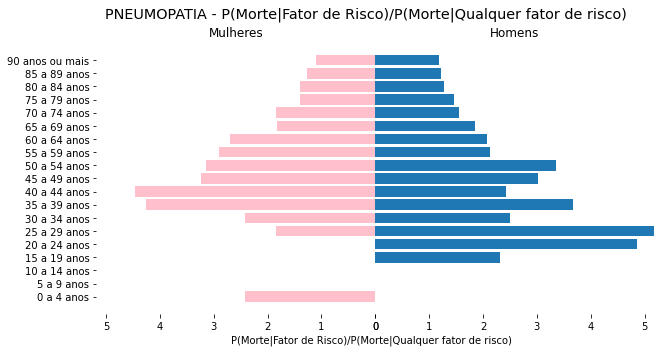

In [83]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'pneumopatia_pre',"pneumopatia",
                                          path_save="C:\\Users\\otavio.t\\Desktop\\")

### PUERPERA

<ipython-input-61-9ab844de9795>:10: RuntimeWarning: invalid value encountered in longlong_scalars
<ipython-input-64-7271a71d6057>:44: RuntimeWarning: invalid value encountered in double_scalars


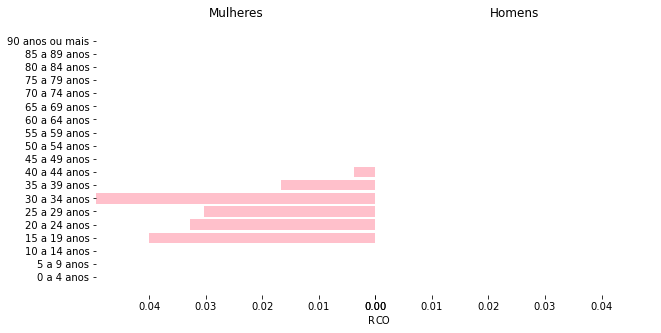

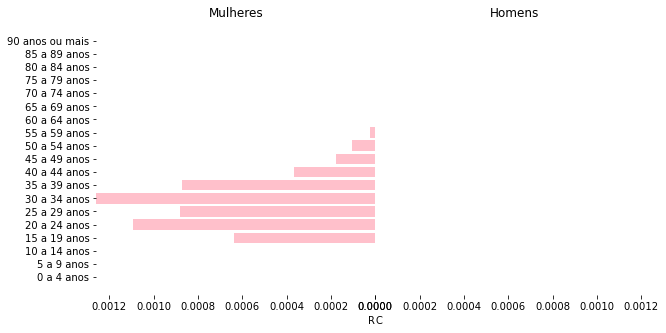

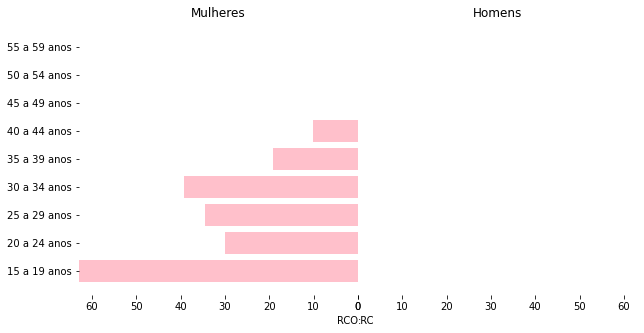

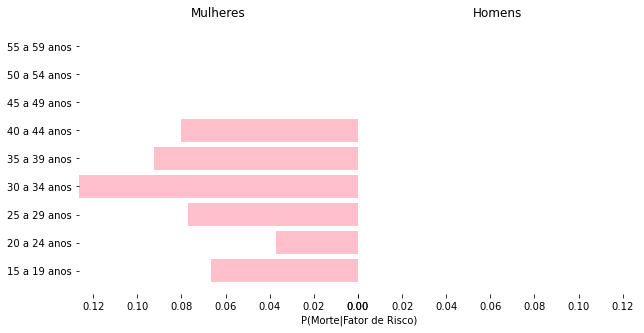

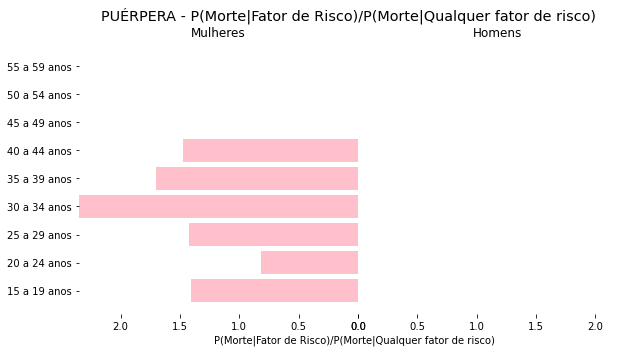

In [84]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'puerpera_pre',"puérpera",
                                          path_save="C:\\Users\\otavio.t\\Desktop\\")

### SINDROME DE DOWN

<ipython-input-61-9ab844de9795>:10: RuntimeWarning: invalid value encountered in longlong_scalars
<ipython-input-64-7271a71d6057>:44: RuntimeWarning: invalid value encountered in double_scalars


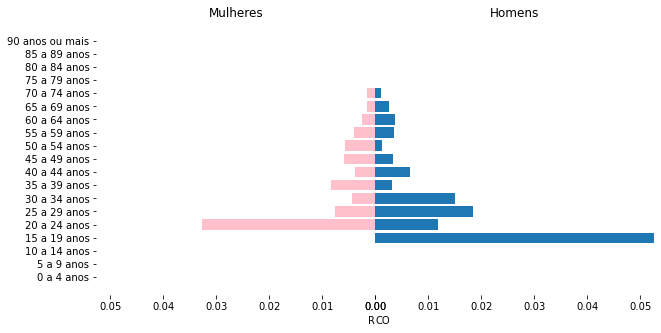

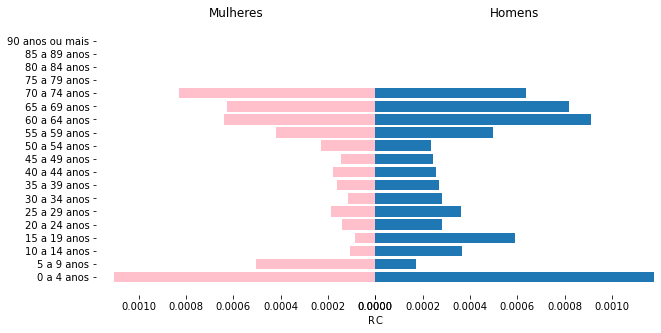

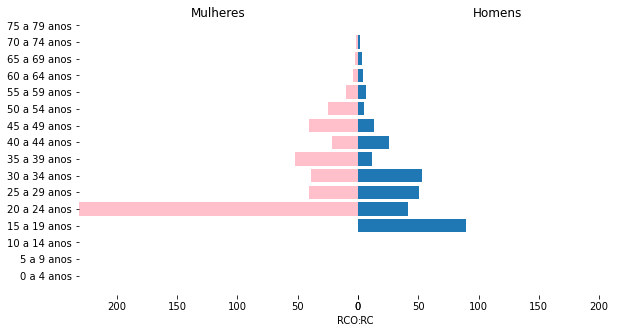

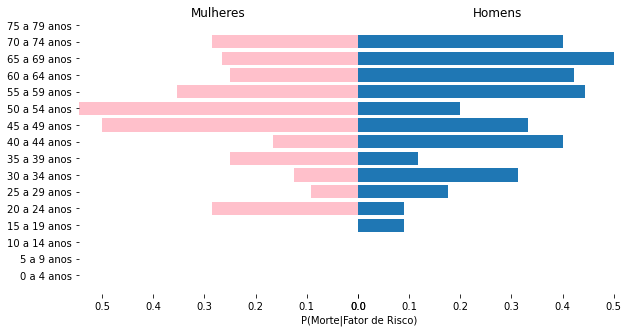

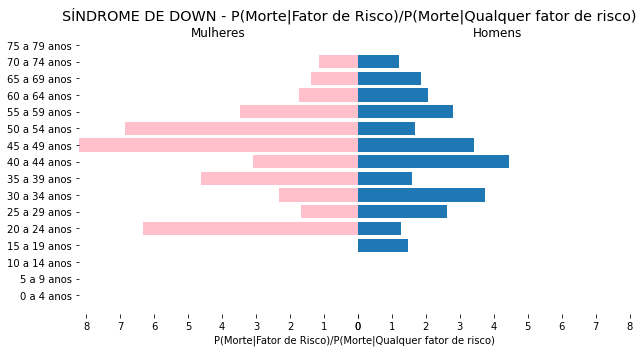

In [85]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'sindrome_de_down_pre',"síndrome de down",
                                          path_save="C:\\Users\\otavio.t\\Desktop\\")

# Taxa por cada uma das comorbidades isoladas

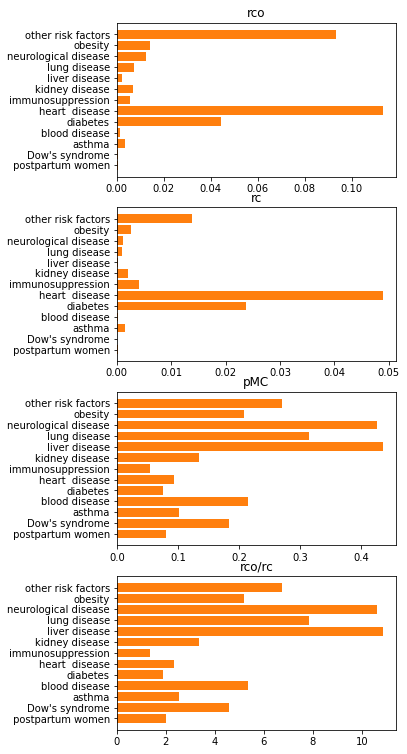

<Figure size 432x288 with 0 Axes>

In [68]:
drc = reduce(lambda x,y: pd.concat((x,y)),
            [pd.DataFrame(relacao_comorbidade_to_dict(casos_sp_explode,"data_FIOCRUZ","count",c,especifica=True), 
                          index = [risk_factor_translation[c.replace("_pre","")]]) 
                          for c in comorbidades]).sort_index()
_,ax = plt.subplots(nrows = 4,figsize = (5,13))
ax = ax.flatten()
for i in range(4):
    ax[i].barh(width=drc.iloc[:,i], y = drc.index,color = "C1")
    ax[i].set_title(drc.iloc[:,i].name)
plt.show()
plt.tight_layout()

## ASMA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


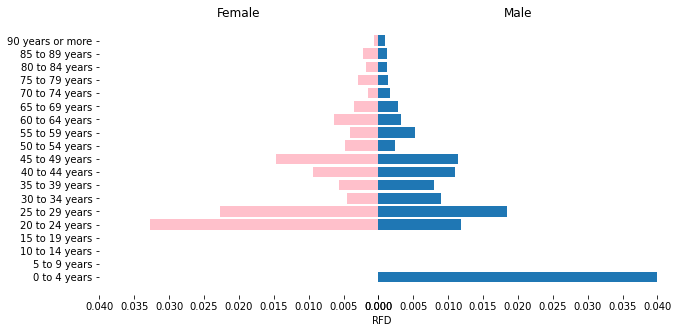

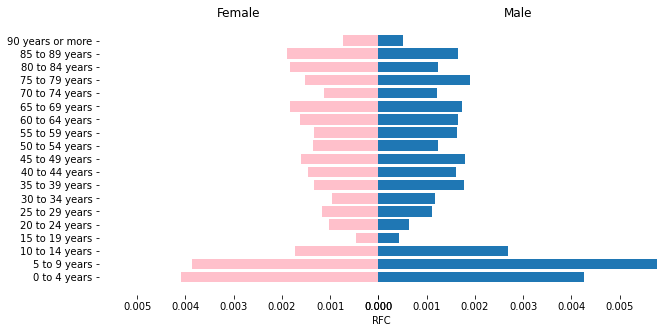

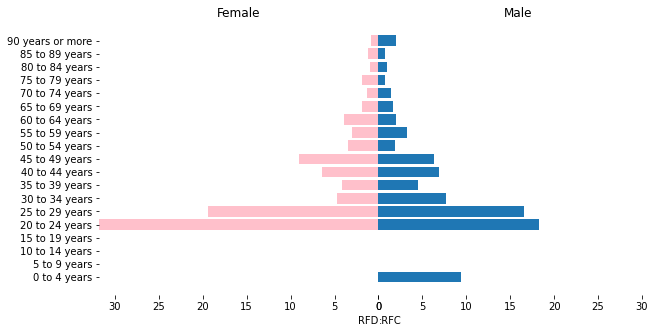

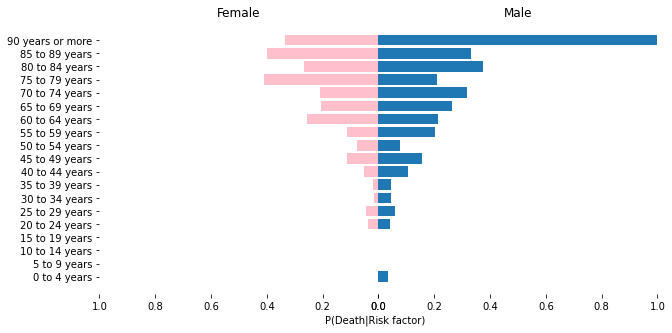

In [239]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'asma_pre','asthma_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## DIABETES

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


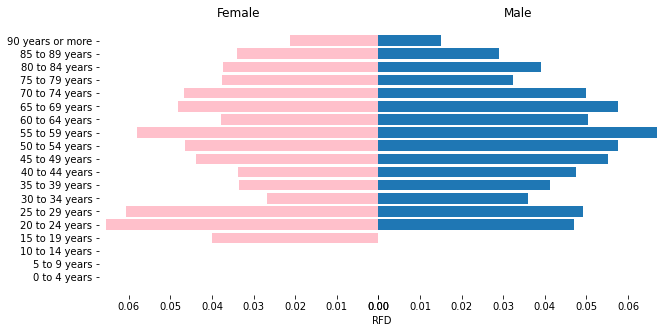

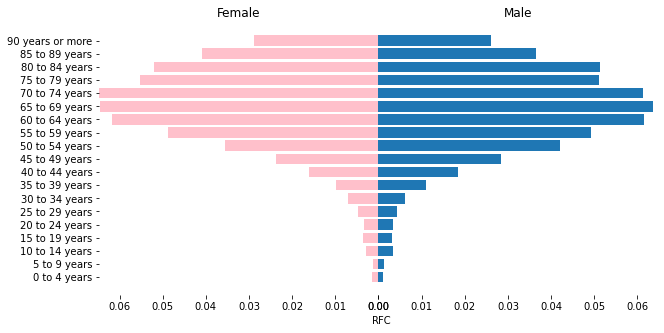

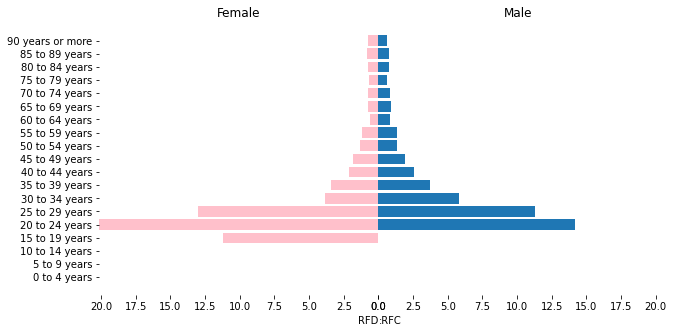

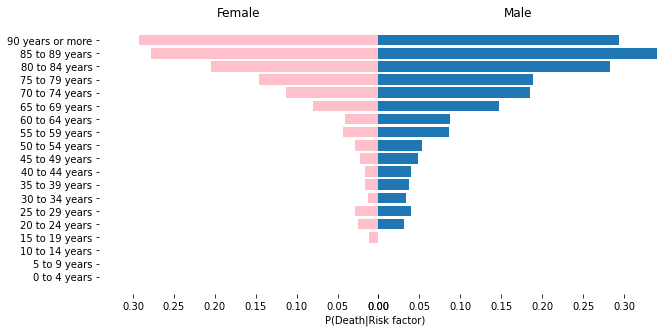

In [240]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'diabetes_pre','diabetes_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## DOENÇA HEMATOLOGICA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


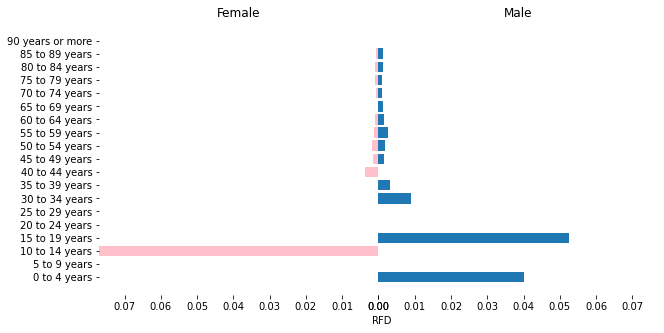

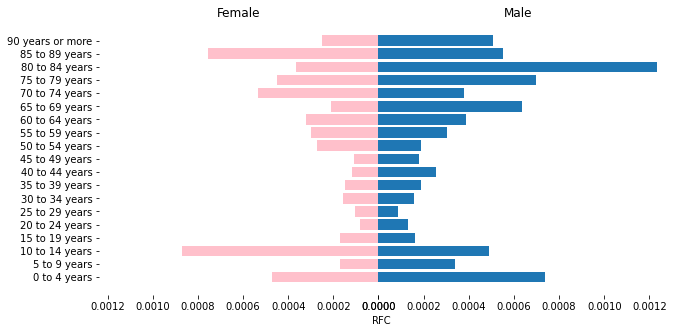

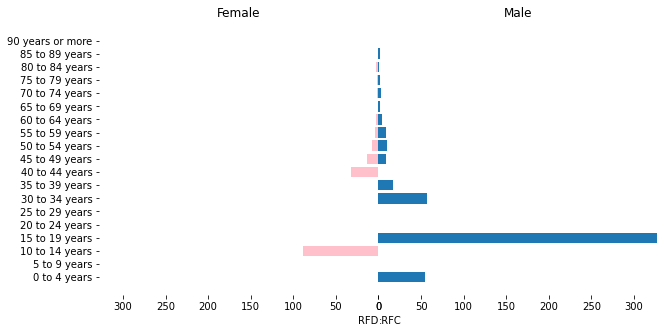

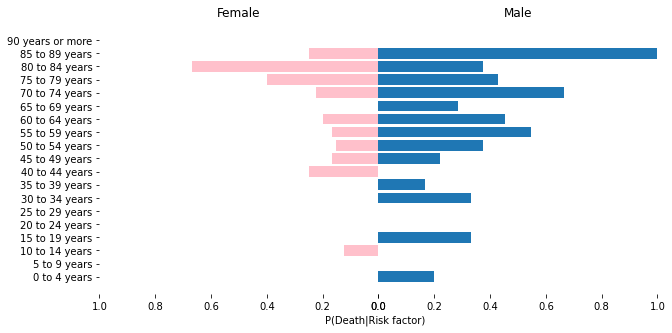

In [241]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_hematologica_pre','blood disease_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## DOENÇA HEPÁTICA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


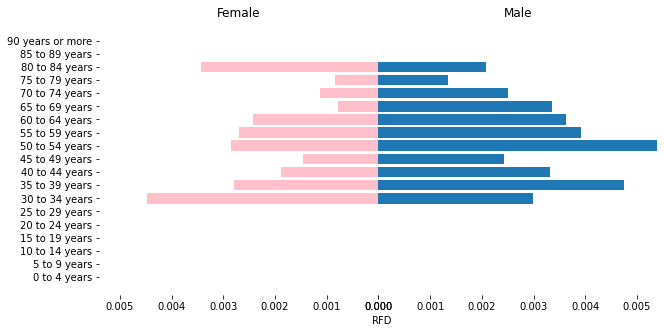

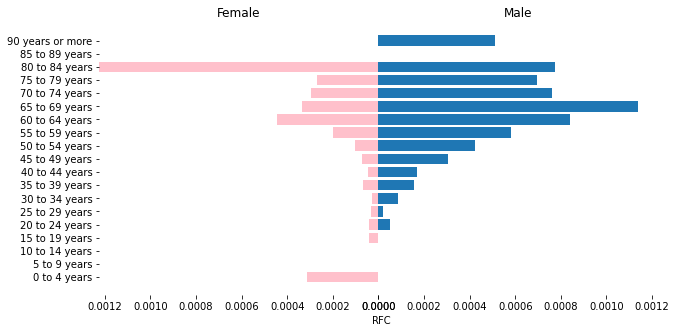

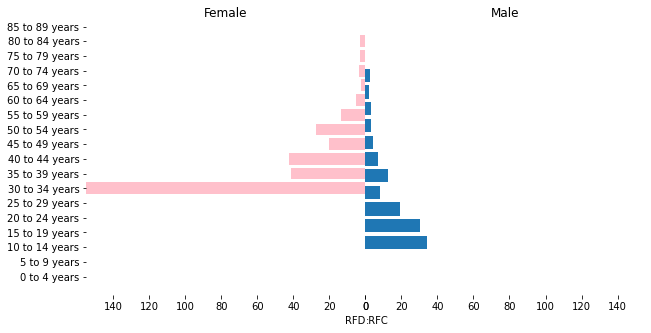

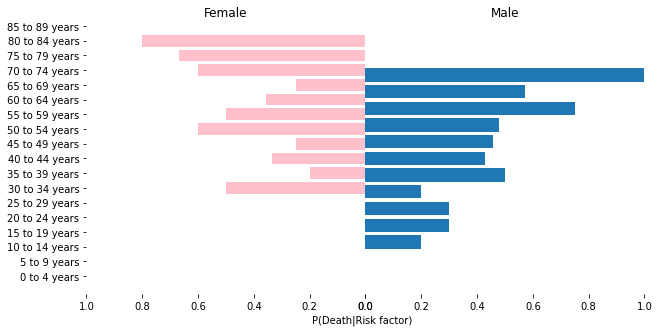

In [242]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_hepatica_pre','liver disease_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## DOENÇA RENAL

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


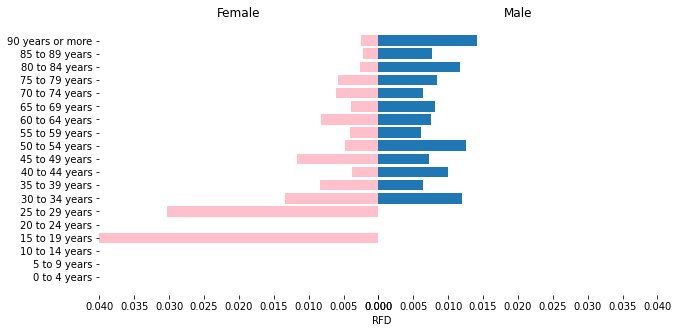

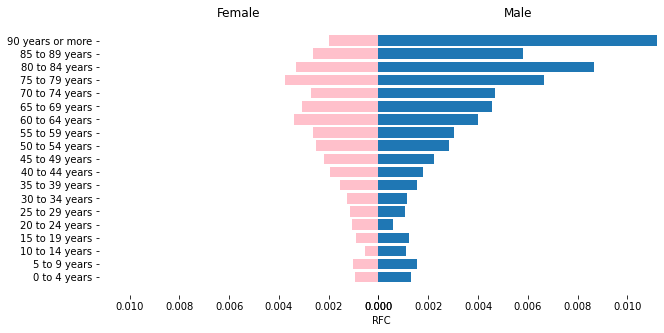

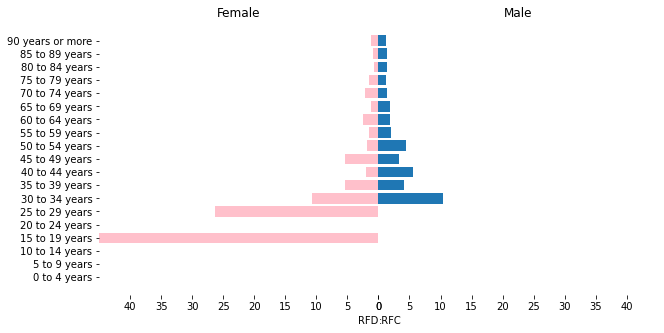

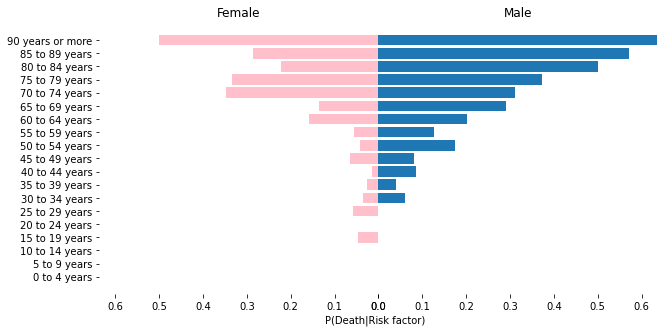

In [243]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'doenca_renal_pre','kidney disease_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## IMUNODEPRESSÃO

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


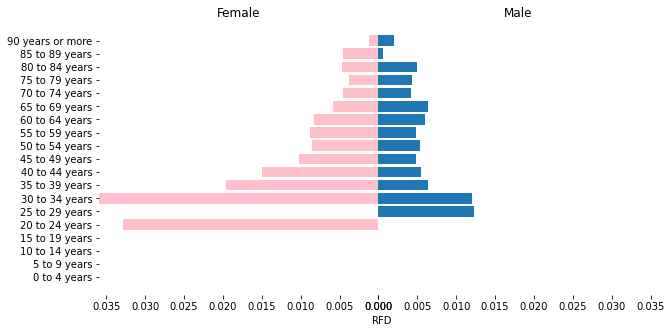

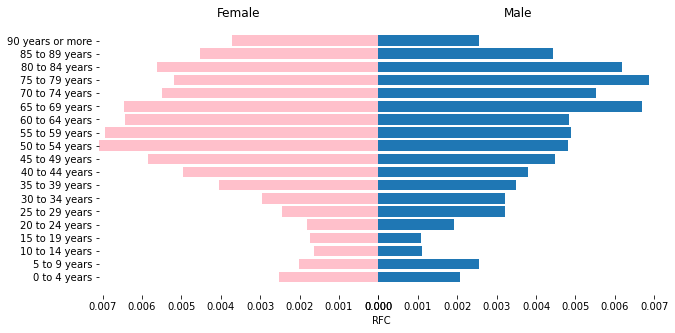

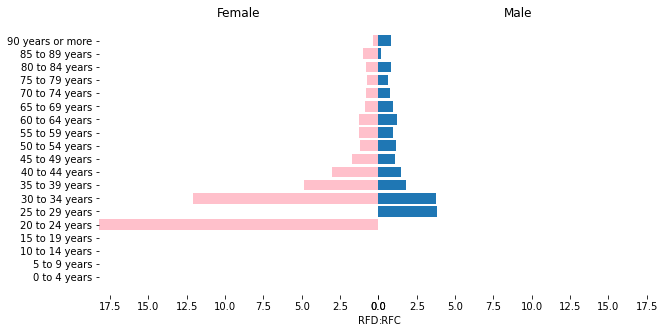

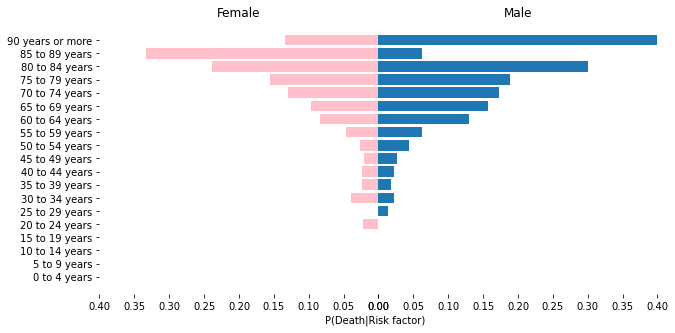

In [244]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'imunodepressao_pre','immunosupression_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## OBESIDADE

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


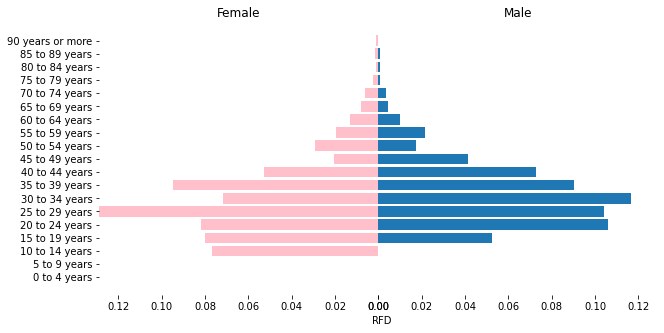

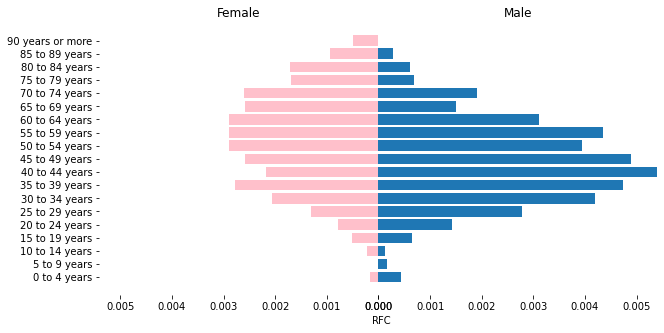

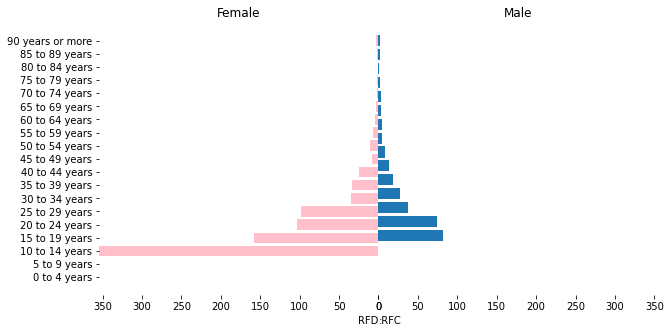

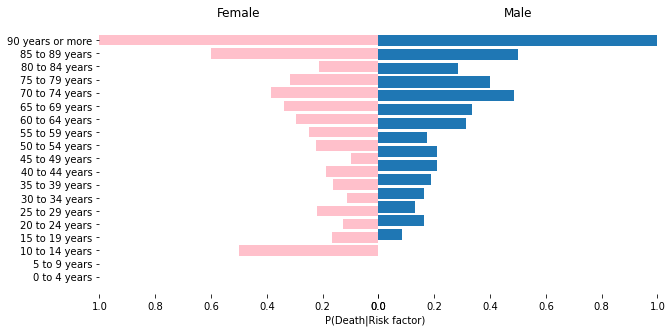

In [246]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'obesidade_pre','obesity_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## OUTROS FATORES DE RISCO

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


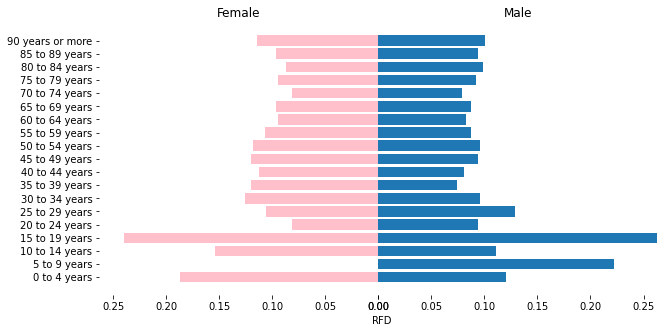

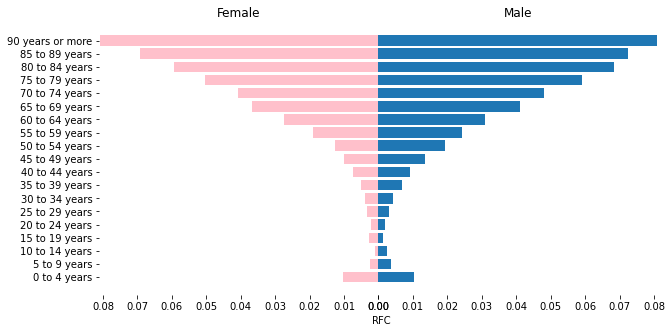

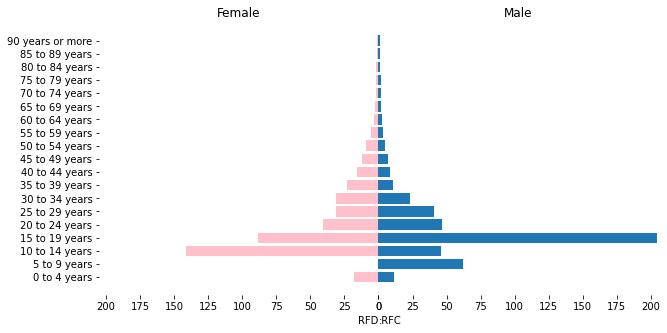

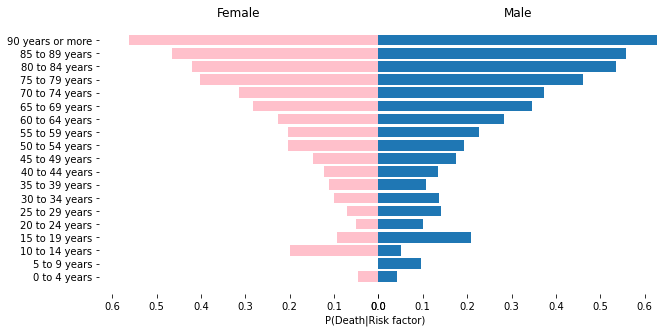

In [245]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'outros_fatores_de_risco_pre','other risk factors_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## CARDIOPATIA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


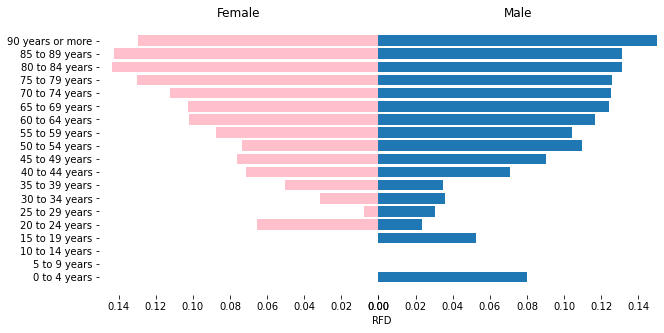

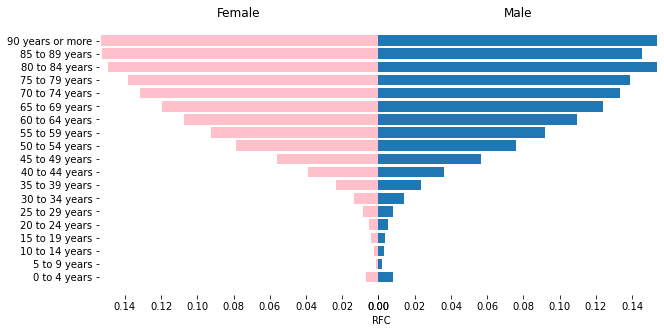

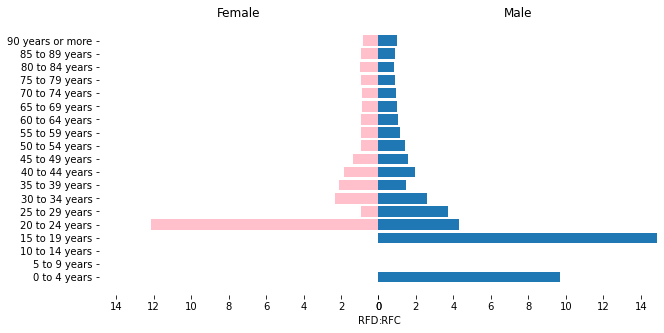

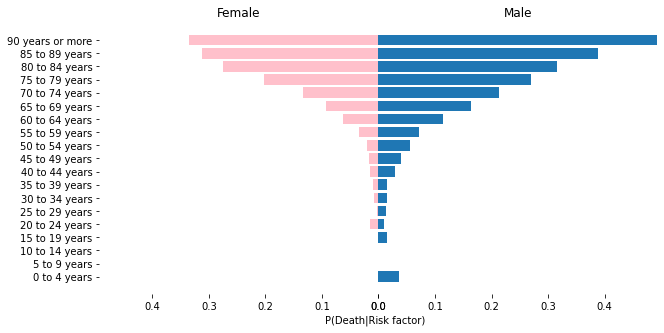

In [247]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'cardiopatia_pre','heart disease_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## PNEUOPATIA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


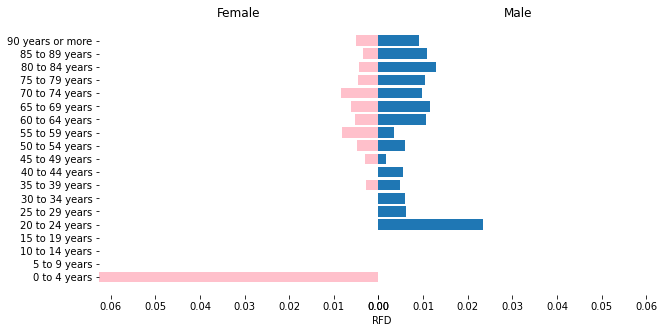

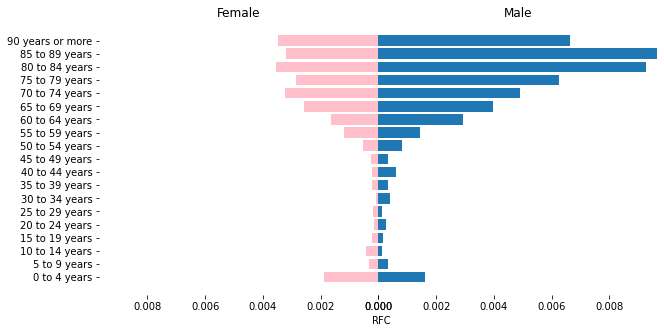

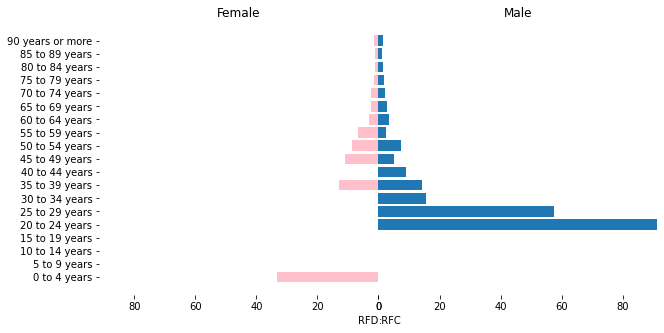

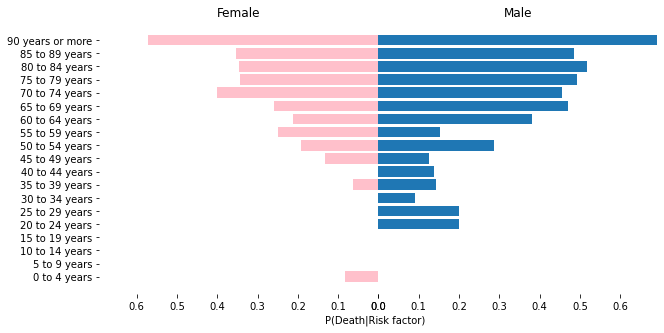

In [248]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'pneumopatia_pre','lung disease_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## PUERPERA

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


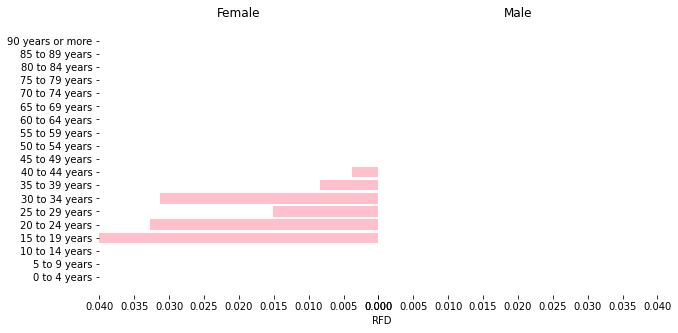

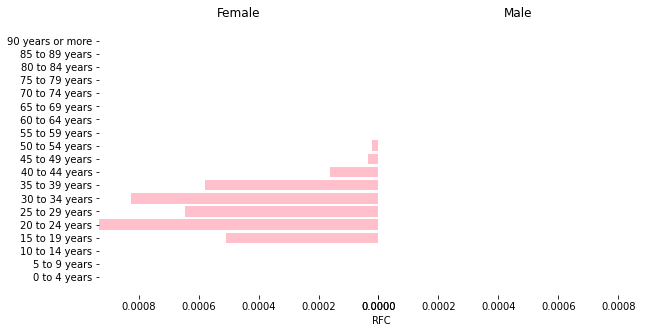

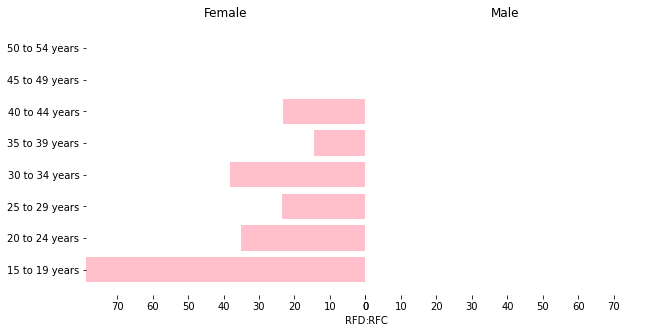

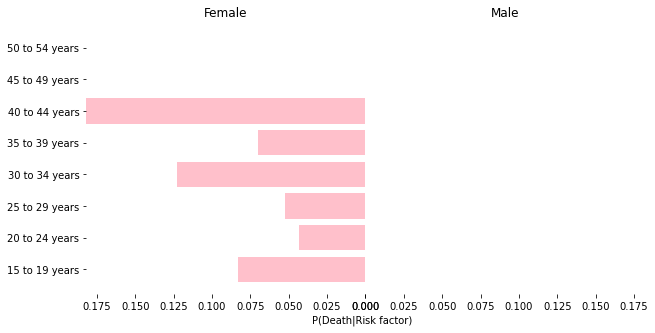

In [249]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'puerpera_pre','postpartum_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

## SINDROME DE DOWN

C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in double_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in longlong_scalars
C:\Users\ohbto\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in longlong_scalars


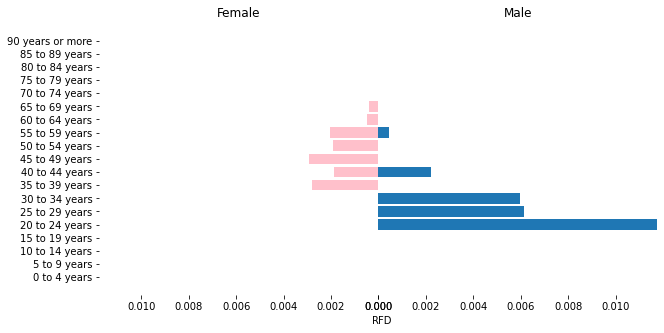

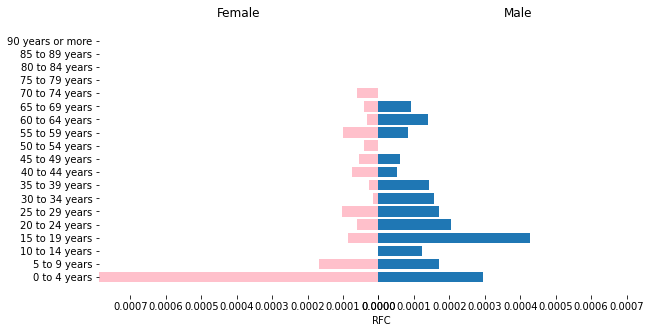

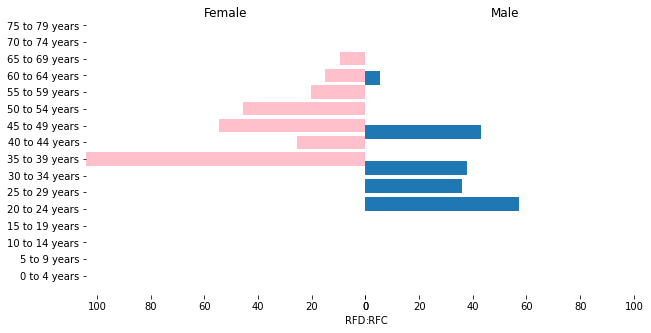

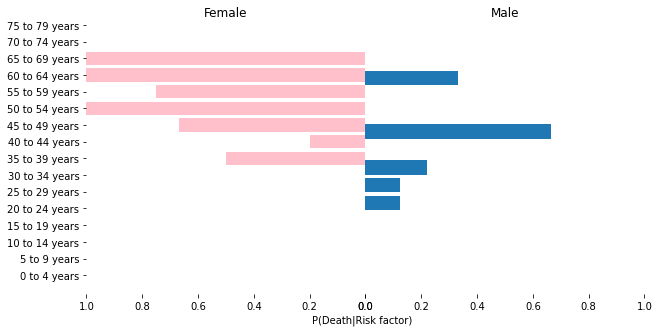

In [250]:
plot_piramides_rc_faixa_etaria_comorbidade(casos_sp_explode,bins,'sindrome_de_down_pre','Down\'s syndrome_specific',
                                           path_save="C:\\Users\\ohbto\\OneDrive\\Área de Trabalho\\Teste\\",
                                           especifica = True)

# Análise multivariada: comorbidades e mortes

Vamos aplicar uma regressão logística aos dados, para que possamos avaliar a influência das comorbidades e outras variáveis na chance de morte de uma pessoa que adquiriu a doença.<br>
Contudo, para aplicar a regressão logística, devemos nos atentar a algumas suposições que ela requer (conforme Stoltzfus JC. Logistic regression: a brief primer. Acad Emerg Med. 2011 Oct;18(10):1099-104. doi: 10.1111/j.1553-2712.2011.01185.x. PMID: 21996075):

1. __Independencia dos erros__, o que implica na não existência de registros duplicados;
1. __Relação linear__ entre entre as variáveis preditoras e o logito transformado da saída;
1. __Inexistência de multicolinearidade__ entre as variáveis preditoras;
1. *Outliers* não tenham tanta influência no resultado;
1. Deve haver um número adequado de eventos por variável independente para evitar *overfit* do modelo, com "regras práticas" mínimas comumente recomendadas variando de 10 a 20 eventos por covariável.

## Definição das variáveis preditoras

In [70]:
describe(casos_sp_explode.drop(columns = 'data_FIOCRUZ'))

Quantidade de linhas: 1134254


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,municipio_FIOCRUZ,object,0,0.0%,39,-,-,-,-,-,-,-,-,-,-
1,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,6,-,-,-,-,-,-,-,-,-,-
2,obito_pre,object,667,0.06%,2,-,-,-,-,-,-,-,-,-,-
3,cs_sexo_pre,object,2276,0.2%,2,-,-,-,-,-,-,-,-,-,-
4,idade_pre,object,1811,0.16%,113,-,-,-,-,-,-,-,-,-,-
5,asma_pre,object,667,0.06%,3,-,-,-,-,-,-,-,-,-,-
6,cardiopatia_pre,object,667,0.06%,3,-,-,-,-,-,-,-,-,-,-
7,diabetes_pre,object,667,0.06%,3,-,-,-,-,-,-,-,-,-,-
8,doenca_hematologica_pre,object,667,0.06%,3,-,-,-,-,-,-,-,-,-,-
9,doenca_hepatica_pre,object,667,0.06%,3,-,-,-,-,-,-,-,-,-,-


Vamos utilizar as variáveis acima como preditoras da variável __obito_pre__. Vamos fazer um pre-processamento, antes, para que possamos passar essas informações ao modelo, poisas variáveis estão num formato de *object* e devemos passar para um formato categórico, para que o modelo consiga entender

## Tratamento dos valores *missing*

Vemos, na tabela acima, que existem algumas variáveis possuem valores faltantes. Primeiramente, vamos remover os registros que possuem todos os valores das colunas com o sufixo *_pre* faltantes, pois, nesses casos, não houve registro de doentes nesses dias

In [71]:
colunas_pre = [c for c in casos_sp_explode.columns if "_pre" in c]
comorbidades_regressao = casos_sp_explode.drop(columns = 'data_FIOCRUZ') \
    .pipe(lambda x: x[len(colunas_pre)!=x[[c for c in casos_sp_explode.columns if "_pre" in c]].isna().sum(axis=1)])

In [73]:
describe(comorbidades_regressao)

Quantidade de linhas: 1133587


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,municipio_FIOCRUZ,object,0,0.0%,39,-,-,-,-,-,-,-,-,-,-
1,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,6,-,-,-,-,-,-,-,-,-,-
2,obito_pre,object,0,0.0%,2,-,-,-,-,-,-,-,-,-,-
3,cs_sexo_pre,object,1609,0.14%,2,-,-,-,-,-,-,-,-,-,-
4,idade_pre,object,1144,0.1%,113,-,-,-,-,-,-,-,-,-,-
5,asma_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
6,cardiopatia_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
7,diabetes_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
8,doenca_hematologica_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
9,doenca_hepatica_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-


Ainda existem alguns dados faltantes na base de dados, nos campos __cs_sexo_pre__ e __idade_pre__. Essas informações faltantes já estavam diagnosticadas na base de dados original, pois alguns campos ou não foram preenchidos ou simplesmente o sexo, por exemplo, foi classificado como INDEFINIDO. No caso das idades  faltantes, foram erros inseridos na base de dados.<br>
Como a quantidade de erros é bem pequena, frente ao tamanho da base de dados que temos, vamos simplesmente desconsiderar esses casos também

In [74]:
comorbidades_regressao = comorbidades_regressao.query("cs_sexo_pre == cs_sexo_pre & idade_pre == idade_pre") \
                            .assign(obito_pre = lambda x: x["obito_pre"].astype(int))
describe(comorbidades_regressao)

Quantidade de linhas: 1130834


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,municipio_FIOCRUZ,object,0,0.0%,39,-,-,-,-,-,-,-,-,-,-
1,nomeRegiaoSaude_FIOCRUZ,object,0,0.0%,6,-,-,-,-,-,-,-,-,-,-
2,obito_pre,int32,0,0.0%,2,0,0.0,0.0,0.040206,0.0,1,0.196441,4.68,19.91,0.2
3,cs_sexo_pre,object,0,0.0%,2,-,-,-,-,-,-,-,-,-,-
4,idade_pre,object,0,0.0%,113,-,-,-,-,-,-,-,-,-,-
5,asma_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
6,cardiopatia_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
7,diabetes_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
8,doenca_hematologica_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-
9,doenca_hepatica_pre,object,0,0.0%,3,-,-,-,-,-,-,-,-,-,-


## Tratamento dos dados para valores categóricos

O método Logit do pacote statsmodel não aceita valores categóricos para fazer sua predição, portanto, vamos fazer um ajuste nesses valores. Para as variáveis que representam as comorbidades, vamos fazer as seguintes substituições:

* sim -> 1
* não -> 0
* ignorado -> 0.5

Para o gênero dos pacientes, vamos fazer a seguinte mudança:

* masculino -> 0
* feminino -> 1

Para a idade dos pacientes, vamos aplicar uma normalização

Já para as cidades, vamos aplicar OneHot Encoding

In [75]:
comorbidades_regressao.asma_pre.value_counts()

ignorado    1078534
não           47718
sim            4582
Name: asma_pre, dtype: int64

In [76]:
class convert_comorbidade(BaseEstimator,TransformerMixin):
    def __init__(self,sim=1,nao=0,ignorado=0.5):
        self.sim = sim
        self.nao = nao
        self.ignorado = ignorado        
    
    def fit(self,X,y=None):
        self.__X__ = np.array(X)
        return self
        
    def transform(self,X,y=None):
         return np.where(X == 'sim',self.sim,
                         np.where(X == 'não',self.nao,
                                  self.ignorado))
    def fit_transform(self,X,y=None):
        self.fit(X,y)
        return self.transform(X,y)

In [77]:
tranformador = ColumnTransformer([('sexo',OneHotEncoder(drop='if_binary'),['cs_sexo_pre']),
                                 ('comorbidades',convert_comorbidade(),comorbidades),
                                 ("idade",MinMaxScaler(),["idade_pre"]),
                                 ("cidades",OneHotEncoder(drop='first'),["municipio_FIOCRUZ","nomeRegiaoSaude_FIOCRUZ"]),
                                 ('obito',"passthrough",["obito_pre"])],
                                 remainder='drop')

tranformador.fit(comorbidades_regressao)
df_comor = pd.DataFrame(tranformador.transform(comorbidades_regressao).todense(),
                        columns=["cs_sexo_pre"] \
                                +comorbidades \
                                +["idade_pre"]+ \
                                comorbidades_regressao.municipio_FIOCRUZ.unique()[1:].tolist()
                                +[c.lower().replace(" ","_") 
                                  for c in comorbidades_regressao.nomeRegiaoSaude_FIOCRUZ.unique()[1:]]
                                +["obito_pre"])
df_comor.head()

,cs_sexo_pre,asma_pre,cardiopatia_pre,diabetes_pre,doenca_hematologica_pre,doenca_hepatica_pre,doenca_neurologica_pre,doenca_renal_pre,imunodepressao_pre,obesidade_pre,...,SAO PAULO,SUZANO,TABOAO DA SERRA,VARGEM GRANDE PAULISTA,rota_dos_bandeirantes,franco_da_rocha,mananciais,grande_abc,sao_paulo,obito_pre
0,1.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.5,1.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [78]:
describe(df_comor)

Quantidade de linhas: 1130834


,variable,type,na,na_pct,unique,min,quat25,median,mean,quat75,max,std,skewness,kurtosis,media_desvio
0,cs_sexo_pre,float64,0,0.0%,2,0.0,0.000000,0.000000,0.460615,1.000000,1.0,0.498447,0.16,-1.98,0.92
1,asma_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.480927,0.500000,1.0,0.105823,-3.48,17.35,4.54
2,cardiopatia_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.537989,0.500000,1.0,0.164512,1.43,5.09,3.27
3,diabetes_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.518329,0.500000,1.0,0.149588,1.00,7.76,3.47
4,doenca_hematologica_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.478704,0.500000,1.0,0.103869,-4.13,17.51,4.61
5,doenca_hepatica_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.478817,0.500000,1.0,0.103658,-4.13,17.61,4.62
6,doenca_neurologica_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.482008,0.500000,1.0,0.107078,-3.15,17.13,4.50
7,doenca_renal_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.483165,0.500000,1.0,0.109409,-2.75,16.55,4.42
8,imunodepressao_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.482989,0.500000,1.0,0.111073,-2.64,15.98,4.35
9,obesidade_pre,float64,0,0.0%,3,0.0,0.500000,0.500000,0.485508,0.500000,1.0,0.108515,-2.43,17.20,4.47


Para uma primeira analise, vamos desconsiderar as colunas referentes as cidades, por questões de facilidade

In [79]:
colunas_cidades = [c for c in df_comor.columns if "_pre" not in c]
df_comor_simples = df_comor[[c for c in df_comor.columns if c not in colunas_cidades]]

## Verificando duplicidade nos dados

In [80]:
df_comor_simples.duplicated().value_counts()

True     1100879
False      29955
dtype: int64

In [81]:
#Como existem muitos casos iguais, vamos removê-los
df_comor_simples = df_comor_simples.drop_duplicates(keep="first")
comorbidades_regressao_simples = comorbidades_regressao[df_comor_simples.columns].drop_duplicates(keep="first")

## Análise de multicolinearidade

Para que a regressão logística possa ser válida, as suposições apresentadas anteriormente devem ser satisfeitas. Vamos avaliá-las

### Coeficiente de Cramer V

Para esse teste, devemos aplicar algum teste de avaliação de colinearidade entre as variáveis, ou seja, devemos verificar se existe alguma correlação entre as variáveis. Para este caso, temos as seguintes combinações de variáveis:

* categórica/categórica -> coeficiente de Cramer V
* categórica/numérica -> análise gráfica

In [110]:
def gera_nomes_mapa_calor():
    dicionario_categoricas_traducao = {chave + "_pre": valor for chave,valor in risk_factor_translation.items()}
    if english:
        dicionario_categoricas_traducao.update({"obito_pre":"death", "cs_sexo_pre":"gender"})
    else:
        dicionario_categoricas_traducao.update({"obito_pre":"óbito", "cs_sexo_pre":"gênero"})
    return dicionario_categoricas_traducao

In [82]:
#Criando uma função para o cálculo do coeficiente de Cramer V: o valor 0 indica que as variáveis não tem nenhum tipo 
#de associação e o valor 1 revela que elas são perfeitamente associadas.
def cramers_V(var1,var2) :
    crosstab =np.array(pd.crosstab(var1,var2, rownames=None, colnames=None)) # Cross table building
    stat = chi2_contingency(crosstab,correction=False)[0] # Keeping of the test statistic of the Chi2 test
    obs = np.sum(crosstab) # Number of observations
    mini = min(crosstab.shape)-1 # Take the minimum value between the columns and the rows of the cross table
    return (stat/(obs*mini))

In [83]:
#Definindo quem sao as variaveis categóricas
categoricas_simples = comorbidades + ["cs_sexo_pre"] + ["obito_pre"]

In [84]:
def cria_matriz_comparacao(df,colunas,funcao):
    result_ = {}
    for c1,c2 in product(colunas,colunas):
        resultado_funcao = funcao(df[c1],df[c2])
        if c1 in result_.keys():
            result_[c1].append(resultado_funcao)
        else:
            result_[c1] = [resultado_funcao]
    return result_

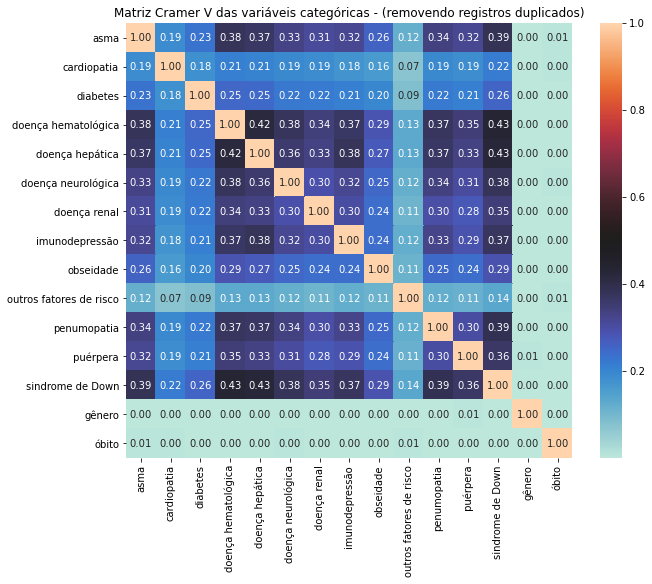

In [113]:
def plot_matriz_calor(df,colunas,funcao,titulo):
    resultado = cria_matriz_comparacao(df,colunas,funcao)
    fig,ax = plt.subplots(figsize=(10,8))
    sns.heatmap(pd.DataFrame(resultado,
                             index= pd.Series(resultado.keys()).replace(gera_nomes_mapa_calor()))\
                .rename(columns = gera_nomes_mapa_calor()),
                cmap="icefire",
                annot=True,
                fmt='.2f',
                ax=ax)
    ax.set_title(titulo)
    return ax

plot_matriz_calor(df_comor_simples,categoricas_simples,cramers_V,
                  "Matriz Cramer V das variáveis categóricas - (removendo registros duplicados)")
plt.show()

Ao que tudo indica, as variáveis categóricas não possuem uma forte correlção entre si, incluindo a variável resposta. Além disso, o coeficiente de Cramer apresenta que o gênero do paciência não é tão relevante assim

### Informação Mútua

Vamos utilizar de outras formas de analise para verificar a relação entre as variáveis categóricas<br>
Primeiramente, vamos utilizar a __informação mútua__ entre as variáveis categóricas, que pode ser expressa pela seguinte equação:

$$I(X,Y) = \sum_x\sum_y{p(x,y)\log_2 \frac{p(x,y)}{p(x)p(y)}}$$

Ou seja, a informação mútua pode ser entendida como a Divergência de  Kullback-Leibler entre $p(x,y)$ e o produto de funções de massa de probabilidade marginais $p(x)p(y)$

Se o valor da informação mútua é 0 isso indica que as variáveis analisadas são independentes entre si. O valor de $I(X,Y) \in [0,+\infty[$

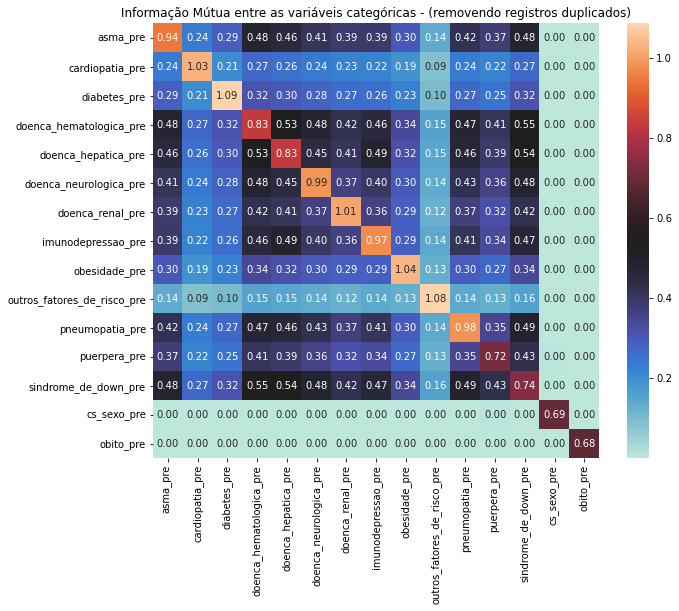

In [149]:
plot_matriz_calor(df_comor_simples,categoricas_simples,mutual_info_score,
                  "Informação Mútua entre as variáveis categóricas - (removendo registros duplicados)")
plt.show()

### Distância de Hellinger

Em seguida, vamos usar a distância de Hellinger, que computa a distância entre duas distribuições de probabilidade. Dada duas distribuições $P$ e $Q$, a distância de Hellinger pode ser expressa da seguinte forma:

$$h(P,Q) = \frac{1}{\sqrt{2}}.||\sqrt{P}-\sqrt{Q}||_2$$

Quanto maior fora a diferença, menos correlacionadas são as distribuições

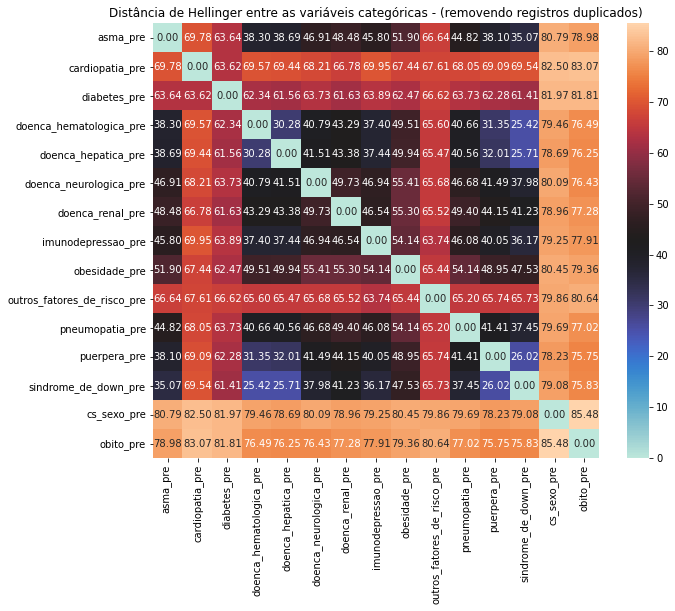

In [150]:
plot_matriz_calor(df_comor_simples,categoricas_simples,hellinger,
                  "Distância de Hellinger entre as variáveis categóricas - (removendo registros duplicados)")
plt.show()

### Distância de Jensen-Shannon

A distância de Jensen-Shannon é outra forma de medir a distância entre duas distribuições de probabilidade. Ela é dada pela seguinte equação:

$$\sqrt{\frac{D(p||m) +D(q||m)}{2}}$$

sendo m a média pontual de $p$ e $q$ e $D$ a divergência de Kullback-Leibler 

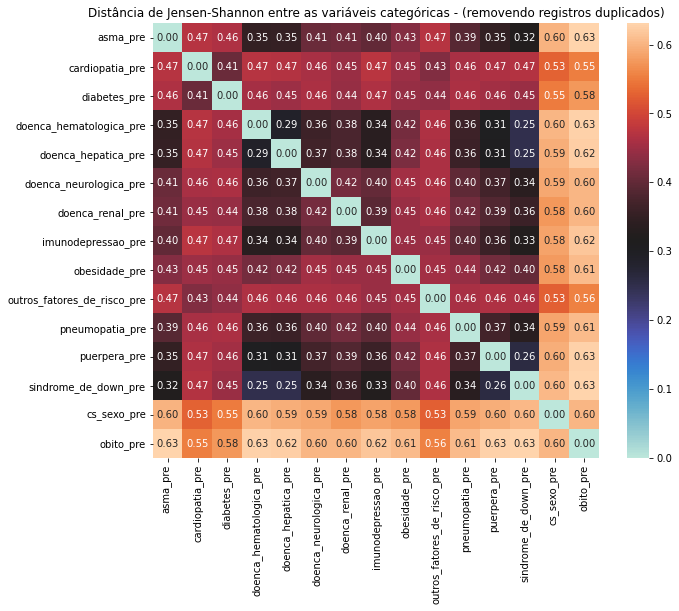

In [151]:
plot_matriz_calor(df_comor_simples,categoricas_simples,jensenshannon,
                  "Distância de Jensen-Shannon entre as variáveis categóricas - (removendo registros duplicados)")
plt.show()

### Distância de Bhattacharyya

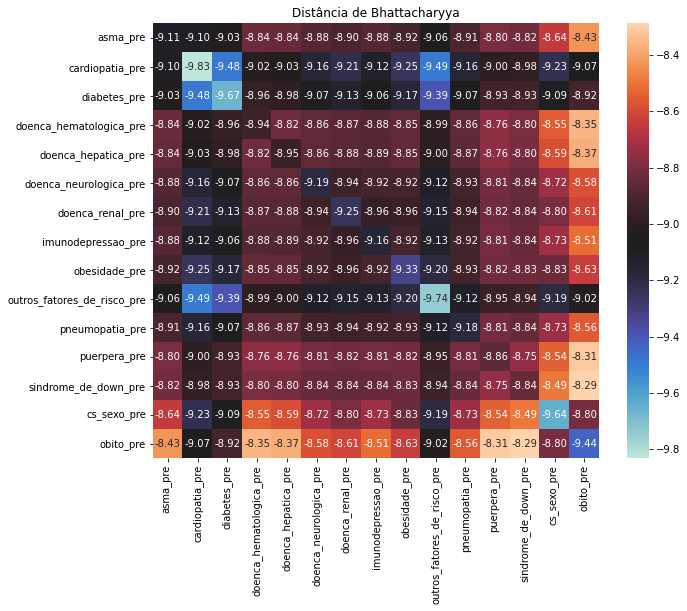

In [210]:
res = {}
for coluna1,coluna2 in product(categoricas_simples,categoricas_simples):
    res_func = dictances.bhattacharyya(df_comor_simples[coluna1].to_dict(),df_comor_simples[coluna2].to_dict())
    if coluna1 in res.keys():
        res[coluna1].append(res_func)
    else:
        res[coluna1] = [res_func]
        
plt.figure(figsize=(10,8))
sns.heatmap(pd.DataFrame(res,index=list(res.keys())),cmap="icefire",annot=True,fmt='.2f')
plt.title("Distância de Bhattacharyya")
plt.show()

### BoxPlot para cada combinação variável e desfecho

In [93]:
df_boxplot = comorbidades_regressao.assign(idade_pre = lambda x: x["idade_pre"].astype(int)) \
              .iloc[df_comor_simples.index,:].melt(id_vars = ["idade_pre","obito_pre"],
                                                    value_vars=categoricas_simples[:-1],
                                                    value_name="diagnostico",
                                                    var_name = "comorbidade")

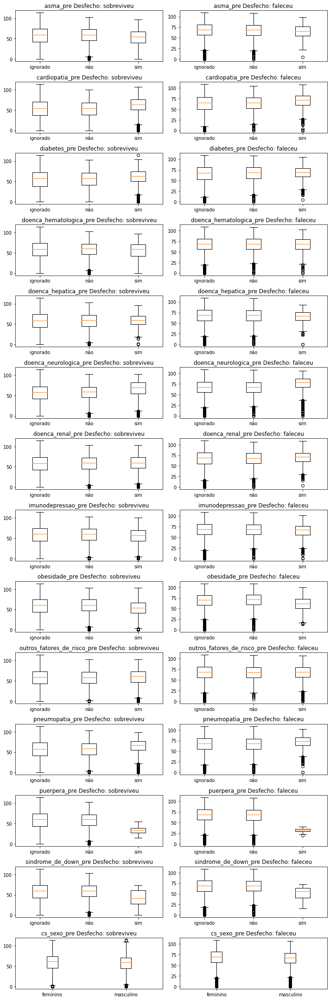

In [94]:
fig,ax = plt.subplots(nrows=14,ncols=2,figsize = (10,30))
ax = ax.flatten()
for i,(comor,o) in enumerate(product(df_boxplot.comorbidade.unique(),[0,1])):
    if o == 0:
        str_o = "Desfecho: sobreviveu"
    else:
        str_o = "Desfecho: faleceu"
    
    comor_dicionario = {key:df_boxplot \
                        .query("comorbidade == '%s' & diagnostico == '%s' & obito_pre == %d" % (comor,key,o))["idade_pre"] \
                                .tolist() 
                        for key in np.sort(df_boxplot.query("comorbidade == '%s'" % comor).diagnostico.unique())}
    ax[i].boxplot(comor_dicionario.values())
    ax[i].set_xticklabels(comor_dicionario.keys())
    ax[i].set_title(comor + " " + str_o)
plt.tight_layout()
plt.show()
    

Nota-se que, para o caso dos ignorados que sobreviveram, o grupo tem uma concentração maior na faixa abaixo dos 50 anos, enquanto os ignorados que faleceram, estão numa faixa acima. O mesmo acontece para os casos de não e sim, mas com uma diferença menor

### Verificando as relações por desfechos

#### Cramer V

<ipython-input-84-b55fa93a1737>:8: RuntimeWarning: invalid value encountered in true_divide


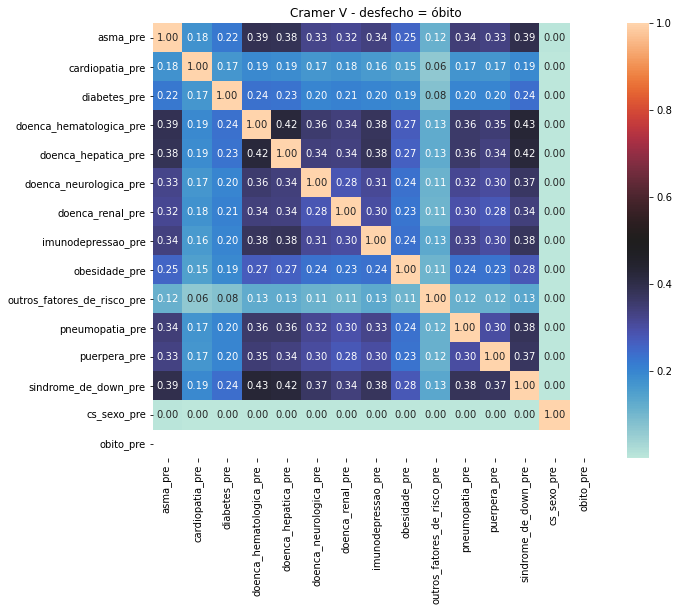

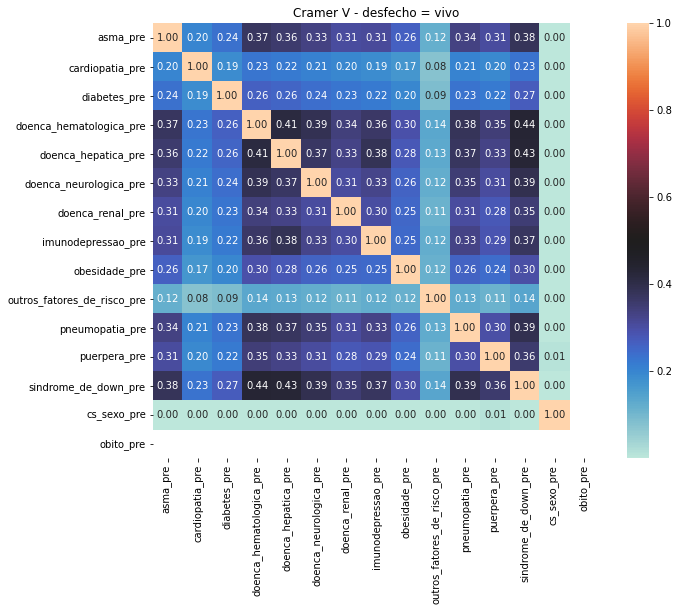

In [228]:
plot_matriz_calor(df_comor_simples.query("obito_pre == 1"),categoricas_simples,cramers_V,"Cramer V - desfecho = óbito")
plot_matriz_calor(df_comor_simples.query("obito_pre == 0"),categoricas_simples,cramers_V,"Cramer V - desfecho = vivo")
plt.show()

#### Informação Mútua

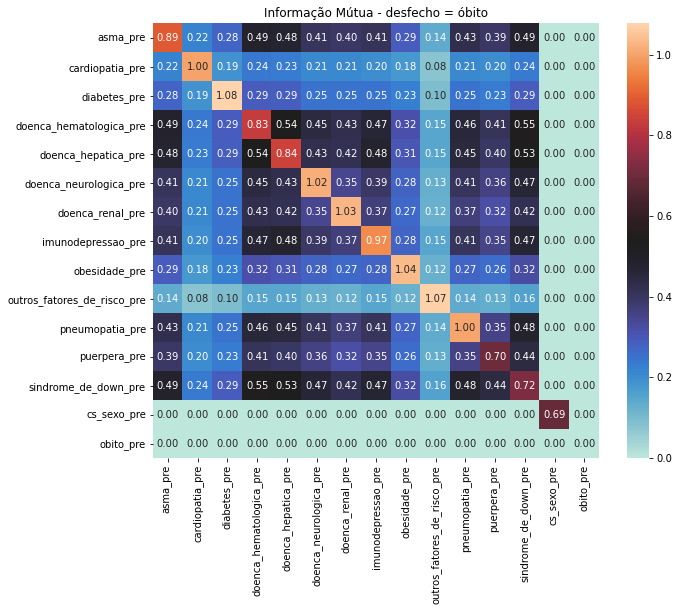

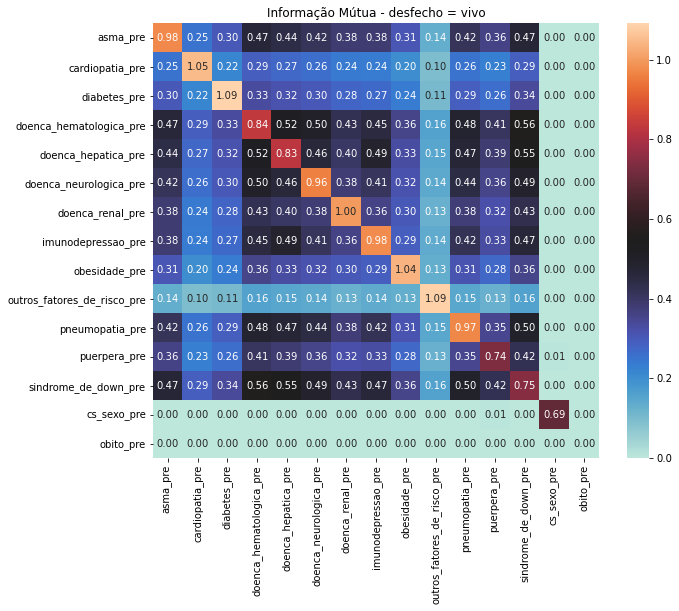

In [230]:
plot_matriz_calor(df_comor_simples.query("obito_pre == 1"),categoricas_simples,mutual_info_score,"Informação Mútua - desfecho = óbito")
plot_matriz_calor(df_comor_simples.query("obito_pre == 0"),categoricas_simples,mutual_info_score,"Informação Mútua - desfecho = vivo")
plt.show()

C:\Users\otavio.t\Anaconda3\lib\site-packages\scipy\spatial\distance.py:1280: RuntimeWarning: invalid value encountered in true_divide
C:\Users\otavio.t\Anaconda3\lib\site-packages\scipy\spatial\distance.py:1279: RuntimeWarning: invalid value encountered in true_divide


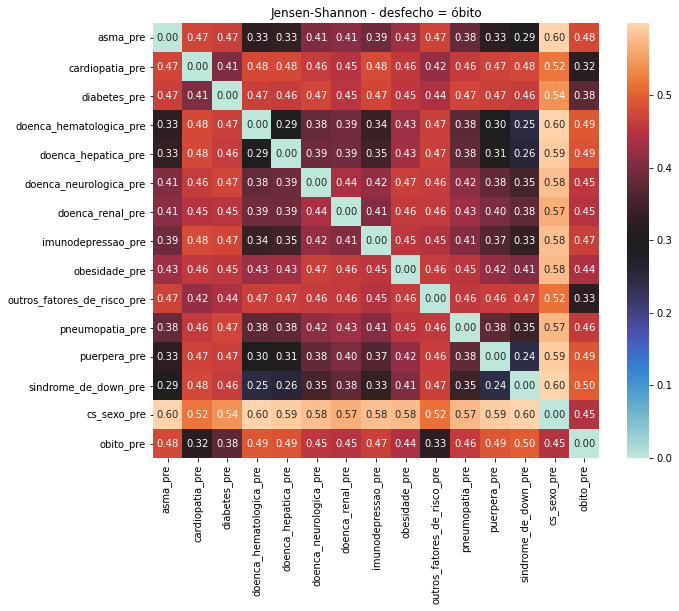

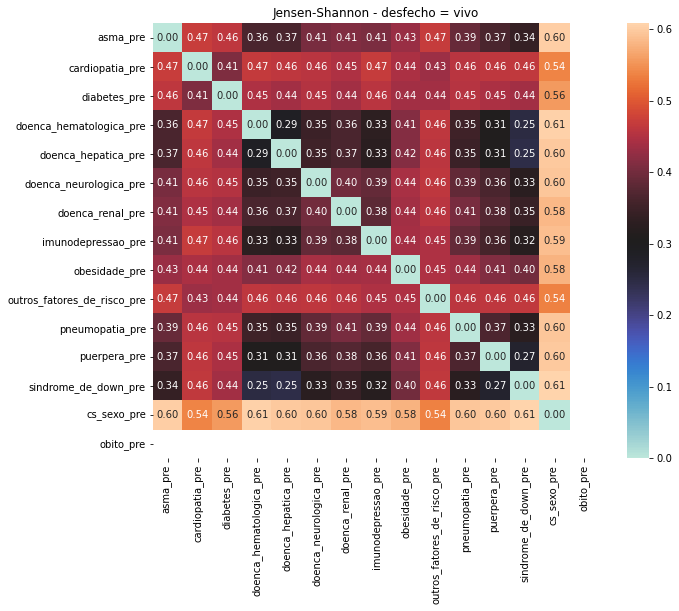

In [231]:
plot_matriz_calor(df_comor_simples.query("obito_pre == 1"),categoricas_simples,jensenshannon,"Jensen-Shannon - desfecho = óbito")
plot_matriz_calor(df_comor_simples.query("obito_pre == 0"),categoricas_simples,jensenshannon,"Jensen-Shannon - desfecho = vivo")
plt.show()

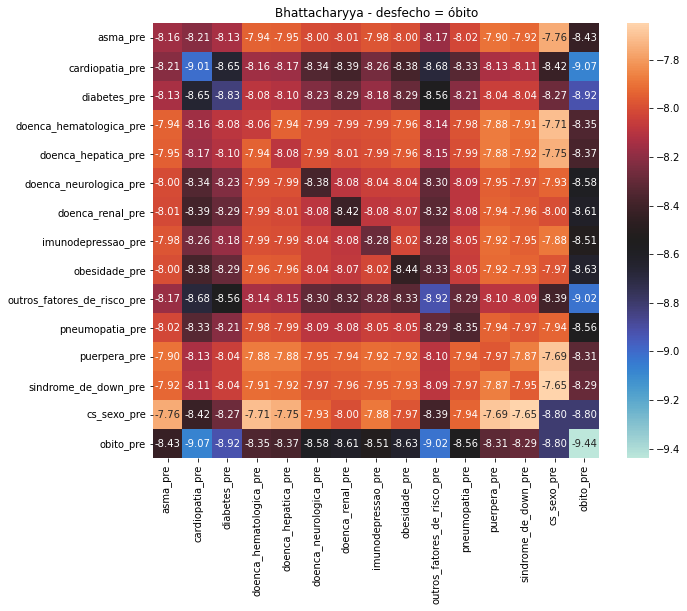

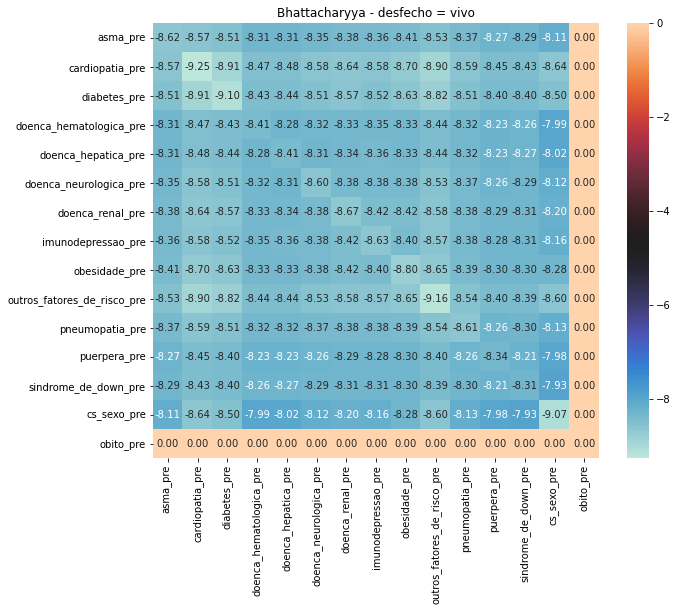

In [236]:
res = {}
for coluna1,coluna2 in product(categoricas_simples,categoricas_simples):
    res_func = dictances.bhattacharyya(df_comor_simples.query("1 == obito_pre")[coluna1].to_dict(),
                                       df_comor_simples.query("1 == obito_pre")[coluna2].to_dict())
    if coluna1 in res.keys():
        res[coluna1].append(res_func)
    else:
        res[coluna1] = [res_func]
        
_,axis = plt.subplots(figsize=(10,8))
sns.heatmap(pd.DataFrame(res,index=list(res.keys())),cmap="icefire",annot=True,fmt='.2f',ax = axis)
axis.set_title("Bhattacharyya - desfecho = óbito")

#-------------------------------------

res = {}
for coluna1,coluna2 in product(categoricas_simples,categoricas_simples):
    res_func = dictances.bhattacharyya(df_comor_simples.query("0 == obito_pre")[coluna1].to_dict(),
                                       df_comor_simples.query("0 == obito_pre")[coluna2].to_dict())
    if coluna1 in res.keys():
        res[coluna1].append(res_func)
    else:
        res[coluna1] = [res_func]
        
_,axis2 = plt.subplots(figsize=(10,8))
sns.heatmap(pd.DataFrame(res,index=list(res.keys())),cmap="icefire",annot=True,fmt='.2f',ax = axis2)
axis2.set_title("Bhattacharyya - desfecho = vivo")
plt.show()

## Salvando os dados

In [107]:
write_table_from_pandas(df_comor_simples,"../data/interim/comorbidade_simples.parquet")

In [114]:
write_table_from_pandas(comorbidades_regressao,"../data/interim/comorbidades_regressao.parquet")
write_table_from_pandas(comorbidades_regressao[[c for c in df_comor.columns if c not in colunas_cidades]]\
                        .drop_duplicates(keep='first'),
                       "../data/interim/comorbidades_regressao_nao_duplicatas_simples.parquet")

# Continuação do estudo...

A continuação desse estudo encontra-se na pasta __RMarkdown__